<a href="https://colab.research.google.com/github/MariaPetrovskaya/Data-Science-for-HR/blob/main/repo_version_da_ml_nlp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Описание проекта


*   Исследование проводилось для кадрового агентства, предоставившего данные по закрытию вакансий за период 2023 - начало 2024 года.
*   Цель (формулировка в ТЗ)
Выявить признаки вакансий, привлекающих наибольшее внимание кандидатов и успешно закрывающихся силами агентства. В рамках выполнения данной задачи можно использовать любые методы и средства, даже если они не описаны в ТЗ.







#### Описание данных (ТЗ)


*   **`id`** - Уникальный идентификатор вакансии
---
*   **`Статус`** - Статус вакансии. Категориальное значение. Возможные значения:
  *   **Архив** - вакансия закрыта, не удалось найти подходящую кандидатуру силами агентства
  *   **Закрыта нами** - вакансия закрыта, подходящая кандидатура найдена силами *   агентства;
  *   **Активна** - вакансия опубликована, идет активный поиск кандидатов;
  *   **На рассмотрении** - пул кандидатов набран, заказчик осуществляет отбор, набор новых кандидатов не ведется;
  *   **Отклонена** - заказчик отказался от рассмотрения пула кандидатов, набор кандидатов не ведется;
  *   **Черновик** - вакансия в стадии заполнения.
---
*   **`Источник лида`** - Источник вакансии. Категориальное значение. Возможные значения:
  *   **Входящая заявка** - заказчик сам заполнил форму на сайте КА;
  *   **Сорсинг** - менеджеры КА привлекли заказчика исходящим поиском;
  *   **Повторная** - это не первая вакансия компании, подбор на которую будет делать КА;
  *   **Реферальная** - заказчик пришел в КА по рекомендации от другого заказчика.
---
*   **`Менеджер`** - Менеджер, ответственный за вакансию. Возможны пустые значения в связи с тем, что это поле сначала не существовало, потом было не обязательным к заполнению.
---
*   **`Дата публикации`** - Дата, когда вакансия была опубликована на сайте КА.
---
*   **`Дата закрытия`** - Дата, когда заказчик одобрил кандидата КА или отказался от услуг КА по данной вакансии.
---
*   **`Количество просмотров`** - Количество уникальных пользователей сайта, кликнувших на заголовок вакансии, чтобы увидеть всю вакансию.
---
*  **`Количество откликов`** - Количество уникальных пользователей сайта, отправивших отклик на вакансию.
---
*   **`Позиция`** - Название вакансии
---
*   **`Зарплата от`** - Нижняя граница заработной платы для вакансии. Поля может быть пустым
---
*   **`Зарплата до`** - Верхняя граница заработной платы для вакансии. Поле может быть пустым.
---
*   **`Город`** - В каких городах предлагается работа вне зависимости от формата. Например, может быть указан город Москва - при этом занятость необязательно офисная, поэтому кандидат может находиться в другой локации.
---
*   **`Формат оформления`** - Какой формат оформления предлагает заказчик.
---
*   **`Формат работы`** - Какой формат работы предлагает заказчик.
---
*   **`Опыт`** - Какой опыт работы должен быть у соискателя.
---
*   **`Образования`** - Какое образование должно быть у соискателя.
---
*   **`Ссылка на тестовое`** - Есть ли ссылка на тестовое задание в описании вакансии.
---
*   **`Занятость`** - Какой формат занятости предлагает заказчик.
---
*   **`Обязательные требования`** - Какие обязательные требования предъявляет заказчик к кандидатам.
---
*   **`Дополнительный требования`** - Какие дополнительные требования предъявляет заказчик к кандидатам.
---
*   **`Этапы отбора`** - Этапы отбора на должность
---
*   **`Условия`** - Краткое текстовое описание условий вакансии. Может повторять информацию из других столбцов



##Импорты и инсталляции

In [ ]:
pip install pymorphy2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 49.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13706 sha256=bed9c1c029c5cc70a276ecc80eb140871b5575c900bf18ce47c62b4f747be18b
  Stored in directory: /root/.cache/pip/wheels/fc/ab/d4/5da2067ac95b36618c629a5f93f809425700506f72c9732fac
Successfully built docopt


In [ ]:
pip install catboost


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 8.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import warnings
warnings.simplefilter('ignore')

import re

In [ ]:
import numpy as np

In [ ]:
from tqdm import notebook

In [ ]:
import plotly.express as px

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from datetime import date

In [ ]:

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from pymorphy2 import MorphAnalyzer

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:

  nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import names, stopwords, words

In [ ]:
from wordcloud import WordCloud, STOPWORDS

In [ ]:

nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:

from nltk.stem import WordNetLemmatizer


In [ ]:
import torch

In [ ]:
import pymorphy2


In [ ]:
import transformers

print(transformers.__version__)

4.38.2


In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification,AutoModel

In [ ]:


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
from sklearn import metrics
import lightgbm as ltb
from sklearn.preprocessing import StandardScaler

In [ ]:
from sklearn.metrics import r2_score

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from pymystem3 import Mystem
from joblib import Parallel, delayed

In [ ]:
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

Mounted at /content/drive


##Загрузка данных

####Загрузка датасета

In [ ]:
df = pd.read_excel('/content/drive/MyDrive/Yandex for HR agency/data/vacancy_statistics_2023.xlsx', index_col=False)

#### Просмотр датасета

In [ ]:
df.sample(5) #5 rows

,id,Статус,Источник лида,Менеджер,Дата публикации,Дата закрытия,Количество просмотров,Количество откликов,Компания,Позиция,...,Формат оформления,Формат работы,Опыт,Образование,Ссылка на тестовое,Занятость,Обязательные требования,Дополнительный требования,Этапы отбора,Условия
1098,1795,Архив,Повторная,Иванова,2023-10-12,2023-10-31,23,8,Stakewolle,Менеджер IT проектов,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,Знание английского языка_x000D_\nНаличие анали...,NaN,интервью_x000D_\nвозможно тестовое задание,"Сильная техническая команда, которая будет спо..."
630,1136,Архив,Повторная,Селиверстова,2023-06-30,2023-08-15,102,17,EMAILMATRIX,Junior Project Manager,...,Трудовой договор,"Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,- у тебя есть опыт ведения переговоров и проек...,"- есть опыт разработки crm-стратегии, как само...",1. Скрининг резюме._x000D_\n2. Собеседование с...,- работу в рязанском офисе или удалённо из люб...
461,877,Архив,Повторная,Фаткуллин,2023-05-22,2023-05-23,28,4,Softline,Тестировщик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,Теоретические знания в области методологии тес...,Практический опыт программирования на каком ли...,1. скрининг резюме _x000D_\n2. интервью с рекр...,Удаленка _x000D_\nИндивидуальный график работы...
1271,2036,Акселерация,Повторная,Кариаули,2023-12-14,NaN,79,21,Thumos,Data Analyst,...,Контракт,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,"Technical Skills:_x000D_\nPython (Numpy, Panda...",Experience with web parsing and scraping._x000...,1. Interview in Russian _x000D_\n2. Assessment...,"International experience, Independent contract..."
1165,1883,Закрыта нами,Входящая заявка,Селиверстова,2023-11-02,2023-11-15,51,20,MOYO,Стажер фронтенд-разработчик,...,Контракт,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Стажировка, Полная",- желание учиться; _x000D_\n- знание Javascrip...,NaN,1. Скрининг резюме. _x000D_\n2. Собеседование ...,- неоплачиваемая стажировка длительностью 3 ме...


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1302 entries, 0 to 1301
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         1302 non-null   int64  
 1   Статус                     1302 non-null   object 
 2   Источник лида              1292 non-null   object 
 3   Менеджер                   1209 non-null   object 
 4   Дата публикации            1302 non-null   object 
 5   Дата закрытия              1144 non-null   object 
 6   Количество просмотров      1302 non-null   int64  
 7   Количество откликов        1302 non-null   int64  
 8   Компания                   1302 non-null   object 
 9   Позиция                    1302 non-null   object 
 10  Курсы ЯП                   1302 non-null   object 
 11  Зарплата от                476 non-null    float64
 12  Зарплата до                377 non-null    float64
 13  Город                      1302 non-null   objec

In [ ]:
for column in df:
    print(column)
    print(df[column].value_counts())
    print(df[column].isna().sum())
    print()
    print()



id
id
40      1
1469    1
1497    1
1495    1
1494    1
       ..
841     1
840     1
839     1
838     1
2073    1
Name: count, Length: 1302, dtype: int64
0


Статус
Статус
Архив              710
Закрыта нами       328
Отклонена          105
На рассмотрении     91
Акселерация         56
Преакселерация      12
Name: count, dtype: int64
0


Источник лида
Источник лида
Повторная          516
Сорсинг            330
Реферальная        228
Входящая заявка    218
Name: count, dtype: int64
10


Менеджер
Менеджер
Фаткуллин       567
Иванова         228
Корягина        158
Селиверстова    139
Кариаули         68
Игнатенко        38
Оборина           9
Уткина            1
Каримова          1
Name: count, dtype: int64
93


Дата публикации
Дата публикации
2023-04-10    18
2023-08-03    16
2023-08-24    15
2023-08-29    13
2023-08-23    13
              ..
2023-11-26     1
2023-01-29     1
2023-04-01     1
2023-03-19     1
2023-04-08     1
Name: count, Length: 250, dtype: int64
0


Дата закрытия
Да

##Наблюдаемые возможности на основе данных и план работы

С точки зрения бизнес-логики, в датасете содержатся следующие группы данных:


*   Признаки вакансии, очевидные для кандидата (параметры публикации вакансии)
*   Данные о бизнес процессе, не очевидные для кандидата



**Параметры вакансии, которые видит кандидат** (звездочкой я отметила те, которые могут быть параметрами поискового запроса кандидата)
*   Дата публикации            *
*   Зарплата от                *
*   Зарплата до                *
*   Город                      *
*   Формат оформления          *
*   Формат работы              *
*   Опыт                       *
*   Образование                *
*   Занятость                  *
*   Ссылка на тестовое
*   Обязательные требования
*   Дополнительный требования
*   Условия

также не искючено что кандидат видит Id вакансии, но это не существенный для него признак

**Признаки бизнес-процесса, которые кандидат не видит** (зведочкой отмечены первичные метрики активности кандидата)


*   Статус
*   Источник лида
*   Менеджер
*   Дата закрытия
*   Количество просмотров *
*   Количество откликов *
*   Этапы отбора




В качестве основной цели исследования я выбрала **изучение закономерностей реакций кандидатов на публикацию вакансии**, другие данные по бизнес-процессам не вошли в это исследование.




##Предобработка данных




In [ ]:
#создадим резервную копию
dr=df.copy

####Переименование колонок

In [ ]:
#
df=df.rename(columns={'Статус':'status', 'Источник лида':'lead_source', 'Менеджер':'manager', 'Дата публикации':'start_date', 'Дата закрытия':'end_date', 'Количество просмотров':'views',
'Количество откликов':'responses', 'Компания':'emp_brand',  'Позиция':'job_title', 'Курсы ЯП':'courses','Зарплата от':'salary_min', 'Зарплата до':'salary_max', 'Город':'city', 'Формат оформления':'contract', 'Формат работы':'format', 'Опыт':'experience', 'Образование':'education', 'Занятость':'employment', 'Ссылка на тестовое':'test_task', 'Обязательные требования':'mandatory', 'Дополнительный требования':'additional', 'Этапы отбора':'comр_stages', 'Условия':'work_conditions'
})
#})

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1302 entries, 0 to 1301
Data columns (total 24 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               1302 non-null   int64  
 1   status           1302 non-null   object 
 2   lead_source      1292 non-null   object 
 3   manager          1209 non-null   object 
 4   start_date       1302 non-null   object 
 5   end_date         1144 non-null   object 
 6   views            1302 non-null   int64  
 7   responses        1302 non-null   int64  
 8   emp_brand        1302 non-null   object 
 9   job_title        1302 non-null   object 
 10  courses          1302 non-null   object 
 11  salary_min       476 non-null    float64
 12  salary_max       377 non-null    float64
 13  city             1302 non-null   object 
 14  contract         1302 non-null   object 
 15  format           1302 non-null   object 
 16  experience       1302 non-null   object 
 17  education     

In [ ]:
print (df.duplicated().sum())

0


In [ ]:
df

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,contract,format,experience,education,test_task,employment,mandatory,additional,comр_stages,work_conditions
0,40,Архив,Повторная,Фаткуллин,2023-08-30,2023-08-30,153,35,Школа IT,Стажёр Python разработчик (неоплачиваемая стаж...,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Проектная, Частичная","Наш стек: Python, fastapi, postgres, gitlab\nП...","Основные требования к ребятам, которые хотели ...",Техническое задание и интервью,Школа бесплатна и сотрудничает с фондами.\n\nС...
1,104,Архив,Входящая заявка,Оборина,2023-08-22,2023-08-22,188,4,SymbioWay,Технический интервьюер,...,ГПХ,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Частичная,"1) Широкий IT-кругозор, понимание, какие бываю...",NaN,1) тестовое задание\n2) онлайн собеседование с...,ставка 750 рублей - за 1 обработанного кандида...
2,157,Архив,Реферальная,Фаткуллин,2023-08-28,2023-10-03,37,8,KeyHabits,JS-разработчик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,умение самостоятельно разбираться в чужом коде...,Опыт коммерческой разработки на JS будет больш...,- Отклик с сопроводительным письмом обязательн...,"- Работа удаленная, оплата в форме оклада.\n- ..."
3,181,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,33,7,GlowByte,Младший разработчик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Офис,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- Высшее IT/техническое образование либо после...,- Базовое понимание объектов БД и их применени...,- Скрининг резюме_x000D_\n- Техническое интерв...,У нас вы получите возможность:_x000D_\n- Работ...
4,184,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,51,13,Glowbyte,Младший аналитик,...,Трудовой договор,Офис,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...,Базовое понимание объектов БД и их применение_...,1. Скрининг резюме_x000D_\n2. Тестовое задание...,Стабильный оклад + премия по итогам года/проек...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,2068,Преакселерация,Повторная,Кариаули,2023-12-22,NaN,4,2,Reezonly ( reezonly.com ),Product Manager,...,Самозанятость,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Опыт проведения CustDev_x000D_\nЖелание погруз...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,Парт-тайм занятость с постепенным погружением ...
1298,2070,Акселерация,Реферальная,Фаткуллин,2023-12-22,NaN,2,2,Проект в рамках команды Голосовых Технологий Я...,Android/ IOS Developer,...,Самозанятость,"Офис, Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Проектная,Нужен разработчик мобильных приложений (ios и/...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,"Удаленка, но можно приходить в офис Яндекса пе..."
1299,2071,Преакселерация,Сорсинг,Фаткуллин,2023-12-22,NaN,4,1,Postmypost,Product Manager,...,Самозанятость,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Понимание проведений исследований _x000D_\nГот...,NaN,1. Скрининг резюме _x000D_\n2. Собеседование,Парт-тайм с постепенным развитием в проекта и ...
1300,2072,Преакселерация,Повторная,Фаткуллин,2023-12-29,NaN,3,1,IT-Incubator,Product Manager,...,"ИП, Трудовой договор","Офис, Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релеван

##Исследовательский анализ данных (EDA)

###Подробное знакомство с данными

In [ ]:
def dataset_info(dataset):
    count = 0
    for column in dataset.columns:
        count += 1
        print('Название столбца:     ',column)                          #покажет как называется столбец
        print('Длина столбца:        ',len(dataset[column]))            #отобразит длину столбца
        print('Количество пропусков: ',dataset[column].isna().sum())    #отобразит количество пропусков
        print('Тип данных в столбце: ',dataset[column].dtype)           #покажет тип данных в столбце
        print('Пример значений:      ')
        print(dataset[column].unique())                                 #отобразит уникальные значения
        print('Количество уникальных значений: ',dataset[column].nunique())  #отобразит количество уникальных значений
        print('----------------')
    print('Всего столбцов в датасете:', count)                          #подсчитает количество столбцов в датасете
    print('Количество дубликатов: ',dataset.duplicated().sum())         #подсчитает количество полных строк-дубликатов

In [ ]:
#передадим для анализа наш датасет
dataset_info(df)

Название столбца:      id
Длина столбца:         1302
Количество пропусков:  0
Тип данных в столбце:  int64
Пример значений:      
[  40  104  157 ... 2071 2072 2073]
Количество уникальных значений:  1302
----------------
Название столбца:      status
Длина столбца:         1302
Количество пропусков:  0
Тип данных в столбце:  object
Пример значений:      
['Архив' 'Закрыта нами' 'Отклонена' 'Преакселерация' 'На рассмотрении'
 'Акселерация']
Количество уникальных значений:  6
----------------
Название столбца:      lead_source
Длина столбца:         1302
Количество пропусков:  10
Тип данных в столбце:  object
Пример значений:      
['Повторная' 'Входящая заявка' 'Реферальная' nan 'Сорсинг']
Количество уникальных значений:  4
----------------
Название столбца:      manager
Длина столбца:         1302
Количество пропусков:  93
Тип данных в столбце:  object
Пример значений:      
['Фаткуллин' 'Оборина' nan 'Кариаули' 'Иванова' 'Игнатенко' 'Селиверстова'
 'Корягина' 'Уткина' 'Каримова']
Кол

### Расчет дополнительных признаков и категорий

In [ ]:
dteda=df.copy() #скупируем отдельный датасет для выполнения этих исследований

Основными первичными метриками интереса кандидатов к вакансии являются количество просмотров и откликов. Посмотрим, нормально ли распределены признаки.

In [ ]:
# Создадим функцию, которая будет строить столбчатую диаграмму
def function_seaborn(table, x, y, ytitle):
    fig, ax = plt.subplots(figsize=(15, 10))
    ax = sns.barplot(x = x, y=y,
                 data = table.sort_values(by=y, ascending=False), palette=sns.color_palette("Set2"))
    plt.ylabel(f'{ytitle}')
    plt.xlabel(f'{x}')
    plt.title(f'Столбчатая диаграмма распределения {x}')
    plt.xticks(rotation=45)
    plt.show();

In [ ]:
fig = px.histogram(dteda,
                     x= 'responses',
                     marginal = 'box',
                     title='Гистограмма распределения количества откликов')
fig.update_layout(yaxis_title_text = 'Количество вакансий',
                  xaxis_title_text = 'Количество откликов')
fig.show()

In [ ]:
fig = px.histogram(dteda,
                     x= 'views',
                     marginal = 'box',
                     title='Гистограмма распределения количества просмотров')
fig.update_layout(yaxis_title_text = 'Количество вакансий',
                  xaxis_title_text = 'Количество просмотров')
fig.show()

**Выводы:** распределение этих двух признаков похоже на нормальное (смещенное). с учетом того что датасет небольшой и других метрик нет, будем оперировать с этими как с данными, имеющими нормальное распределение.

In [ ]:
print(dteda['views'].min())#убедимся что нет нулей и определим примерный центр распределения
print(dteda['views'].max())
print(dteda['views'].median())
print(dteda['views'].mean())

1
317
30.0
40.35867895545315


In [ ]:
print(dteda['responses'].min())#убедимся что нет нулей и определим примерный центр распределения
print(dteda['responses'].max())
print(dteda['responses'].median())
print(dteda['responses'].mean())

1
151
8.0
11.560675883256529


Такие данные позволяют посчитать производную метрику - конверсию, которая будет основной метриков в данном исследовании. Она отражает долю кандидатов, отликнувшихся на вакансию после ознакомления с ней (от 0 до 1)

In [ ]:
dteda['conv']= dteda['responses']/ dteda['views']

In [ ]:
fig = px.histogram(dteda,
                     x= 'conv',
                     marginal = 'box',
                     title='Гистограмма распределения метрики конверсии')
fig.update_layout(yaxis_title_text = 'Количество вакансий',
                  xaxis_title_text = 'Конверсия')
fig.show()

In [ ]:
print(dteda['conv'].min())#убедимся что нет нулей и определим примерный центр распределения
print(dteda['conv'].max())
print(dteda['conv'].median())
print(dteda['conv'].mean())

0.011111111111111112
1.0
0.30176520033622867
0.33741852111950965


Анализ распределения этой метрики - нормальное, медиана и среднее близко, очень удачно и можно дальше опираться на статистику, сделанную на основе это метрики

А в качестве гуманитарного вывода можно сказать, что в среднем одна треть прочитавших описание вакансии откликается на нее.


#### Разделение по категориям


Возьмем вариант предложенный для "ручного" разделения на категории. "Вручную" пишется алгоритм: по каким признакам будем определять категорию вакансий. Дальше в работе будет сравнение с разделением на категории с помощью алгоритмов машинного обучения.

In [ ]:
dteda['job_cat'] = None
dteda.loc[(dteda['job_title'].str.contains('разработ', case=False))\
           |(dteda['job_title'].str.contains('developer',case=False))\
           |(dteda['job_title'].str.contains('Программист',case=False)), 'job_cat'] = 'Разработка'

dteda.loc[(dteda['job_title'].str.contains('devops', case=False)), 'job_cat'] = 'DevOps'

dteda.loc[(dteda['job_title'].str.contains('аналитик', case=False))\
          |(dteda['job_title'].str.contains('data',case=False))\
          |(dteda['job_title'].str.contains('дата',case=False))\
          |(dteda['job_title'].str.contains('данны',case=False))\
          |(dteda['job_title'].str.contains('ML',case=True))\
          |(dteda['job_title'].str.contains('NLP',case=True))\
          |(dteda['job_title'].str.contains('analyst',case=False)), 'job_cat'] = 'Аналитика'

dteda.loc[(dteda['job_title'].str.contains('менеджер', case=False))\
           |(dteda['job_title'].str.contains('manager',case=False))\
           |(dteda['job_title'].str.contains('руководитель',case=False))\
           |(dteda['job_title'].str.contains('куратор',case=False))\
           |(dteda['job_title'].str.contains('PM',case=True))\
           |(dteda['job_title'].str.contains('администратор',case=False)), 'job_cat'] = 'Менеджмент'

dteda.loc[(dteda['job_title'].str.contains('тест', case=False))\
           |(dteda['job_title'].str.contains('qa',case=False))\
           |(dteda['job_title'].str.contains('качест',case=False)), 'job_cat'] = 'Тестирование'

dteda.loc[(dteda['job_title'].str.contains('дизайн', case=False))\
           |(dteda['job_title'].str.contains('design',case=False)), 'job_cat'] = 'Дизайн'

dteda.loc[(dteda['job_title'].str.contains('таргет', case=False))\
           |(dteda['job_title'].str.contains('директ',case=False))\
           |(dteda['job_title'].str.contains('маркет', case=False))\
           |(dteda['job_title'].str.contains('контекст', case=False))\
           |(dteda['job_title'].str.contains('seo', case=False))\
           |(dteda['job_title'].str.contains('smm', case=False)), 'job_cat'] = 'Маркетинг'

dteda.loc[(dteda['job_title'].str.contains('поддерж', case=False))\
            |(dteda['job_title'].str.contains('забот',case=False)), 'job_cat'] = 'Техподдержка'

dteda.loc[(dteda['job_title'].str.contains('рекрутер', case=False))\
           |(dteda['job_title'].str.contains('recruiter',case=False))\
           |(dteda['job_title'].str.contains('ресечер',case=False))\
           |(dteda['job_title'].str.contains('рисерчер',case=False))\
           |(dteda['job_title'].str.contains('HR',case=False))\
           |(dteda['job_title'].str.contains('сорсер',case=False)), 'job_cat'] = 'HR'

dteda['job_cat'] = dteda['job_cat'].fillna('Другое')

In [ ]:
dteda

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,experience,education,test_task,employment,mandatory,additional,comр_stages,work_conditions,conv,job_cat
0,40,Архив,Повторная,Фаткуллин,2023-08-30,2023-08-30,153,35,Школа IT,Стажёр Python разработчик (неоплачиваемая стаж...,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Проектная, Частичная","Наш стек: Python, fastapi, postgres, gitlab\nП...","Основные требования к ребятам, которые хотели ...",Техническое задание и интервью,Школа бесплатна и сотрудничает с фондами.\n\nС...,0.228758,Разработка
1,104,Архив,Входящая заявка,Оборина,2023-08-22,2023-08-22,188,4,SymbioWay,Технический интервьюер,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Частичная,"1) Широкий IT-кругозор, понимание, какие бываю...",NaN,1) тестовое задание\n2) онлайн собеседование с...,ставка 750 рублей - за 1 обработанного кандида...,0.021277,Другое
2,157,Архив,Реферальная,Фаткуллин,2023-08-28,2023-10-03,37,8,KeyHabits,JS-разработчик,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,умение самостоятельно разбираться в чужом коде...,Опыт коммерческой разработки на JS будет больш...,- Отклик с сопроводительным письмом обязательн...,"- Работа удаленная, оплата в форме оклада.\n- ...",0.216216,Разработка
3,181,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,33,7,GlowByte,Младший разработчик,...,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- Высшее IT/техническое образование либо после...,- Базовое понимание объектов БД и их применени...,- Скрининг резюме_x000D_\n- Техническое интерв...,У нас вы получите возможность:_x000D_\n- Работ...,0.212121,Разработка
4,184,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,51,13,Glowbyte,Младший аналитик,...,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...,Базовое понимание объектов БД и их применение_...,1. Скрининг резюме_x000D_\n2. Тестовое задание...,Стабильный оклад + премия по итогам года/проек...,0.254902,Аналитика
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,2068,Преакселерация,Повторная,Кариаули,2023-12-22,NaN,4,2,Reezonly ( reezonly.com ),Product Manager,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Опыт проведения CustDev_x000D_\nЖелание погруз...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,Парт-тайм занятость с постепенным погружением ...,0.500000,Менеджмент
1298,2070,Акселерация,Реферальная,Фаткуллин,2023-12-22,NaN,2,2,Проект в рамках команды Голосовых Технологий Я...,Android/ IOS Developer,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Проектная,Нужен разработчик мобильных приложений (ios и/...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,"Удаленка, но можно приходить в офис Яндекса пе...",1.000000,Разработка
1299,2071,Преакселерация,Сорсинг,Фаткуллин,2023-12-22,NaN,4,1,Postmypost,Product Manager,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Понимание проведений исследований _x000D_\nГот...,NaN,1. Скрининг резюме _x000D_\n2. Собеседование,Парт-тайм с постепенным развитием в проекта и ...,0.250000,Менеджмент
1300,2072,Преакселерация,Повторная,Фаткуллин,2023-12-29,NaN,3,1,IT-Incubator,Product Manager,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,● наличие опыта в продуктовом менеджмента; _x0...,NaN,1. Скрининг резюме _x000D_\n2. Возможно неболь...,● Конкурентный уровень заработной платы;_x000D...,

In [ ]:
fig = px.histogram(dteda,
                     x= 'job_cat',
                     histnorm='percent',
                     title='Распределение названий вакансий по категориям, алгоритм классификации составлен человеком ',
                     text_auto = True)
fig.update_layout(yaxis_title_text = 'Количество вакансий',
                  xaxis_title_text = 'Категория',
                  xaxis = {"categoryorder":"total descending"})
fig.update_traces(texttemplate='%{y:.2f}%')
fig.show()

**Итоги** в датасет добавлены 2 новых признака: конверсия (просмотров в отклики) и категория вакансии.

### Исследование статистических закономерностей



#### Средние показатели просмотров по категориям



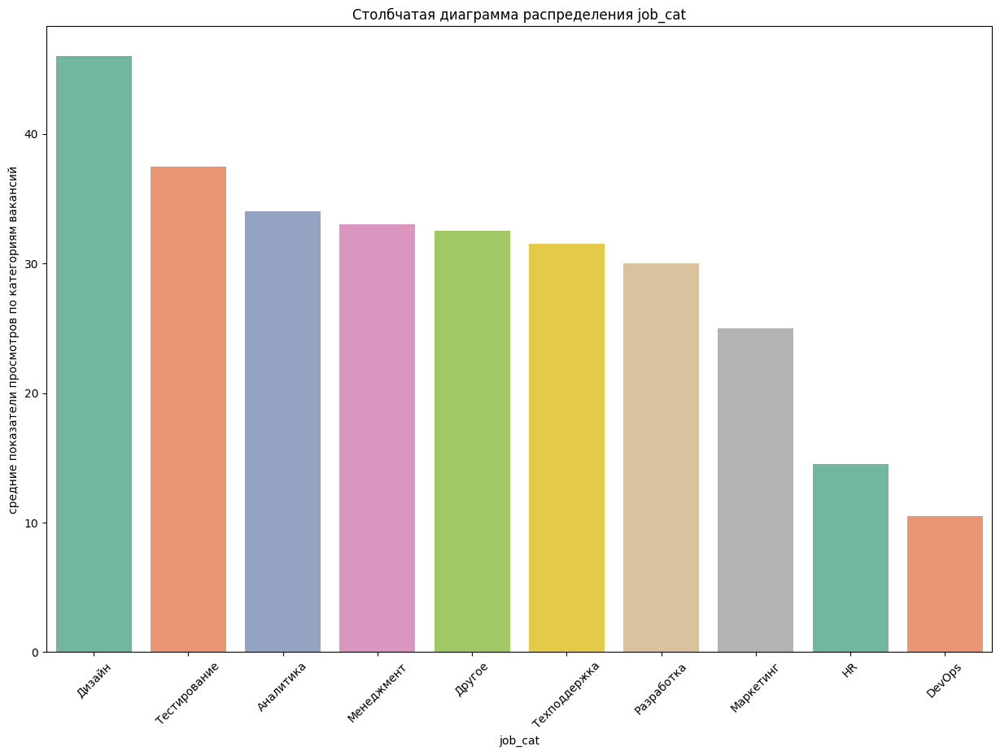

In [ ]:
response = dteda.pivot_table(index='job_cat',
                                 values='views',
                                 aggfunc='median').reset_index()

function_seaborn(table=response, x='job_cat', y='views', ytitle='средние показатели просмотров по категориям вакансий')

Самые высокие средние показатели просмотра по категориям вакансий - в категории "Дизайн". Присутствие этой категории по количеству вакансий - менее 6%. Очевиден дефицит предложения в этой категории.

#### Конверсия просмотров в отклики по категориям

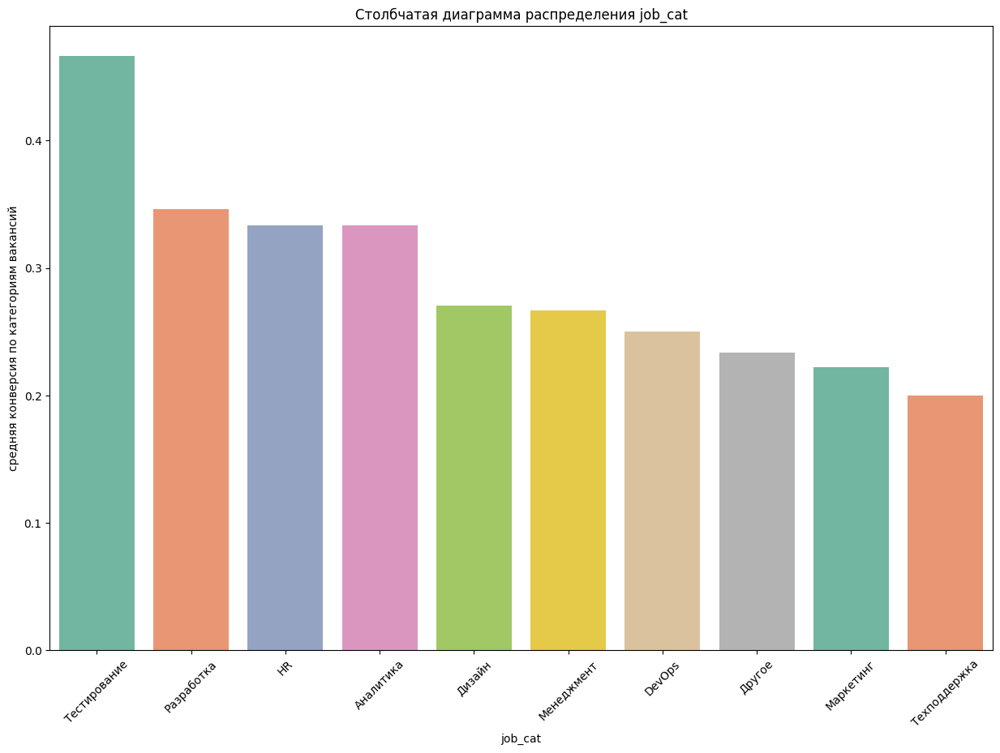

In [ ]:
response = dteda.pivot_table(index='job_cat',
                                 values='conv',
                                 aggfunc='median').reset_index()

function_seaborn(table=response, x='job_cat', y='conv', ytitle='средняя конверсия по категориям вакансий')

Примечательно, что внутри IT очень существенные различия по отзывчивости кандидатов. Тестировщики откликаются в почти в половине случаев, техподдержка - почти в 2 раза реже.

##NLP and ML методы

---



###"Мешок слов"

Для начала попробуем применить сравнительно простые и быстро работающие NLP методы. "Мешок слов" - упрощенное представление текста, в котором важно только количество (частота присутствия) слов, но их порядок в предложениях не может быть учтен. В качестве инструмента визуализации будем использовать Wordcloud.

In [ ]:
dv=df.copy() #делаем отдельную копию датасета для работы с этим разделом

In [ ]:
dvv=df.copy() #делаем вторую копию датасета для работы с этим разделом

In [ ]:
print(dv.isna().sum())

id                    0
status                0
lead_source          10
manager              93
start_date            0
end_date            158
views                 0
responses             0
emp_brand             0
job_title             0
courses               0
salary_min          826
salary_max          925
city                  0
contract              0
format                0
experience            0
education             0
test_task          1195
employment            0
mandatory             0
additional          628
comр_stages           0
work_conditions       0
dtype: int64


####Функции для предварительной обработки текста (Text preprocessing)

In [ ]:
# Загрузка стоп-слов (убираются высокочастотные слова, не несущие специфичного смысла)
nltk.download('stopwords')
stop_words = set(stopwords.words('russian'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
morph = MorphAnalyzer() # морфологический анализатор для русского языка, написанный на языке Python

In [ ]:
# Функция для лемматизации слов - слова заменяются на основную словоформу
def lemmatize_words(text, morph):
    words = word_tokenize(text)
    lemmatized_words = [morph.parse(word)[0].normal_form for word in words]
    return ' '.join(lemmatized_words)

При рассмотрении текстов после лемматизации были обнаружены лишние токены (например _x000В_), поэтому добавляется дополнительная функция обработки текста с помощью регулярных выражений.

In [ ]:
# set regular expressions for text preprocessing
HTML = r'<.*?>' # html tags
COMMENTS = r'[\(\[][A-Za-z ]+[\)\]]' # comments in parentheses
LETTERS = r'[^\w\s]+[а-яА-Я]' #any letter
SPACES = r'([ ])\1+' # repeated spaces
DOTS = r'[\.]+' # punctuation mark ellipsis
SYMB = r"[^\w\d'\s]" # punctuation marks other than apostrophe

In [ ]:

def dataset_clean(x, nan_value= None):
    for column in x:
        txt = re.sub(HTML, ' ', x) # html tags change to spaces
        #txt = re.sub(COMMENTS, ' ', txt) # comments in parentheses change to spaces
        #txt = re.sub(LETTERS, ' ', txt) # anything that isn't a letter is a space
        txt = re.sub(DOTS, r'.', txt) # punctuation mark ellipsis change to dots
        txt = re.sub(SPACES, r'\1', txt) # repeated spaces change to one space
        #txt = re.sub(SYMB, '', txt) # punctuation marks other than apostrophe change to an empty string
        txt = re.sub('_x000d_', '', txt) # 'www' change to an empty string
        #txt = txt.lstrip().rstrip().replace("\n","") # left space trimming
        #txt = txt.encode('ascii', 'ignore').decode() # remove all non-ascii characters
        #txt = txt.lower() # to lowercase
        txt = ' '.join(txt.split())
    return txt

In [ ]:
# Создадим функцию для построения облака слов
def function_worldcloud(text):
  wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(text)
  plt.figure(figsize=(10, 8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.show()

In [ ]:
# Инициализация стоп-слов
stop_words = set(stopwords.words('russian'))

# Добавление собственных вариантов к списку стоп-слов
custom_stop_words = set(['работа', 'работать'])

# Объединение стандартных и собственных стоп-слов
stop_words = stop_words.union(custom_stop_words)

# Инициализация лемматизатора и морфологического анализатора
morph = pymorphy2.MorphAnalyzer()
lemmatizer = WordNetLemmatizer()

# Функция для токенизации, лемматизации и удаления стоп-слов
def tokenize_lemmatize_and_filter(text):
    tokens = word_tokenize(text)
    lemmatized_tokens = [lemmatizer.lemmatize(morph.parse(token)[0].normal_form) for token in tokens]
    return [token for token in lemmatized_tokens if token.lower() not in stop_words and token.isalpha()]

# Функция для создания и отображения облака слов
def WC(text):
    wordcloud = WordCloud(background_color='white', width=800, height=600).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    return plt.show()

Влияние текстового описания условий работы (признак "work_conditions") на конверсию просмотров в отклики (признак "conv")

In [ ]:
dv['conv']=dv['responses']/dv['views']

Создадим новый столбец, показывающий привлекательность вакансии ('attractive') в зависимости от конверсии.
Введем три категории:

*   "Низкая привлекательность" (low)
*   "Средняя привлекательность"(middle)
*   "Высокая привлекательность"(high)


Разделим столбец с конверсией на три части с помощью квантилей.

In [ ]:
# Определение квантилей для разбиения на категории
low_quantile = dv['conv'].quantile(1/3)
high_quantile = dv['conv'].quantile(2/3)

display(low_quantile)
high_quantile

0.22857142857142856

0.4056437389770718

In [ ]:
def categorize_popularity(views):
    # Определение категории популярности
    if views <= low_quantile:
        return "low"
    elif views <= high_quantile:
        return "middle"
    else:
        return "high"

# Применение функции к столбцу "conv" и создание нового столбца с категориями "attractive"
dv['attractive'] = dv['conv'].apply(categorize_popularity)

####Уникальные признаки популярных и не популярных текстов

Сначала проверим идею, могут ли быть уникальные признаки - слова (токены) которые есть только в объявлениях с высокой или низкой конверсией. Попробуем найти слова - триггеры, влияющие на уровень отклика.

In [ ]:
dv['language'] = dv['mandatory']+dv['work_conditions']+dv['job_title']
#столбец "additional" сюда не включен, тк. в нем слишком много пропусков и это проблема

In [ ]:
drrr=dv.copy()
drrr

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,education,test_task,employment,mandatory,additional,comр_stages,work_conditions,conv,attractive,language
0,40,Архив,Повторная,Фаткуллин,2023-08-30,2023-08-30,153,35,Школа IT,Стажёр Python разработчик (неоплачиваемая стаж...,...,"Другое, Около-релевантное (например, техническ...",NaN,"Проектная, Частичная","Наш стек: Python, fastapi, postgres, gitlab\nП...","Основные требования к ребятам, которые хотели ...",Техническое задание и интервью,Школа бесплатна и сотрудничает с фондами.\n\nС...,0.228758,middle,"Наш стек: Python, fastapi, postgres, gitlab\nП..."
1,104,Архив,Входящая заявка,Оборина,2023-08-22,2023-08-22,188,4,SymbioWay,Технический интервьюер,...,"Другое, Около-релевантное (например, техническ...",NaN,Частичная,"1) Широкий IT-кругозор, понимание, какие бываю...",NaN,1) тестовое задание\n2) онлайн собеседование с...,ставка 750 рублей - за 1 обработанного кандида...,0.021277,low,"1) Широкий IT-кругозор, понимание, какие бываю..."
2,157,Архив,Реферальная,Фаткуллин,2023-08-28,2023-10-03,37,8,KeyHabits,JS-разработчик,...,"Другое, Около-релевантное (например, техническ...",NaN,Полная,умение самостоятельно разбираться в чужом коде...,Опыт коммерческой разработки на JS будет больш...,- Отклик с сопроводительным письмом обязательн...,"- Работа удаленная, оплата в форме оклада.\n- ...",0.216216,low,умение самостоятельно разбираться в чужом коде...
3,181,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,33,7,GlowByte,Младший разработчик,...,"Около-релевантное (например, техническое образ...",NaN,Полная,- Высшее IT/техническое образование либо после...,- Базовое понимание объектов БД и их применени...,- Скрининг резюме_x000D_\n- Техническое интерв...,У нас вы получите возможность:_x000D_\n- Работ...,0.212121,low,- Высшее IT/техническое образование либо после...
4,184,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,51,13,Glowbyte,Младший аналитик,...,"Около-релевантное (например, техническое образ...",NaN,Полная,- ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...,Базовое понимание объектов БД и их применение_...,1. Скрининг резюме_x000D_\n2. Тестовое задание...,Стабильный оклад + премия по итогам года/проек...,0.254902,middle,- ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,2068,Преакселерация,Повторная,Кариаули,2023-12-22,NaN,4,2,Reezonly ( reezonly.com ),Product Manager,...,"Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Опыт проведения CustDev_x000D_\nЖелание погруз...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,Парт-тайм занятость с постепенным погружением ...,0.500000,high,Опыт проведения CustDev_x000D_\nЖелание погруз...
1298,2070,Акселерация,Реферальная,Фаткуллин,2023-12-22,NaN,2,2,Проект в рамках команды Голосовых Технологий Я...,Android/ IOS Developer,...,"Другое, Около-релевантное (например, техническ...",NaN,Проектная,Нужен разработчик мобильных приложений (ios и/...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,"Удаленка, но можно приходить в офис Яндекса пе...",1.000000,high,Нужен разработчик мобильных приложений (ios и/...
1299,2071,Преакселерация,Сорсинг,Фаткуллин,2023-12-22,NaN,4,1,Postmypost,Product Manager,...,"Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Понимание проведений исследований _x000D_\nГот...,NaN,1. Скрининг резюме _x000D_\n2. Собеседование,Парт-тайм с постепенным развитием в проекта и ...,0.250000,middle,Понимание проведений исследований _x000D_\nГот...
1300,2072,Преакселерация,Повторная,Фаткуллин,2023-12-29,NaN,3,1,IT-Incubator,Product Manager,...,"Другое, Около-релевантное (например, техническ...",NaN,Полная,● наличие опыта в продуктовом менеджмента; _x0...,NaN,1. Скрининг резюме _x000D_\n2. Возможно неболь...,● Конкурентный уровень заработной платы;_x000D...,0.333333,middle,● наличие опыта в продуктовом менеджмента; _x0...


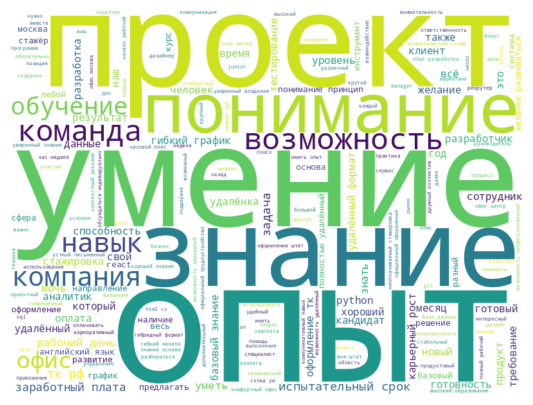

In [ ]:
# Объединение текста из всех строк в одну переменную
all_text = ' '.join(drrr['language'].tolist())
all_text = all_text.lower()

# Токенизация, лемматизация и фильтрация стоп-слов для всего текста
all_tokens = tokenize_lemmatize_and_filter(all_text)

# Объединение токенов для создания облака слов
text_for_wordcloud = ' '.join(all_tokens)

WC(text_for_wordcloud)

In [ ]:
text_high_popularity = ' '.join(drrr.query('attractive == "high"')['language'])
# function_worldcloud(text_high_popularity)

In [ ]:
text_low_popularity = ' '.join(drrr.query('attractive == "low"')['language'])
# function_worldcloud(text_low_popularity)

In [ ]:
all_text = ''.join(drrr['language'].tolist())

In [ ]:
all_text

'Наш стек: Python, fastapi, postgres, gitlab\nПожелания:\n- Опыт использования одного из фреймворков/библиотек для написания сервисов на RESTful API\n- Понимание как работает асинхронность и многопоточность в Python\n- Знание основ Git\n- Базовое знание SQLШкола бесплатна и сотрудничает с фондами.\n\nСтажировка не оплачивается участникам.\n\nВ конце проекта ты сразу сможешь пополнить им своё портфолио. Проект будет реализован людьми для людей.Стажёр Python разработчик (неоплачиваемая стажировка для НКО)1) Широкий IT-кругозор, понимание, какие бывают языки программирования и для чего они используются.\n2) Владение хотя быть одним современным языком программирования (Java, Python, PHP, C#, Go, JavaScript и/или C++), желательно знание на базовом уровне языка запросов SQL и базовые навыки вёрстки веб-страниц (HTML/CSS).\n3) Свободное владение разговорным английским языком.\n4) Системность, аналитический склад ума и умение чувствовать других людей.\n5) Желание и готовность проводить собесед

In [ ]:
good_words=[]
commom_words=[]
bad_words=[]
for word in all_text:
    if (word in text_high_popularity and word in text_low_popularity):
        commom_words.append(word),
    if word in text_high_popularity and word not in text_low_popularity:
        good_words.append(word),
    if word not in text_high_popularity and word in text_low_popularity:
        bad_words.append(word)

In [ ]:
mistik_good =''.join(good_words)

In [ ]:
mistik_bad =''.join(bad_words)

In [ ]:
display(mistik_good)

"'✔✔✔🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹🤗✔✔✔❤✔✔✔✔✔✔\u2009🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹🤗→→→→→→→→→→→→→→→''🤩✊→→→🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹✔✔✔✔✔✔✔✔✔✔✔✔📚🤩🤩📚\u2009🌟🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹🔹✔✔✔✔✔✔✔✔💡'"

In [ ]:
display(mistik_bad)

'>>>[]~\uf0d8\uf0d8\uf0d8\uf0d8~̆①②③④⑤①②③④⑤😎🎁̆̆̆```````\uf0d8\uf0d8\uf0d8\uf0d8````````①②③④⑤>>−>>>≈≈≈≈≈😇ーー📌📌📌📌🏁🧑🎓💪🏆⭐🧠🧑🏫☝`~>>><😃🔥🔥🔥>>>>>>📌📌📌📌🌎💰🌎💰`①②③④⑤−~'

In [ ]:
bad_words

['>',
 '>',
 '>',
 '[',
 ']',
 '~',
 '\uf0d8',
 '\uf0d8',
 '\uf0d8',
 '\uf0d8',
 '~',
 '̆',
 '①',
 '②',
 '③',
 '④',
 '⑤',
 '①',
 '②',
 '③',
 '④',
 '⑤',
 '😎',
 '🎁',
 '̆',
 '̆',
 '̆',
 '`',
 '`',
 '`',
 '`',
 '`',
 '`',
 '`',
 '\uf0d8',
 '\uf0d8',
 '\uf0d8',
 '\uf0d8',
 '`',
 '`',
 '`',
 '`',
 '`',
 '`',
 '`',
 '`',
 '①',
 '②',
 '③',
 '④',
 '⑤',
 '>',
 '>',
 '−',
 '>',
 '>',
 '>',
 '≈',
 '≈',
 '≈',
 '≈',
 '≈',
 '😇',
 'ー',
 'ー',
 '📌',
 '📌',
 '📌',
 '📌',
 '🏁',
 '🧑',
 '🎓',
 '💪',
 '🏆',
 '⭐',
 '🧠',
 '🧑',
 '🏫',
 '☝',
 '`',
 '~',
 '>',
 '>',
 '>',
 '<',
 '😃',
 '🔥',
 '🔥',
 '🔥',
 '>',
 '>',
 '>',
 '>',
 '>',
 '>',
 '📌',
 '📌',
 '📌',
 '📌',
 '🌎',
 '💰',
 '🌎',
 '💰',
 '`',
 '①',
 '②',
 '③',
 '④',
 '⑤',
 '−',
 '~']

In [ ]:
common=''.join(commom_words)

In [ ]:
common

'Наш стек: Python, fastapi, postgres, gitlab\nПожелания:\n- Опыт использования одного из фреймворков/библиотек для написания сервисов на RESTful API\n- Понимание как работает асинхронность и многопоточность в Python\n- Знание основ Git\n- Базовое знание SQLШкола бесплатна и сотрудничает с фондами.\n\nСтажировка не оплачивается участникам.\n\nВ конце проекта ты сразу сможешь пополнить им своё портфолио. Проект будет реализован людьми для людей.Стажёр Python разработчик (неоплачиваемая стажировка для НКО)1) Широкий IT-кругозор, понимание, какие бывают языки программирования и для чего они используются.\n2) Владение хотя быть одним современным языком программирования (Java, Python, PHP, C#, Go, JavaScript и/или C++), желательно знание на базовом уровне языка запросов SQL и базовые навыки вёрстки веб-страниц (HTML/CSS).\n3) Свободное владение разговорным английским языком.\n4) Системность, аналитический склад ума и умение чувствовать других людей.\n5) Желание и готовность проводить собесед

**Выводы** уникальных слов, которые могут быть только в объявлениях с высокой или низкой конверсией, не обнаружено. Зато выявлены другие символы: эмодзи, знаки маркировки текста. В принципе, это даже можно интерпретировать.

#### 1. Влияние текстового описания условий работы на отклики

Облака слов для вакансий с хорошей и плохой конверсией очень похожи. Попробуем аналогично предыдущему примеру снять слой из самых высокочастотных токенов и посмотреть что под ним.

In [ ]:
print(dv['work_conditions'].head(10))

0    Школа бесплатна и сотрудничает с фондами.\n\nС...
1    ставка 750 рублей - за 1 обработанного кандида...
2    - Работа удаленная, оплата в форме оклада.\n- ...
3    У нас вы получите возможность:_x000D_\n- Работ...
4    Стабильный оклад + премия по итогам года/проек...
5    Стек: JavaScript _x000D_\nСрок выполнения: 15 ...
6    ТОЛЬКО ОФИСНАЯ ЗАНЯТОСТЬ В МОСКВЕ _x000D_\n_x0...
7    Гибрид или офис в 5 минутах от станции м. Войк...
8    Друзья, на эту позицию вместо себя ищет кандид...
9    В ходе стажировки стажёры решают реальные зада...
Name: work_conditions, dtype: object


In [ ]:
# Обработка текста: удаление стоп-слов и лемматизация
dv['work_conditions'] = dv['work_conditions'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))
dv['work_conditions'] = dv['work_conditions'].apply(lambda x: lemmatize_words(x, morph))


In [ ]:
print(dv['work_conditions'].head(10))

0    школа бесплатный сотрудничать фонд . стажировк...
1    ставка 750 рубль - 1 обработать кандидат ( про...
2    - удалённый , оплата форма оклад . - график ги...
3    получить возможность : _x000d_ - крупный компа...
4    стабильный оклад + премия итог года/проекта._x...
5    стек : javascript _x000d_ срок выполнение : 15...
6    офисный занятость москва _x000d_ _x000d_ корпо...
7    гибрид офис 5 минута станция м. войковская/ мц...
8    друг , позиция вместо искать кандидат выпускни...
9    ход стажировка стажёр решать реальный задача п...
Name: work_conditions, dtype: object


In [ ]:
dv['work_conditions'] = dv['work_conditions'].apply(dataset_clean)

In [ ]:
print(dv['work_conditions'].head(10))

0    школа бесплатный сотрудничать фонд . стажировк...
1    ставка 750 рубль - 1 обработать кандидат ( про...
2    - удалённый , оплата форма оклад . - график ги...
3    получить возможность : - крупный компания росс...
4    стабильный оклад + премия итог года/проекта. г...
5    стек : javascript срок выполнение : 15 рабочий...
6    офисный занятость москва корпоративный английс...
7    гибрид офис 5 минута станция м. войковская/ мц...
8    друг , позиция вместо искать кандидат выпускни...
9    ход стажировка стажёр решать реальный задача п...
Name: work_conditions, dtype: object


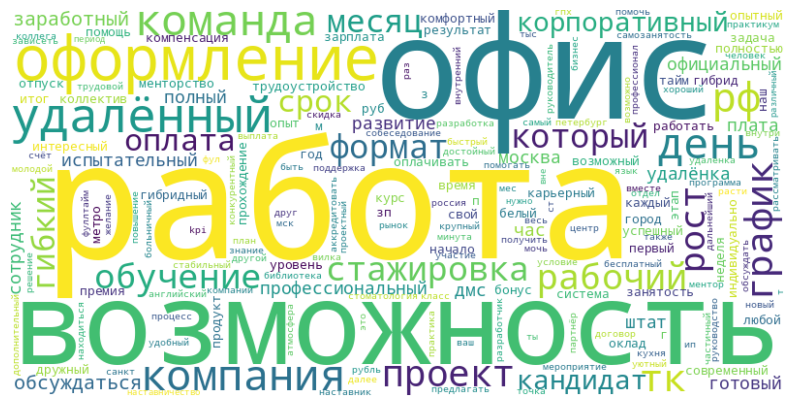

In [ ]:
text_high_popularity = ' '.join(dv.query('attractive == "high"')['work_conditions'])
function_worldcloud(text_high_popularity)

In [ ]:
text_high_popularity

"- проектный занятость последующий возможность фуллтайм трудоустройства - оформление гпх - удалёнка ( разница 3-4 час мск ) - зп обсуждаться индивидуально 100 % офис москва ( проспект мир ) фул-тайм оформление тк ( только гражданин рф ) искать специалист , который готовый быстро вникнуть специфика задача . самоходность - готовый `` водить рука '' долго . команда проект , который нужно дружный готовый помочь , ответить вопрос делиться материал работа . важно ! друг , вакансия опубликовать удалённый , сделать видимый ля кандидат разный город . факт этот роль доступный кандидат санкт петербург кандидат готовый самостоятельно релоцироваться спб факт получение офера. офисе/ гибридный формат . офис расположить адрес : санкт-петербург , офис `` невский ратуша '' дегтярный переулок 11б `` цифергауз '' остров новый голландия. предстоять коммуникация команда продукт владелец продукт тот , понять особенность продукт , пользователь , ценность продукт пользователь бизнес , и , конечный итог , опред

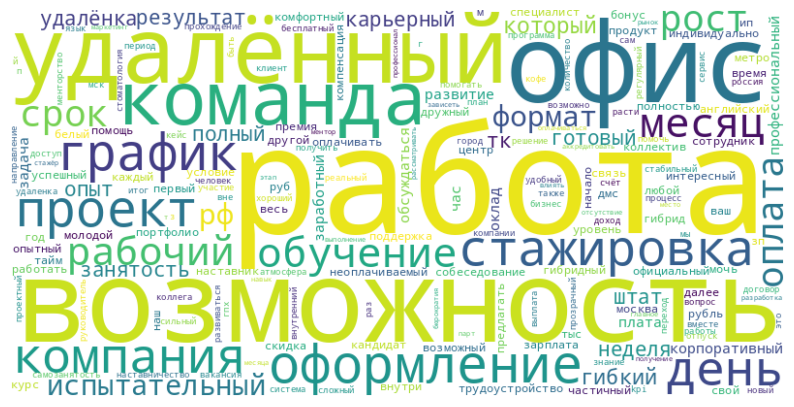

In [ ]:
text_low_popularity = ' '.join(dv.query('attractive == "low"')['work_conditions'])
function_worldcloud(text_low_popularity)

Выводы: никаких очевидных различий в словаре описаний условий работы не наблюдается. Попробуем убрать несколько самых высокочастотных слов (тематические признаки), может быть отличия будут более наглядные.

In [ ]:

def dataset_postclean1(x, nan_value= None):
    for column in x:
  # subs = subs[1:] # remove the first promotional subtitle
        txt = re.sub(HTML, ' ', x) # html tags change to spaces
        #txt = re.sub(COMMENTS, ' ', txt) # comments in parentheses change to spaces
        #txt = re.sub(LETTERS, ' ', txt) # anything that isn't a letter is a space
        txt = re.sub(DOTS, r'.', txt) # punctuation mark ellipsis change to dots
        txt = re.sub(SPACES, r'\1', txt) # repeated spaces change to one space
        #txt = re.sub(SYMB, '', txt) # punctuation marks other than apostrophe change to an empty string
        txt = re.sub('работа', '', txt) # 'www' change to an empty string
        txt = re.sub('удаленный', '', txt) # 'www' change to an empty string
        txt = re.sub('оформление', '', txt) # 'www' change to an empty string
        txt = re.sub('офис', '', txt) # 'www' change to an empty string
        txt = re.sub('день', '', txt) # 'www' change to an empty string
        txt = re.sub('_x000d_', '', txt) # 'www' change to an empty string
        txt = re.sub('удалённый', '', txt) # 'www' change to an empty string
        txt = re.sub('команда', '', txt) # 'www' change to an empty string
        txt = re.sub('возможность', '', txt) # 'www' change to an empty string
        txt = re.sub('компания', '', txt) # 'www' change to an empty string
        #txt = re.sub('оформление', '', txt) # 'www' change to an empty string
        #txt = txt.lstrip().rstrip().replace("\n","") # left space trimming
        #txt = txt.encode('ascii', 'ignore').decode() # remove all non-ascii characters
        #txt = txt.lower() # to lowercase
        txt = ' '.join(txt.split())
    return txt

In [ ]:
dv['work_conditions'] = dv['work_conditions'].apply(dataset_postclean1)

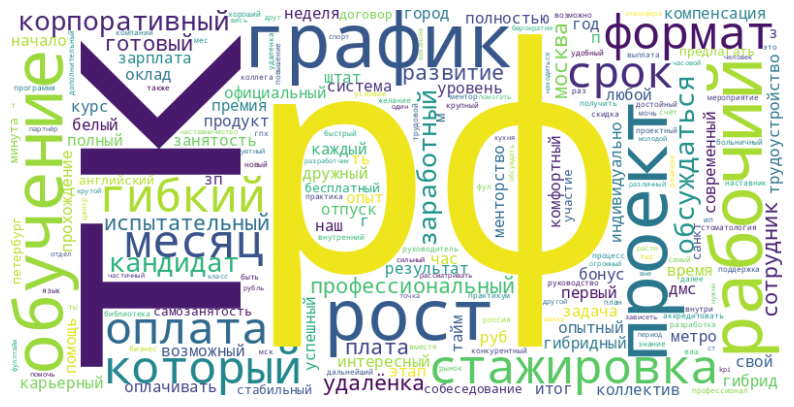

In [ ]:
text_high_popularity = ' '.join(dv.query('attractive == "high"')['work_conditions'])
function_worldcloud(text_high_popularity)

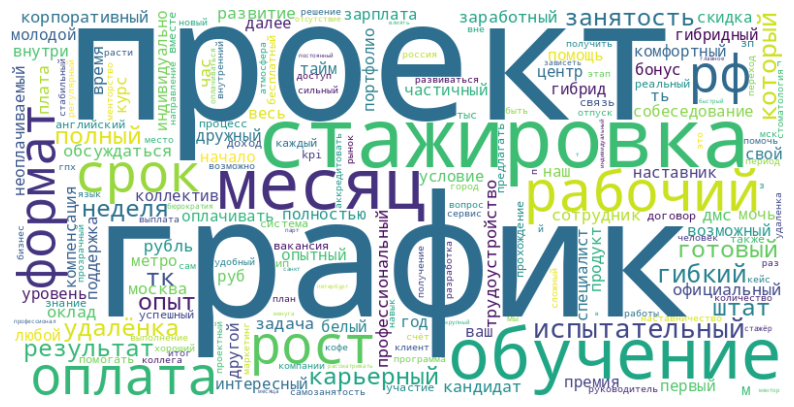

In [ ]:
text_low_popularity = ' '.join(dv.query('attractive == "low"')['work_conditions'])
function_worldcloud(text_low_popularity)

Удаление самых частых слов меняет картину в обоих случаях, но все равно существенных различий не наблюдается

Единственной полезной находкой можно считать появившийся на этом слое токен **"ТК РФ"**- в словаре описаний условий работы с хорошей конверсией в отклик

#### 2. Влияние текстового описания всех параметров вакансии на отклики

Попробуем объединить все текстовые данные объявления, и помотреть, есть будут ли в этом случае различия в зависимости от высокой/низкой конверсии

In [ ]:
dv['language']

0       Наш стек: Python, fastapi, postgres, gitlab\nП...
1       1) Широкий IT-кругозор, понимание, какие бываю...
2       умение самостоятельно разбираться в чужом коде...
3       - Высшее IT/техническое образование либо после...
4       - ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...
                              ...                        
1297    Опыт проведения CustDev_x000D_\nЖелание погруз...
1298    Нужен разработчик мобильных приложений (ios и/...
1299    Понимание проведений исследований _x000D_\nГот...
1300    ● наличие опыта в продуктовом менеджмента; _x0...
1301    Уделять проекту не менее 12 часов в неделю._x0...
Name: language, Length: 1302, dtype: object

In [ ]:
# Обработка текста: удаление стоп-слов и лемматизация
dv['language'] = dv['language'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))
dv['language'] = dv['language'].apply(lambda x: lemmatize_words(x, morph))


In [ ]:
dv['language'] = dv['language'].apply(dataset_clean)

In [ ]:
dv['language']

0       наш стек : python , fastapi , postgres , gitla...
1       1 ) широкий it-кругозор , понимание , какой бы...
2       умение самостоятельно разбираться чужой код ; ...
3       - высокий it/технический образование либо посл...
4       - обязательно - высокий ит/технический образов...
                              ...                        
1297    опыт проведение custdev желание погрузиться ра...
1298    нужный разработчик мобильный приложение ( ios ...
1299    понимание проведение исследование готовность п...
1300    ● наличие опыт продуктовый менеджмент ; ● стра...
1301    уделять проект менее 12 час неделю. умение ком...
Name: language, Length: 1302, dtype: object

In [ ]:

def dataset_postclean2(x, nan_value= None):
    for column in x:
  # subs = subs[1:] # remove the first promotional subtitle
        txt = re.sub(HTML, ' ', x) # html tags change to spaces
        #txt = re.sub(COMMENTS, ' ', txt) # comments in parentheses change to spaces
        #txt = re.sub(LETTERS, ' ', txt) # anything that isn't a letter is a space
        txt = re.sub(DOTS, r'.', txt) # punctuation mark ellipsis change to dots
        txt = re.sub(SPACES, r'\1', txt) # repeated spaces change to one space
        #txt = re.sub(SYMB, '', txt) # punctuation marks other than apostrophe change to an empty string
        txt = re.sub('работа', '', txt) # 'www' change to an empty string
        txt = re.sub('знание', '', txt) # 'www' change to an empty string
        txt = re.sub('работать', '', txt) # 'www' change to an empty string
        txt = re.sub('умение', '', txt) # 'www' change to an empty string
        txt = re.sub('опыт', '', txt) # 'www' change to an empty string
        txt = re.sub('_x000d_', '', txt) # 'www' change to an empty string
        txt = re.sub('ть', '', txt) # 'www' change to an empty string
        txt = re.sub('команда', '', txt) # 'www' change to an empty string
        txt = re.sub('возможнос', '', txt) # 'www' change to an empty string
        txt = re.sub('проект', '', txt) # 'www' change to an empty string
        txt = re.sub('офис', '', txt) # 'www' change to an empty string
        txt = re.sub('понимание', '', txt) # 'www' change to an empty string
        txt = re.sub('оформление', '', txt) # 'www' change to an empty string
        txt = re.sub('удалённый', '', txt) # 'www' change to an empty string
        txt = re.sub('день', '', txt) # 'www' change to an empty string
        #txt = txt.lstrip().rstrip().replace("\n","") # left space trimming
        #txt = txt.encode('ascii', 'ignore').decode() # remove all non-ascii characters
        #txt = txt.lower() # to lowercase
        txt = ' '.join(txt.split())
    return txt

In [ ]:
dv['language'] = dv['language'].apply(dataset_postclean2)

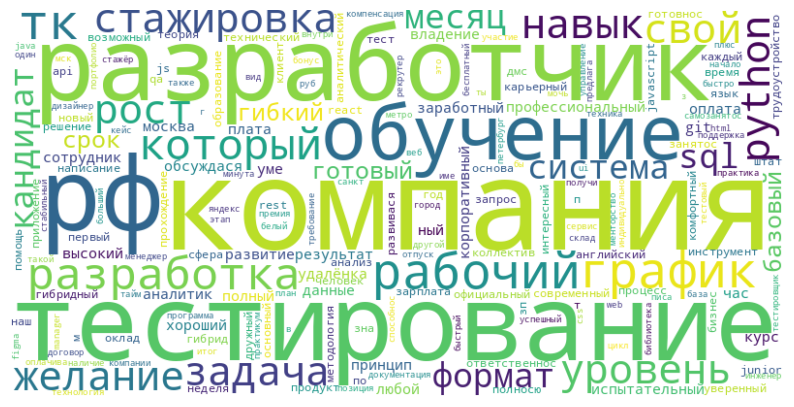

In [ ]:
text_high_popularity = ' '.join(dv.query('attractive == "high"')['language'])
function_worldcloud(text_high_popularity)

In [ ]:
text_high_popularity

"hard skills : - уверенно писа python sql. - применя ml прикладной бизнес-задача ; - выдвига продуктовый гипотеза зна проводи a/b-эксперимент интерпретирова результат ; — зна основа статистики. soft skills : - коммуникабельнос ; - целеустремлённос желание разбирася , учися новый ; - неконфликтный , уме аргументирова позиция донести мысль ; - самостоятельный , уме сам декомпозирова общий задача выстрои процесс свой ; - ный занятос последующий фуллтайм трудоустройства - гпх - удалёнка ( разница 3-4 час мск ) - зп обсуждася индивидуальноспециалист data science наличие высокий образование уверенный владение ms office figma , miro soft skills : - проактивный - бояся новый задач - быстро перестроися режим многозадачнос - высокий аналитический навык критический мышление , - навык подготовка презентаций100 % москва ( проспект мир ) фул-тайм тк ( только гражданин рф ) иска специалист , который готовый быстро вникну специфика задача . самоходнос - готовый `` води рука '' долго . , который нужно 

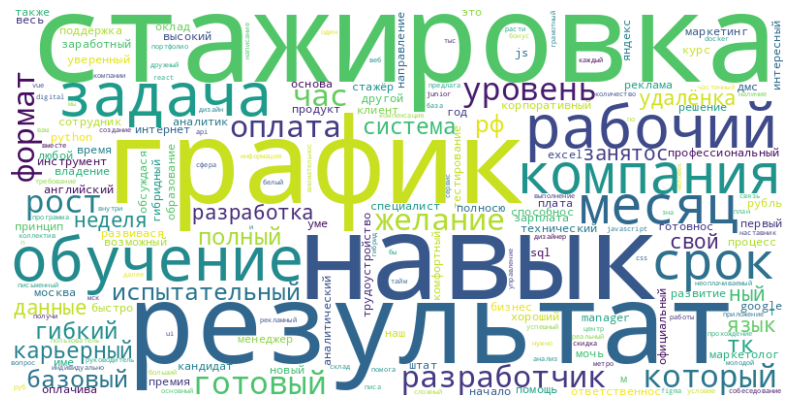

In [ ]:
text_low_popularity = ' '.join(dv.query('attractive == "low"')['language'])
function_worldcloud(text_low_popularity)

In [ ]:
text_low_popularity

"1 ) широкий it-кругозор , , какой быва язык программирование использовася . 2 ) владение хотя один современный язык программирование ( java , python , php , c # , go , javascript и/и c++ ) , желательно базовый уровень язык запрос sql базовый навык вёрстка веб-страница ( html/css ) . 3 ) свободный владение разговорный английский язык . 4 ) системнос , аналитический склад ум чувствова другой человек . 5 ) желание готовнос проводи собеседование оценива специалистовставка 750 рубль - 1 об кандидат ( провести собеседование + написа заключение он ) полный удалёнка обучениетехнический интервьюер самостоятельно разбирася чужой код ; самостоятельный коммерческий ; способнос самоорганизация самодисциплина ; оценива трудоёмкос задача планирова свой рабочий время ; находися связь больший час рабочий ( время мск ) ; грамотно изложи свой вопросы/идеи. вёрстка ( css 3 , flex sass ) ; хороший уровень javascript асинхронный особеннос ; хороший vue.js v2 ( реактивный свойство , компонент ) ; node js ex

На этом слое уже наблюдаются некоторые отличия. Например, для хорошей конверсии примечательны токены "тестирование" (?), "разработчик", "обучение" и снова "ТК", при плохой конверсии - "стажировка", "график" (вероятно, не гибкий, тк. токен "гибкий" существенно меньше).

**Общий вывод** по влиянию текста на конверсию с точки зрения возможностей данного метода ("мешок слов"): отдельные моменты иллюстрирует хорошо, но в целом этот метод не учитывает связей между словами в словаре, поэтому для тематически близких описаний требует много коррекции.

#### 3. Влияние текста заголовка на "кликабельность"

Попробуем применить метод к простым кратким текстам - заголовкам. Здесь выберем другую метрику - категории популярности, по различию в количестве просмотров ("views").

In [ ]:
 #Определение квантилей для разбиения на категории
low_quantile = dv['views'].quantile(1/3)
high_quantile = dv['views'].quantile(2/3)

display(low_quantile)
high_quantile

20.0

43.0

In [ ]:
def categorize_popularity(views):
    # Определение категории популярности
    if views <= low_quantile:
        return "low"
    elif views <= high_quantile:
        return "middle"
    else:
        return "high"

# Применение функции к столбцу "Количество просмотров" и создание нового столбца с категориями популярности
dv['clicable'] = dv['views'].apply(categorize_popularity)

In [ ]:
dv['job_title']

0       Стажёр Python разработчик (неоплачиваемая стаж...
1                                  Технический интервьюер
2                                          JS-разработчик
3                                     Младший разработчик
4                                        Младший аналитик
                              ...                        
1297                                      Product Manager
1298                               Android/ IOS Developer
1299                                      Product Manager
1300                                      Product Manager
1301                              Data Scientist в проект
Name: job_title, Length: 1302, dtype: object

In [ ]:
# Обработка текста: удаление стоп-слов и лемматизация
dv['job_title'] = dv['job_title'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))
dv['job_title'] = dv['job_title'].apply(lambda x: lemmatize_words(x, morph))


In [ ]:
dv['job_title']

0       стажёр python разработчик ( неоплачиваемый ста...
1                                  технический интервьюер
2                                          js-разработчик
3                                     младший разработчик
4                                        младший аналитик
                              ...                        
1297                                      product manager
1298                               android/ ios developer
1299                                      product manager
1300                                      product manager
1301                                data scientist проект
Name: job_title, Length: 1302, dtype: object

In [ ]:
dv['job_title']=dv['job_title'].apply(dataset_clean)

In [ ]:
dv['job_title']

0       стажёр python разработчик ( неоплачиваемый ста...
1                                  технический интервьюер
2                                          js-разработчик
3                                     младший разработчик
4                                        младший аналитик
                              ...                        
1297                                      product manager
1298                               android/ ios developer
1299                                      product manager
1300                                      product manager
1301                                data scientist проект
Name: job_title, Length: 1302, dtype: object

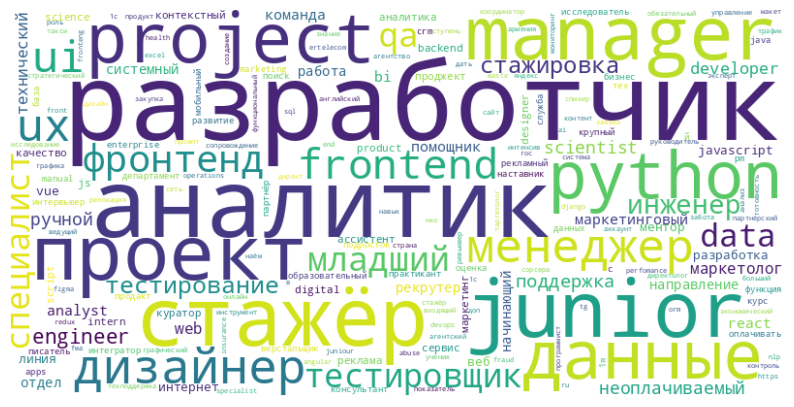

In [ ]:
text_high_popularity = ' '.join(dv.query('clicable == "high"')['job_title'])
function_worldcloud(text_high_popularity)

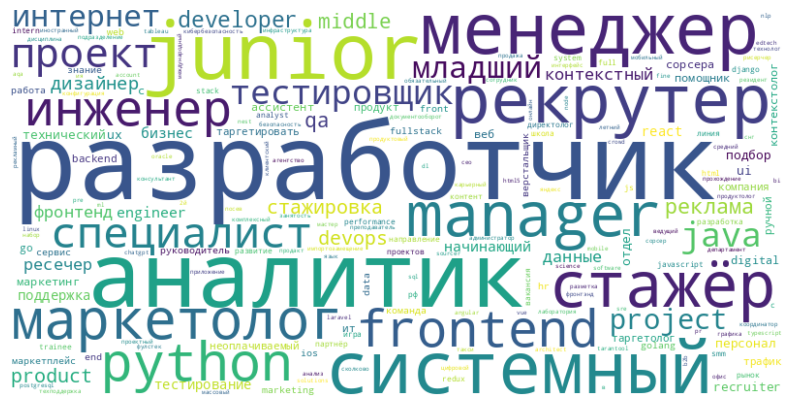

In [ ]:
text_low_popularity = ' '.join(dv.query('clicable == "low"')['job_title'])
function_worldcloud(text_low_popularity)

Результат: особых различий нет. Можно заметить в словаре с низкой кликабельностью токены "рекрутер" и "cистемный"(аналитик?) (системный аналитик - известно, что требуются специальные знания, и нет смысла читать описание всем остальным аналитикам? )

#### Применение метода для "именованных сущностей" - для столбца Город

Лемматизация в данном случае не требуется - названия городов и так в основной словоформе

In [ ]:
# используем регулярное выражение r'\s+', чтобы заменить все последовательности пробелов на один пробел

df['city'] = df['city'].str.replace(',', '', regex=True).str.replace(r'\s+', ' ').str.strip()

In [ ]:
#посмотрим на топ-20 распространенных наименований вакансий
df['city'].value_counts().head(20)

Москва                    887
Санкт-Петербург           137
Москва Санкт-Петербург     31
Казань                     21
Екатеринбург               14
Тюмень                     11
Самара                     10
Будва                      10
Нижний Новгород             9
Ростов-на-Дону              8
Тула                        7
Алматы                      7
Краснодар                   6
Новосибирск                 6
Москва Тбилиси              6
Челябинск                   5
Москва Самара               4
Albuquerque                 4
Ульяновск Москва            3
Уфа                         3
Name: city, dtype: int64

In [ ]:
#проверим колчиество уникальных значений
print('Количество уникальных значений: ',df['city'].nunique())

Количество уникальных значений:  98


In [ ]:
# Соединение всех значений столбца "Город" в одну строку
text = ' '.join(df['city'])

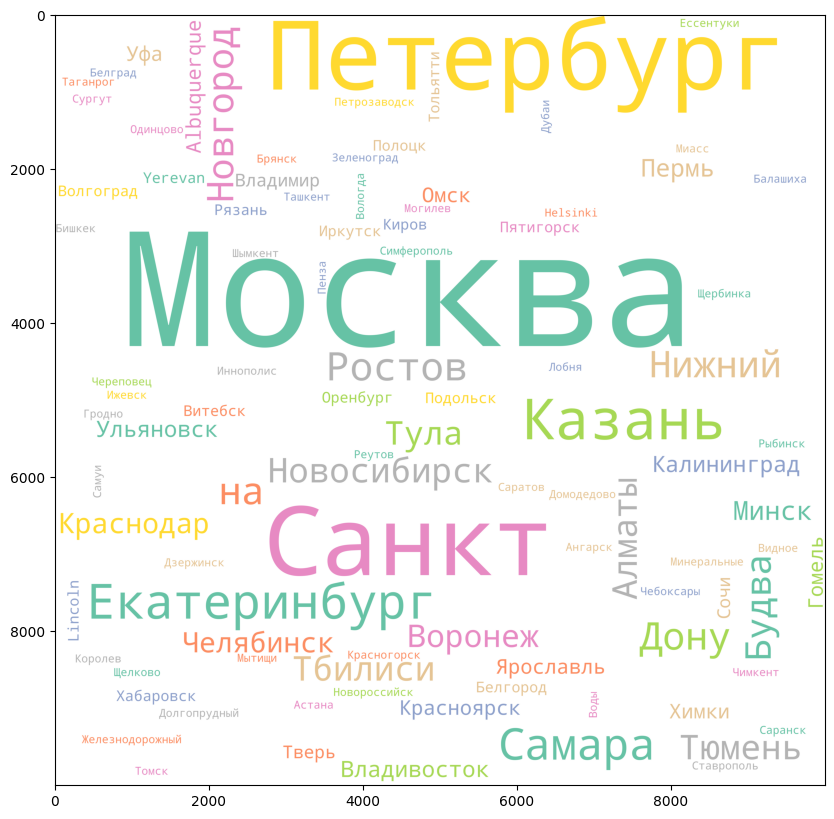

In [ ]:
%matplotlib inline

#from wordcloud import WordCloud, STOPWORDS
wordCloud = WordCloud(width = 10000, height = 10000, random_state=1, background_color='White', colormap='Set2', collocations=False).generate(text)

plt.figure(figsize=(10,10))
plt.imshow(wordCloud)

С именованными сущностями получается наглядная картина, но есть проблема того, что имена городов из двух слов разваливаются на части - от этого можно избавиться например с помощью регулярных выражений, продолжение следует.

### Кластеризация (разбиение на категории методами машинного обучения)

#### Категоризуем признак "job_title" на 22 категории
Одной из задач кластерного анализа является подбор оптимального значения  k
 , для которой существует несколько версий решения. Метод “локтя” (elbow method) рассматривает характер изменения разброса  Wtotal
  с увеличением числа групп  k
 . Объединив все  n
  наблюдений в одну группу, мы имеем наибольшую внутрикластерную дисперсию, которая будет снижаться до 0 при  k→n
 . На каком-то этапе можно усмотреть, что снижение этой дисперсии замедляется - на графике это происходит в точке, называемой “локтем”

Кластеризацию текста будем проводить методом KMeans.
Кластеризация текста методом KMeans - это процесс группировки текстовых данных в кластеры (группы) на основе их схожести. Метод KMeans является одним из популярных методов кластеризации и часто используется для анализа текстовых данных.

In [ ]:
doof=df.copy()


In [ ]:
doof

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,contract,format,experience,education,test_task,employment,mandatory,additional,comр_stages,work_conditions
0,40,Архив,Повторная,Фаткуллин,2023-08-30,2023-08-30,153,35,Школа IT,Стажёр Python разработчик (неоплачиваемая стаж...,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Проектная, Частичная","Наш стек: Python, fastapi, postgres, gitlab\nП...","Основные требования к ребятам, которые хотели ...",Техническое задание и интервью,Школа бесплатна и сотрудничает с фондами.\n\nС...
1,104,Архив,Входящая заявка,Оборина,2023-08-22,2023-08-22,188,4,SymbioWay,Технический интервьюер,...,ГПХ,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Частичная,"1) Широкий IT-кругозор, понимание, какие бываю...",NaN,1) тестовое задание\n2) онлайн собеседование с...,ставка 750 рублей - за 1 обработанного кандида...
2,157,Архив,Реферальная,Фаткуллин,2023-08-28,2023-10-03,37,8,KeyHabits,JS-разработчик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,умение самостоятельно разбираться в чужом коде...,Опыт коммерческой разработки на JS будет больш...,- Отклик с сопроводительным письмом обязательн...,"- Работа удаленная, оплата в форме оклада.\n- ..."
3,181,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,33,7,GlowByte,Младший разработчик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Офис,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- Высшее IT/техническое образование либо после...,- Базовое понимание объектов БД и их применени...,- Скрининг резюме_x000D_\n- Техническое интерв...,У нас вы получите возможность:_x000D_\n- Работ...
4,184,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,51,13,Glowbyte,Младший аналитик,...,Трудовой договор,Офис,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...,Базовое понимание объектов БД и их применение_...,1. Скрининг резюме_x000D_\n2. Тестовое задание...,Стабильный оклад + премия по итогам года/проек...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,2068,Преакселерация,Повторная,Кариаули,2023-12-22,NaN,4,2,Reezonly ( reezonly.com ),Product Manager,...,Самозанятость,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Опыт проведения CustDev_x000D_\nЖелание погруз...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,Парт-тайм занятость с постепенным погружением ...
1298,2070,Акселерация,Реферальная,Фаткуллин,2023-12-22,NaN,2,2,Проект в рамках команды Голосовых Технологий Я...,Android/ IOS Developer,...,Самозанятость,"Офис, Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Проектная,Нужен разработчик мобильных приложений (ios и/...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,"Удаленка, но можно приходить в офис Яндекса пе..."
1299,2071,Преакселерация,Сорсинг,Фаткуллин,2023-12-22,NaN,4,1,Postmypost,Product Manager,...,Самозанятость,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Понимание проведений исследований _x000D_\nГот...,NaN,1. Скрининг резюме _x000D_\n2. Собеседование,Парт-тайм с постепенным развитием в проекта и ...
1300,2072,Преакселерация,Повторная,Фаткуллин,2023-12-29,NaN,3,1,IT-Incubator,Product Manager,...,"ИП, Трудовой договор","Офис, Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релеван

In [ ]:
egnored_words_en = nltk.corpus.stopwords.words('english')

In [ ]:
stop_words_ru = set(stopwords.words('russian'))
stop_words_en = set(stopwords.words('english'))

In [ ]:
doof['job_title'] = doof['job_title'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words_ru and word.lower() not in stop_words_en]))
doof['job_title'] = doof['job_title'].apply(lambda x: lemmatize_words(x, morph))

In [ ]:
texts = doof['job_title']

In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(texts)

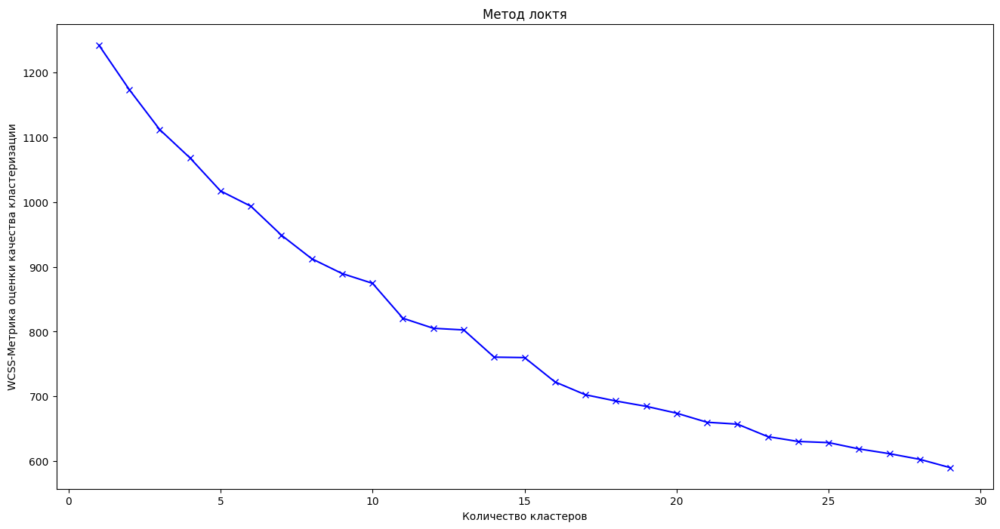

In [ ]:
distortions = []
K = range(1, 30)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(X)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Количество кластеров')
plt.ylabel('WCSS-Метрика оценки качества кластеризации')
plt.title('Метод локтя')
plt.show()

Стого говоря, не в нашем случае не очень очевидно, где на графики "локоть". **Определим количество кластеров и соответственно категорий равным 22.** (а еще можно попробовать 11, 16, 18 -?)




In [ ]:
optimal_k = 22
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
doof['cluster_num'] = kmeans.fit_predict(X)

Посмотрим содержание полученных кластеров

In [ ]:
doof['cluster_num']

0        6
1       18
2        5
3        0
4        0
        ..
1297     1
1298     5
1299     1
1300     1
1301     5
Name: cluster_num, Length: 1302, dtype: int32

In [ ]:
test_assignment = doof.groupby(['cluster_num']).agg({'job_title': 'count'}).reset_index().sort_values(by='cluster_num', ascending=True)
test_assignment

,cluster_num,job_title
0,0,26
1,1,20
2,2,60
3,3,59
4,4,76
5,5,293
6,6,97
7,7,19
8,8,49
9,9,13


In [ ]:
doof.query('cluster_num == 0')['job_title'].sample(10)

638      ассистент / младший специалист отдел закупка
973                           младший аналитик данные
3                                 младший разработчик
526     ассистент / младший специалист отдел аналитик
559                                  младший аналитик
336                           младший разработчик с++
991                                  младший аналитик
1209                       младший менеджер маркетинг
298                           младший аналитик данные
670            младший менеджер таргетировать реклама
Name: job_title, dtype: object

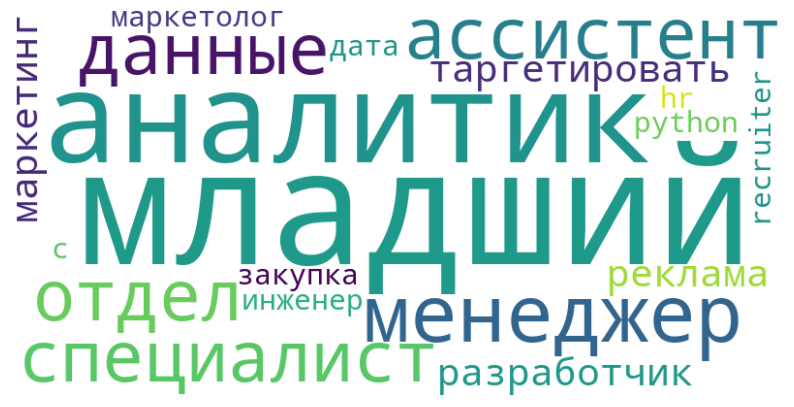

In [ ]:
claster0 = ' '.join(doof.query('cluster_num == 0')['job_title'])
function_worldcloud(text=claster0)

In [ ]:
claster0

'младший разработчик младший аналитик младший it-recruiter младший hr менеджер младший аналитик младший аналитик данные младший разработчик с++ ассистент / младший специалист отдел аналитик младший аналитик младший аналитик ассистент / младший специалист отдел закупка младший менеджер таргетировать реклама младший маркетолог младший аналитик младший аналитик младший аналитик ассистент / младший специалист отдел маркетинг младший аналитик ( python ) младший аналитик данные младший аналитик младший аналитик младший дата-инженер младший менеджер таргетировать реклама младший аналитик данные младший аналитик младший менеджер маркетинг'

In [ ]:
doof.query('cluster_num == 1')['job_title'].sample(10)

962      product manager middle
900             product manager
1159     junior product manager
1300            product manager
96              product manager
979             product manager
967             product manager
1299            product manager
904             product manager
584     project/product manager
Name: job_title, dtype: object

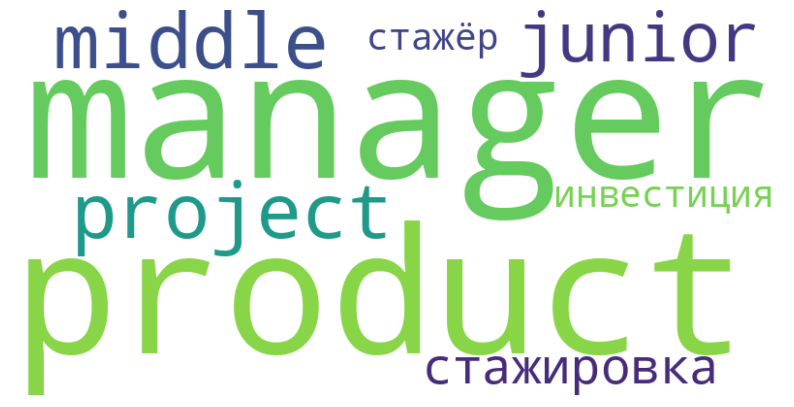

In [ ]:
claster1 = ' '.join(doof.query('cluster_num == 1')['job_title'])
function_worldcloud(text=claster1)

In [ ]:
claster1

'product manager product manager project/product manager middle product manager стажёр product manager product manager product manager project manager/product manager product manager middle product manager product manager product manager product manager junior junior product manager product manager стажировка стажировка product manager product manager ( инвестиция ) product manager product manager product manager'

In [ ]:
doof.query('cluster_num == 2')['job_title'].sample(10)

1248                                 фронтенд-разработчик
1165                          стажёр фронтенд-разработчик
1177                                 фронтенд-разработчик
1046                                 фронтенд-разработчик
478                                  фронтенд-разработчик
423                                  фронтенд-разработчик
736     фронтенд-разработчик ( неоплачиваемый стажиров...
1097                        фронтенд разработчик react/js
143                                  фронтенд-разработчик
1176                фронтенд-разработчик ( node , react )
Name: job_title, dtype: object

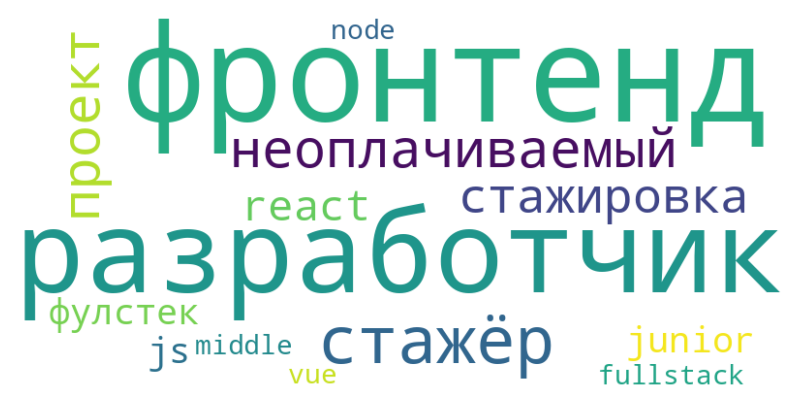

In [ ]:
claster2 = ' '.join(doof.query('cluster_num == 2')['job_title'])
function_worldcloud(text=claster2)

In [ ]:
claster2

'фронтенд разработчик проект фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик фронтенд разработчик фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик стажёр фронтенд-разработчик фронтенд разработчик junior фронтенд-разработчик ( стажёр ) фронтенд-разработчик ( vue.js ) фронтенд-разработчик стажёр фронтенд-разработчик стажёр фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик фулстек фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик ( стажёр ) фулстек фронтенд-разработчик проект фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик ( неоплачиваемый стажировка ) фронтенд-разработчик фронтенд стажёр фронтенд-разработчик ( неоплачиваемый стажировка ) фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик middle фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик фронтенд-разработчик фронтенд разработчик junior фронтенд-разработчик фронтенд-разработчик фронтенд разработчик

In [ ]:
doof.query('cluster_num == 3')['job_title'].sample(10)

322                  ux/ui дизайнер
190                  ux/ui дизайнер
466    веб дизайнер ( ui дизайнер )
933                  ux/ui дизайнер
682                  ux/ui дизайнер
203                  ux/ui дизайнер
384                  ux/ui дизайнер
655                  ux/ui дизайнер
722                  ux/ui дизайнер
470                ux | ui дизайнер
Name: job_title, dtype: object

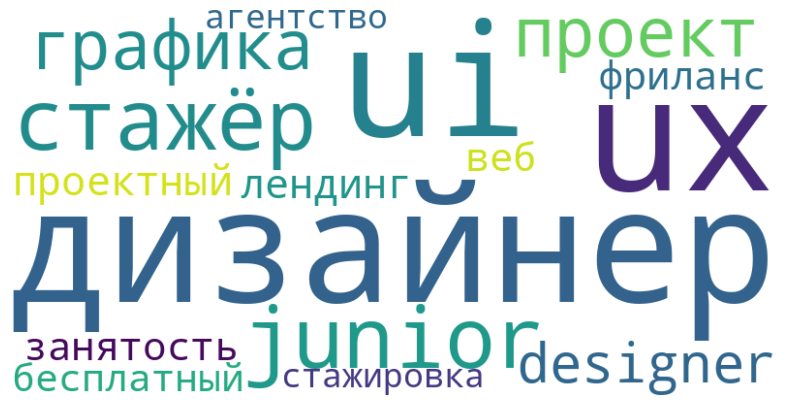

In [ ]:
claster3 = ' '.join(doof.query('cluster_num == 3')['job_title'])
function_worldcloud(text=claster3)

In [ ]:
claster3

'ux/ui дизайнер-стажёр ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер дизайнер ( графика , ux/ui ) дизайнер ( графика , ux/ui ) ux/ui дизайнер ux/ui дизайнер лендинг ( проектный занятость , фриланс ) ux дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер дизайнер ( графика , ux/ui ) junior ux/ui ux/ui дизайнер ux/ui дизайнер дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер дизайнер ux ui ( стажёр / junior ) веб дизайнер ( ui дизайнер ) ux | ui дизайнер ux/ui дизайнер ux/ui-дизайнер ( бесплатный стажировка ) junior+ ux/ui дизайнер ux/ui дизайнер ui/ux дизайнер ux/ui designer ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер-стажёр ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ( проект ) ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер агентство ux/ui дизайнер ux/ui дизайнер стажёр ux/ui дизайнер дизайнер junior ux/ui designer ux/ui дизайнер ux-дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux-диз

In [ ]:
doof.query('cluster_num == 4')['job_title'].sample(10)

195            бизнес аналитик
134            аналитик данные
586                   аналитик
741            аналитик данные
19      junior аналитик данные
942                   аналитик
1274                  аналитик
627            аналитик данные
1132    junior аналитик данные
1053           аналитик данные
Name: job_title, dtype: object

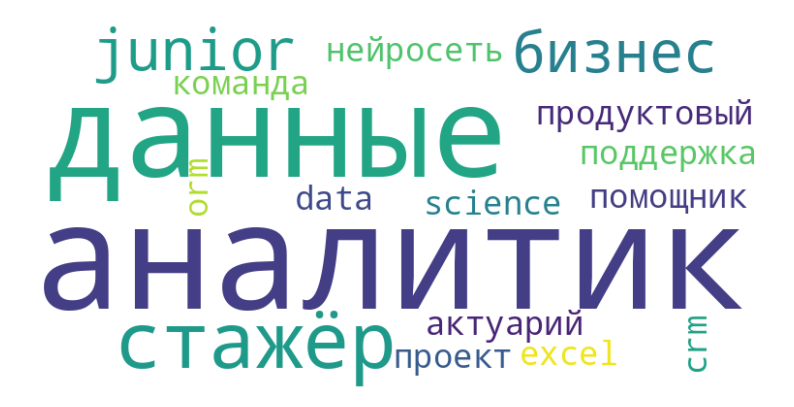

In [ ]:
claster4 = ' '.join(doof.query('cluster_num == 4')['job_title'])
function_worldcloud(text=claster4)

In [ ]:
claster4

'junior аналитик данные аналитик данные аналитик данные бизнес аналитик аналитик данные аналитик данные аналитик данные аналитик данные бизнес аналитик аналитик данные бизнес аналитик аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные ( нейросеть ) аналитик данные аналитик данные аналитик данные стажёр-аналитик аналитик данные аналитик данные аналитик аналитик данные аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик аналитик/продуктовый аналитик аналитик данные аналитик данные стажёр аналитик данные аналитик данные аналитик данные аналитик стажёр бизнес-аналитик аналитик данные ( data science junior ) аналитик аналитик данные - стажёр аналитик - стажёр аналитик данные аналитик данные стажёр-аналитик аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик-стажёр аналитик аналитик аналитик данные excel ст

In [ ]:
doof.query('cluster_num == 5')['job_title'].sample(10)

62           ментор направление интенсив больший дать
1210    специалист подбор персонала/менеджер персонал
320     junior account manager ( marketing projects )
774                              web-dev | mobile-dev
406            python-разработчик ( в доп.сервис tg )
1012                          ассистент отдел продукт
185                              таргетолог вконтакте
1296                                     data analyst
810                            разработчик html5-игра
701             performance специалист ( таргетолог )
Name: job_title, dtype: object

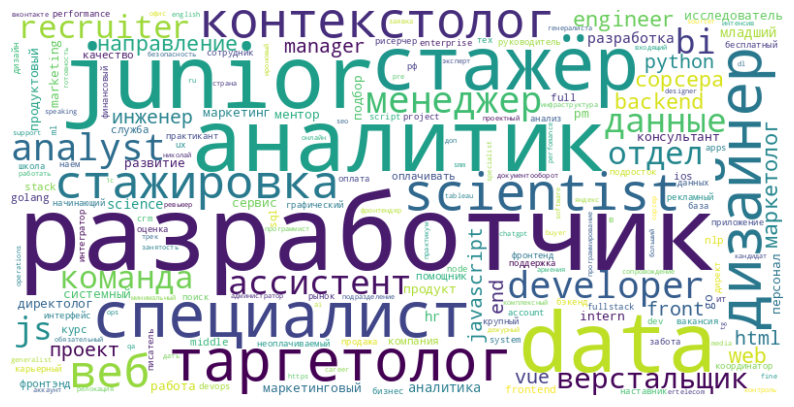

In [ ]:
claster5 = ' '.join(doof.query('cluster_num == 5')['job_title'])
function_worldcloud(text=claster5)

In [ ]:
claster5

'js-разработчик seo-специалист специалист data science таргетолог golang-разработчик специалист data science рекламный аналитик директ junior+ frontend developer ( обязательный релокация армения готовность работать страна ) junior marketing manager devops engineer recruiter ментор направление интенсив больший дать разработчик vue.js стажёр аналитик документооборот junior front-end разработчик frontend-разработчик подразделение комплексный безопасность рисерчер стажёр-ассистент разработчик javascript junior recruiter ( english speaking ) контекстолог it-компания ux- исследователь инженер контроль качество it-рисерчер сорсера команда сервис наём junior front-end разработчик perfomance-маркетолог intern career manager аккаунт менеджер сервис наём ( входящий заявка ) hr-ревьюер карьерный трек курс дизайн яндекс практикум hr генералиста стажёр web-разработчик junior go-разработчик go разработчик media buyer middle фронтенд разработчик ( проектный занятость ) python developer работа chatgpt 

In [ ]:
doof.query('cluster_num == 6')['job_title'].sample(10)

1008      junior backend разработчик ( python )
791                          python-разработчик
120                   junior python-разработчик
130                          python-разработчик
1231                python-разработчик компания
1145                         python-разработчик
641                   junior python разработчик
533                   стажёр-разработчик python
550            middle python/django разработчик
191     python разработчик ( с функция devops )
Name: job_title, dtype: object

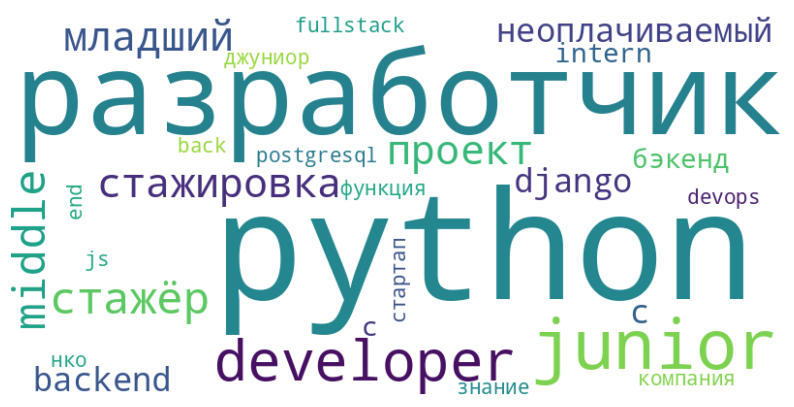

In [ ]:
claster6 = ' '.join(doof.query('cluster_num == 6')['job_title'])
function_worldcloud(text=claster6)

In [ ]:
claster6

'стажёр python разработчик ( неоплачиваемый стажировка нко ) python-разработчик знание postgresql junior python разработчик python-разработчик разработчик python python-разработчик middle python-разработчик junior python разработчик junior python-разработчик python-разработчик python-разработчик python разработчик ( с функция devops ) python разработчик junior python разработчик python-разработчик python developer python разработчик middle python-разработчик python developer backend разработчик ( python ) python-разработчик python-разработчик middle python-разработчик middle python/django разработчик python-разработчик junior python-разработчик ( стажёр ) python-разработчик python-разработчик python-разработчик младший разработчик python ( стажировка ) бэкенд-разработчик ( backend , python ) python-разработчик python разработчик python-разработчик python-разработчик junior python-разработчик c++ разработчик junior python developer back-end разработчик ( python ) c++ разработчик junior 

In [ ]:
doof.query('cluster_num == 7')['job_title'].sample(10)

473              front-end разработчик react/redux
755                 frontend-разработчик ( react )
221             frontend developer ( react/redux )
520                 frontend-разработчик ( react )
867                 frontend-разработчик ( react )
946    frontend-разработчик ( react , typescript )
950                         react native developer
40                      frontend разработчик react
460                 frontend-разработчик ( react )
481         frontend-разработчик ( react , redux )
Name: job_title, dtype: object

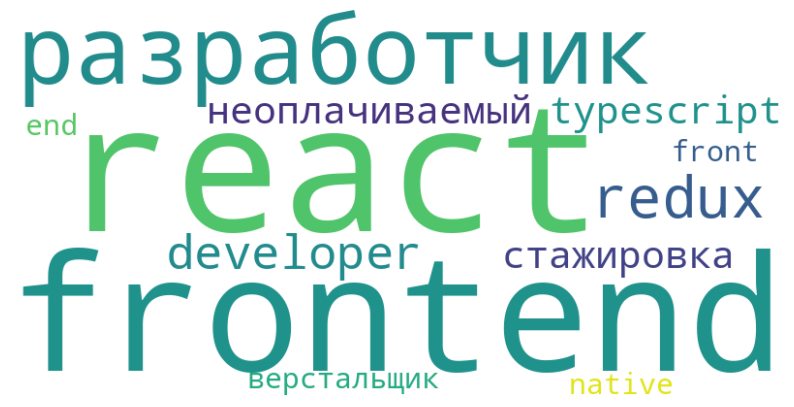

In [ ]:
claster7 = ' '.join(doof.query('cluster_num == 7')['job_title'])
function_worldcloud(text=claster7)

In [ ]:
claster7

'frontend разработчик react frontend-разработчик ( react ) frontend developer ( react/redux ) frontend-разработчик ( react ) frontend-разработчик ( react ) frontend-разработчик ( react ) front-end разработчик react/redux frontend-разработчик ( react , redux ) frontend-разработчик ( react ) frontend-разработчик ( react ) frontend-разработчик ( react ) верстальщик react ( неоплачиваемый стажировка ) frontend-разработчик ( react ) frontend-разработчик ( react , typescript ) react native developer frontend-разработчик ( react ) frontend-разработчик ( react , typescript ) frontend-разработчик ( react ) frontend-разработчик ( react ) неоплачиваемый стажировка'

In [ ]:
doof.query('cluster_num == 8')['job_title'].sample(10)

161                                     junior qa инженер
1030            qa engineer международный проект здоровье
1065                                   младший qa инженер
1179                                          qa engineer
115     младший инженер тестирование ( qa performance ...
777                                             qa стажёр
1195                              тестировщик qa engineer
1020                                            junior qa
919                                     junior qa инженер
541                                             junior qa
Name: job_title, dtype: object

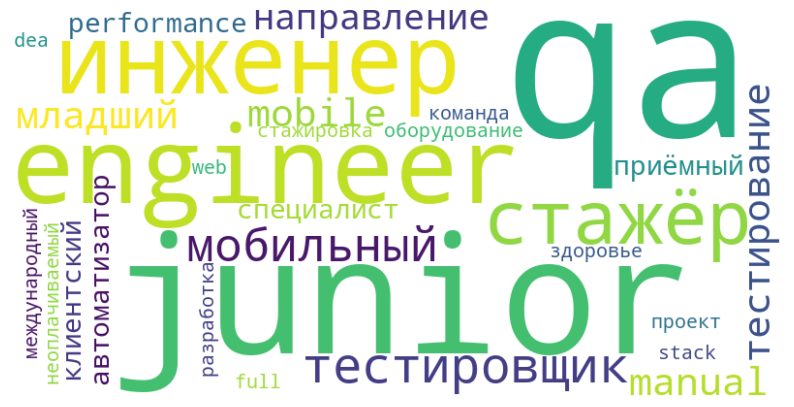

In [ ]:
claster8 = ' '.join(doof.query('cluster_num == 8')['job_title'])
function_worldcloud(text=claster8)

In [ ]:
claster8

'тестировщик / junior qa junior qa engineer младший инженер тестирование ( qa performance engineer junior ) junior qa автоматизатор junior qa junior qa инженер junior qa инженер qa инженер qa engineer ( mobile ) специалист qa стажёр , qa-инженер junior qa engineer junior qa engineer junior qa engineer junior qa инженер junior qa junior qa junior qa qa инженер клиентский приёмный оборудование стажёр qa qa инженер junior qa engineer junior qa mobile тестировщик / qa-инженер qa стажёр full-stack qa engineer junior qa-инженер junior qa junior qa инженер junior qa стажёр qa ( мобильный разработка ) junior qa qa engineer junior qa qa engineer международный проект здоровье junior qa инженер junior qa engineer мобильный команда младший qa инженер qa engineer web dea qa engineer manual qa engineer тестировщик qa engineer стажёр qa ( мобильный тестирование ) junior qa engineer неоплачиваемый стажировка qa junior qa стажёр направление qa стажёр направление qa qa manual'

In [ ]:
doof.query('cluster_num == 9')['job_title'].sample(10)

613             стажёр it-ресечер
57                    it- ресечер
178                    it-ресечер
304                    it-ресечер
144                       ресечер
410                       ресечер
165                       ресечер
351                    it-ресечер
1024                      ресечер
539     ресечер / ведущий ресечер
Name: job_title, dtype: object

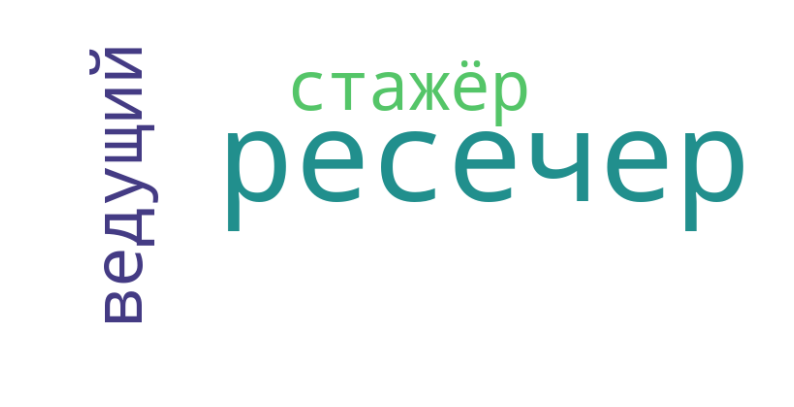

In [ ]:
claster9 = ' '.join(doof.query('cluster_num == 9')['job_title'])
function_worldcloud(text=claster9)

In [ ]:
claster9

'it- ресечер ресечер ресечер ресечер it-ресечер it-ресечер it-ресечер it-ресечер ресечер ресечер / ведущий ресечер стажёр it-ресечер ресечер ресечер'

In [ ]:
doof.query('cluster_num == 10')['job_title'].sample(10)

1258    специалист таргетировать реклама / таргетолог ...
231                        специалист контекстный реклама
65                         специалист контекстный реклама
408                        специалист контекстный реклама
151                        специалист контекстный реклама
959                        специалист контекстный реклама
1017                         помощник контекстный реклама
435                        специалист контекстный реклама
918                младший специалист контекстный реклама
808                 junior специалист контекстный реклама
Name: job_title, dtype: object

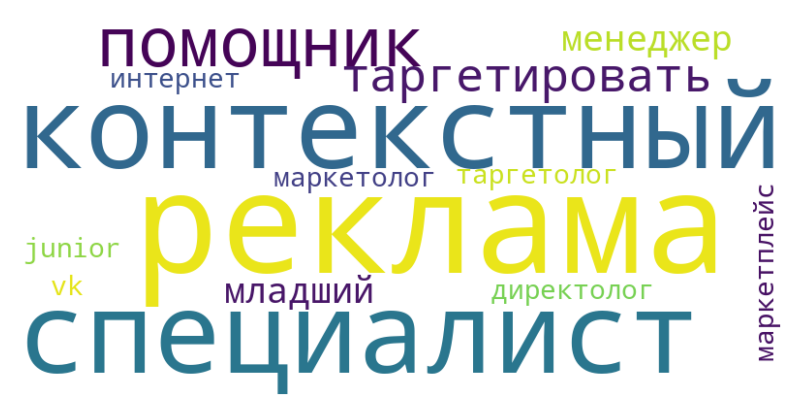

In [ ]:
claster10 = ' '.join(doof.query('cluster_num == 10')['job_title'])
function_worldcloud(text=claster10)

In [ ]:
claster10

'менеджер контекстный реклама помощник интернет-маркетолог ( контекстный реклама ) специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама специалист таргетировать реклама специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама | директолог младший специалист контекстный реклама специалист контекстный таргетировать реклама помощник контекстный реклама junior специалист контекстный реклама специалист контекстный реклама специалист контекстный реклама младший специалист контекстный реклама специалист контекстный реклама помощник контекстный реклама специалист контекстный реклама специалист реклама маркетплейс помощник менеджер таргетировать реклама специалист таргетировать реклама / таргетолог ( vk )'

In [ ]:
doof.query('cluster_num == 11')['job_title'].sample(10)

513            системный аналитик отдел импортозамещение
1239                   системный аналитик телек компания
280                                   системный аналитик
1259                                  системный аналитик
1124                                  системный аналитик
379                        системный аналитик ( junior )
1010    системный аналитик ( неоплачиваемый стажировка )
909                                   системный аналитик
888                 бизнес-аналитик / системный аналитик
326                            системный бизнес аналитик
Name: job_title, dtype: object

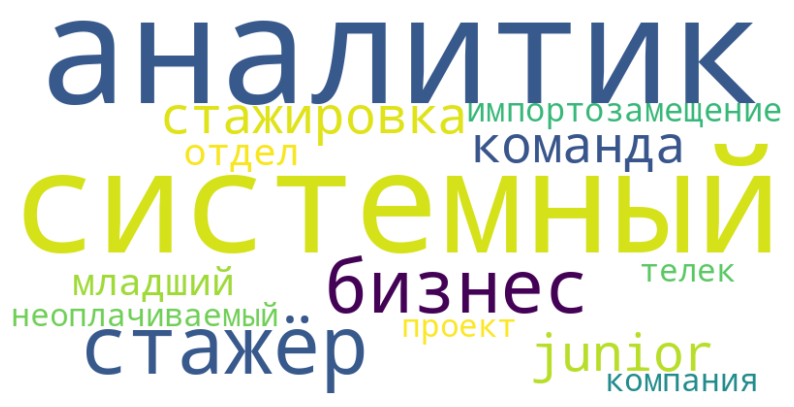

In [ ]:
claster11 = ' '.join(doof.query('cluster_num == 11')['job_title'])
function_worldcloud(text=claster11)

In [ ]:
claster11

'системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный бизнес аналитик системный аналитик системный аналитик системный аналитик системный аналитик ( junior ) младший системный аналитик ( стажёр ) стажёр системный - бизнес аналитик системный аналитик отдел импортозамещение системный аналитик системный аналитик стажёр системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик ( junior ) стажёр системный - бизнес аналитик системный аналитик команда системный аналитик системный аналитик бизнес-аналитик / системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик системный аналитик ( неоплачиваемый стажировка ) стажёр системный аналитик ( бизнес-аналитик ) системный аналитик системный аналитик проект системный аналитик системный аналитик системный аналитик системный аналитик с

In [ ]:
doof.query('cluster_num == 12')['job_title'].sample(10)

731                        стажёр it-рекрутер
1067                              it-рекрутер
548                               it-рекрутер
756     рекрутер / специалист подбор персонал
188                          рекрутер-support
728                    junior рекрутер/сорсер
218                                  рекрутер
50                     начинающий hr/рекрутер
911                           junior рекрутер
806        рекрутер ( начинающий специалист )
Name: job_title, dtype: object

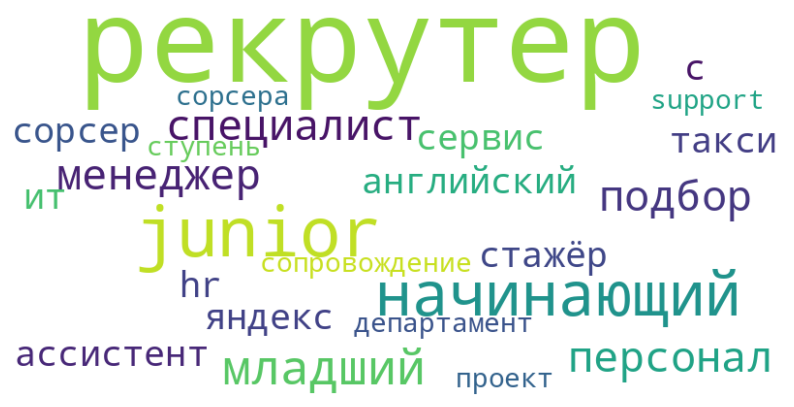

In [ ]:
claster12 = ' '.join(doof.query('cluster_num == 12')['job_title'])
function_worldcloud(text=claster12)

In [ ]:
claster12

'it-рекрутер начинающий hr/рекрутер рекрутер / младший hr-менеджер начинающий рекрутер it-рекрутер it-рекрутер младший it-рекрутер департамент сопровождение it-сорсера ( начинающий ступень it-рекрутер ) сервис яндекс такси junior рекрутер рекрутер junior рекрутер ( с английский ) рекрутер it-рекрутер рекрутер-сорсер ( с английский ) рекрутер-support рекрутер junior рекрутер рекрутер it-рекрутер it-рекрутер младший рекрутер it-рекрутер рекрутер junior рекрутер ассистент рекрутер младший рекрутер стажёр it-рекрутер it-рекрутер junior рекрутер рекрутер it-рекрутер junior рекрутер рекрутер / менеджер подбор персонал рекрутер it-рекрутер it-рекрутер рекрутер ( начинающий специалист ) начинающий рекрутер рекрутер ит-рекрутер/ менеджер подбор персонал junior рекрутер/сорсер ассистент рекрутер стажёр it-рекрутер рекрутер / специалист подбор персонал рекрутер ( начинающий специалист ) начинающий it-рекрутер сервис яндекс такси it-рекрутер junior рекрутер it-рекрутер it-рекрутер ит-рекрутер ( ju

In [ ]:
doof.query('cluster_num == 13')['job_title'].sample(10)

498     специалист ручной тестирование
233             тестировщик ( ручной )
421             тестировщик ( ручной )
35              тестировщик ( ручной )
363                 ручной тестировщик
850             тестировщик ( ручной )
515             тестировщик ( ручной )
1247    специалист ручной тестирование
1287                ручной тестировщик
308             тестировщик ( ручной )
Name: job_title, dtype: object

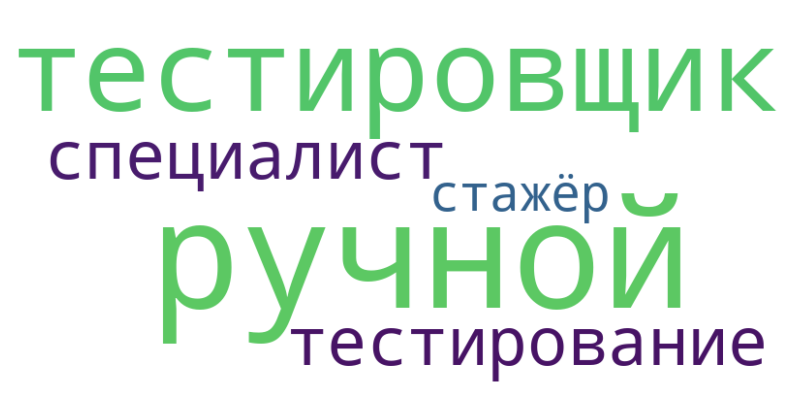

In [ ]:
claster13 = ' '.join(doof.query('cluster_num == 13')['job_title'])
function_worldcloud(text=claster13)

In [ ]:
claster13

'тестировщик ( ручной ) тестировщик ( ручной ) тестировщик ( ручной ) тестировщик ( ручной ) тестировщик ( ручной ) ручной тестировщик тестировщик ( ручной ) тестировщик ( ручной ) специалист ручной тестирование тестировщик ( ручной ) тестировщик ( ручной ) стажёр-тестировщик ( ручной ) тестировщик ( ручной ) специалист ручной тестирование ручной тестировщик ручной тестировщик'

In [ ]:
doof.query('cluster_num == 14')['job_title'].sample(10)

177                                  инженер тестирование
132                       инженер тестирование ( manual )
211                          младший инженер тестирование
512                              devops инженер ( linux )
961            инженер ручной функциональный тестирование
426                                 junior devops инженер
186             инженер тестирование функция техподдержка
1160                              специалист тестирование
1073    инженер эксплуатационный тестирование ( 2-3-й ...
1201                                         тестирование
Name: job_title, dtype: object

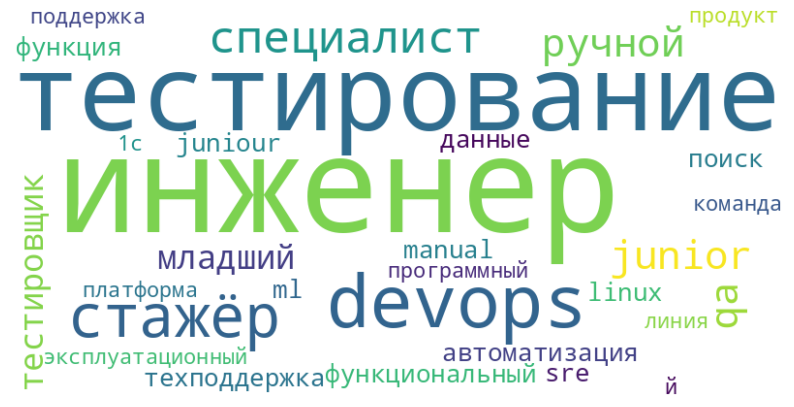

In [ ]:
claster14 = ' '.join(doof.query('cluster_num == 14')['job_title'])
function_worldcloud(text=claster14)

In [ ]:
claster14

'инженер тестирование ( qa ) младший инженер тестирование ( автоматизация ) junior инженер тестирование devops инженер инженер тестирование инженер тестирование ( manual ) инженер ручной тестирование инженер тестирование инженер тестирование инженер тестирование функция техподдержка инженер тестирование младший инженер тестирование инженер тестирование ( qa стажёр ) sre & devops-инженер ( стажёр ) devops инженер juniour инженер тестирование инженер тестирование devops инженер devops инженер junior инженер тестирование junior devops инженер инженер данные инженер тестирование devops инженер ( linux ) стажёр тестирование стажёр инженер тестирование инженер ручной тестирование ( стажёр ) поиск инженер ml специалист тестирование devops инженер инженер ручной функциональный тестирование стажёр инженер тестирование инженер тестирование devops инженер инженер эксплуатационный тестирование ( 2-3-й линия поддержка ) devops инженер специалист тестирование инженер тестирование стажёр команда devo

In [ ]:
doof.query('cluster_num == 15')['job_title'].sample(10)

29                       frontend-разработчик
847                      frontend-разработчик
594                      frontend разработчик
436       frontend-разработчик ( javascript )
267                 junior frontend developer
490                      frontend разработчик
765               junior - frontend developer
74      стажёр frontend разработчик ( vue 3 )
588                        frontend developer
278    junior frontend разработчик ( стажёр )
Name: job_title, dtype: object

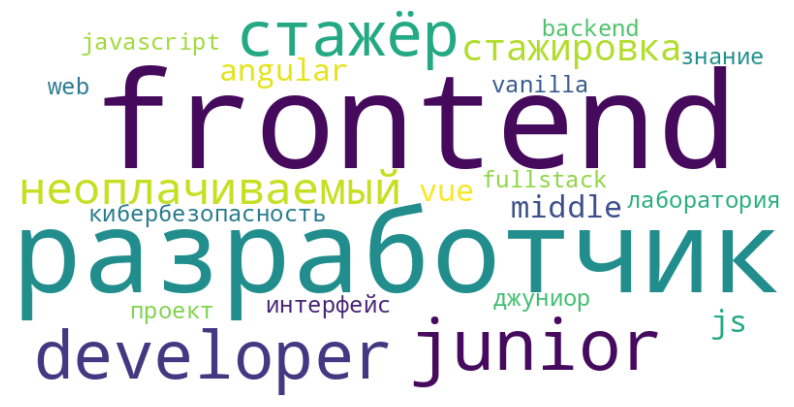

In [ ]:
claster15 = ' '.join(doof.query('cluster_num == 15')['job_title'])
function_worldcloud(text=claster15)

In [ ]:
claster15

'frontend/fullstack разработчик angular frontend-разработчик frontend-разработчик frontend-разработчик frontend-разработчик junior frontend developer middle frontend-разработчик frontend-разработчик стажёр frontend разработчик ( vue 3 ) middle frontend-разработчик стажёр frontend-разработчик ( неоплачиваемый ) junior frontend-разработчик стажёр frontend-разработчик junior frontend-разработчик стажёр frontend-разработчик frontend разработчик frontend разработчик лаборатория кибербезопасность frontend разработчик junior frontend developer junior frontend разработчик ( стажёр ) frontend разработчик frontend-разработчик frontend разработчик frontend разработчик frontend-разработчик ( javascript ) стажёр frontend-разработчик ( неоплачиваемый стажировка ) frontend разработчик frontend-разработчик стажёр-разработчик frontend frontend developer frontend разработчик junior frontend разработчик ( vanilla js ) frontend-разработчик frontend-разработчик frontend разработчик junior - frontend develo

In [ ]:
doof.query('cluster_num == 16')['job_title'].sample(10)

26                       project manager
182                      project manager
815                      project manager
529                      project manager
6                 junior project manager
485                      project manager
88     junior project manager ( mobile )
397                      project manager
504                      project manager
725                      project manager
Name: job_title, dtype: object

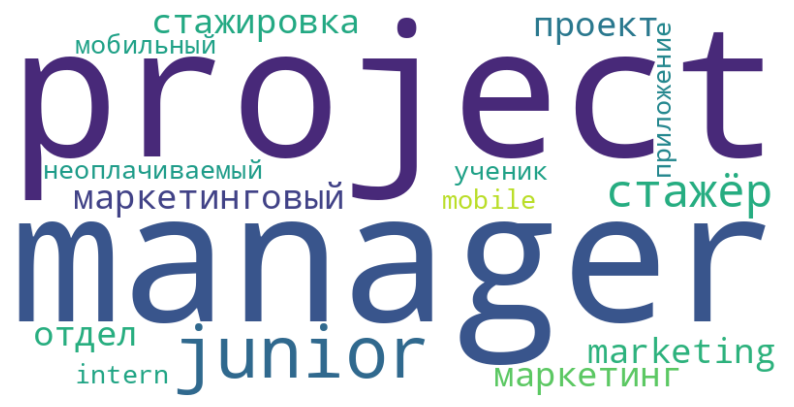

In [ ]:
claster16 = ' '.join(doof.query('cluster_num == 16')['job_title'])
function_worldcloud(text=claster16)

In [ ]:
claster16

'junior project manager project-manager project manager project manager project manager project marketing manager project marketing manager project manager project manager junior project manager ( mobile ) project manager project manager project manager project manager project manager стажёр project manager project manager project manager project manager project manager ( маркетинговый проект ) project manager junior project manager project manager project manager project manager intern project manager project manager junior project manager project manager project manager project manager project manager project manager ученик ( project manager ) project manager project manager project manager ( маркетинговый проект ) junior project manager junior project manager project manager стажёр project manager project manager project manager project manager junior project manager project manager project manager project manager junior project manager ( стажировка ) project manager project manager

In [ ]:
doof.query('cluster_num == 17')['job_title'].sample(10)

1199                      web-разработчик ( junior )
554      разработчик java oracle сервис конфигурация
500     java developer trainee ( летний стажировка )
1263                                java-разработчик
37                            junior web-разработчик
530                           junior web-разработчик
879                            junior java developer
873                          junior java разработчик
269                                 java разработчик
446                           junior web-разработчик
Name: job_title, dtype: object

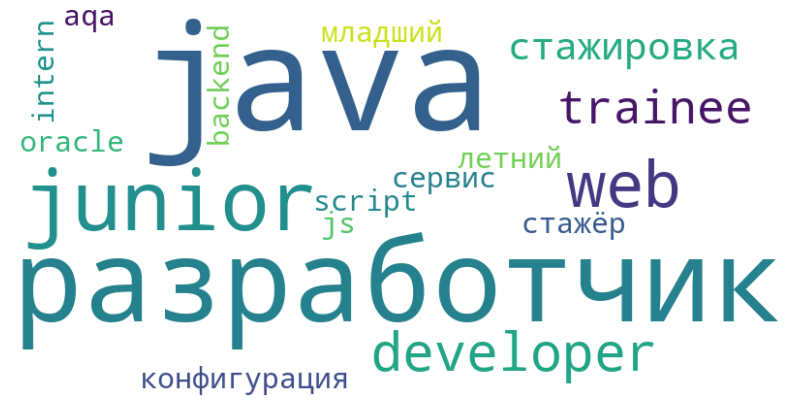

In [ ]:
claster17 = ' '.join(doof.query('cluster_num == 17')['job_title'])
function_worldcloud(text=claster17)

In [ ]:
claster17

'стажёр java разработчик junior web-разработчик java-разработчик java-разработчик java разработчик java-разработчик java разработчик junior java-разработчик aqa java trainee java developer trainee junior web-разработчик junior web-разработчик java-разработчик junior web-разработчик java intern java разработчик java developer trainee ( летний стажировка ) junior web-разработчик разработчик java oracle сервис конфигурация junior java developer java-разработчик java-разработчик junior java разработчик junior java developer младший разработчик java java-разработчик backend java разработчик java-разработчик ( стажировка ) web-разработчик ( junior ) java-разработчик junior java-разработчик java-script ( js ) разработчик'

In [ ]:
doof.query('cluster_num == 18')['job_title'].sample(10)

632                      специалист технический поддержка
811                      специалист технический поддержка
674                      специалист технический поддержка
390                      специалист технический поддержка
1                                  технический интервьюер
163                         инженер технический поддержка
1105                          специалист поддержка клиент
856                специалист отдел технический поддержка
116         специалист технический поддержка ( 1я линия )
1100    инженер технический поддержка tarantool ( с ро...
Name: job_title, dtype: object

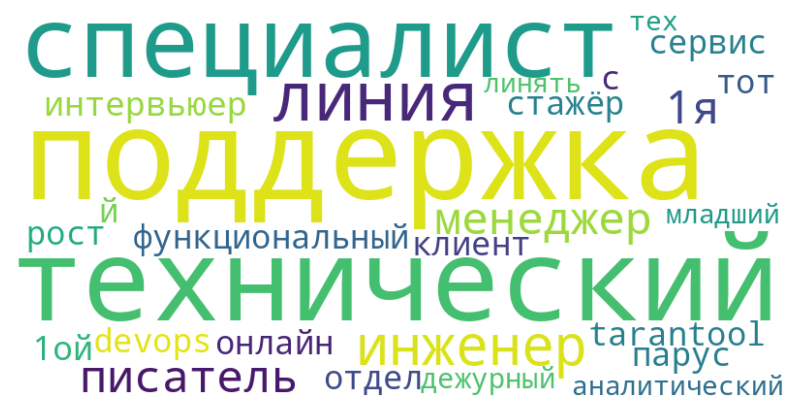

In [ ]:
claster18 = ' '.join(doof.query('cluster_num == 18')['job_title'])
function_worldcloud(text=claster18)

In [ ]:
claster18

'технический интервьюер специалист технический поддержка 1ой линия специалист технический поддержка ( 1я линия ) инженер технический поддержка инженер технический поддержка специалист технический поддержка ( 1я линия ) технический писатель специалист технический поддержка специалист технический поддержка ( функциональный поддержка парус ) стажёр тот поддержка специалист технический поддержка специалист технический поддержка специалист технический поддержка 4 линия специалист технический поддержка менеджер поддержка онлайн-сервис специалист отдел технический поддержка специалист технический поддержка инженер технический поддержка tarantool ( с рост devops ) специалист поддержка клиент менеджер технический поддержка ( 2-й линия ) дежурный аналитический поддержка младший технический писатель специалист тех.поддержка ( 2 линять )'

In [ ]:
doof.query('cluster_num == 19')['job_title'].sample(10)

1148                                начинающий маркетолог
886                                   интернет-маркетолог
1013                                  интернет-маркетолог
715                                   интернет-маркетолог
617                                 начинающий маркетолог
1096                                  интернет-маркетолог
220                                   интернет-маркетолог
180                                   интернет-маркетолог
11      младший интернет-маркетолог знание иностранный...
206                                    контент-маркетолог
Name: job_title, dtype: object

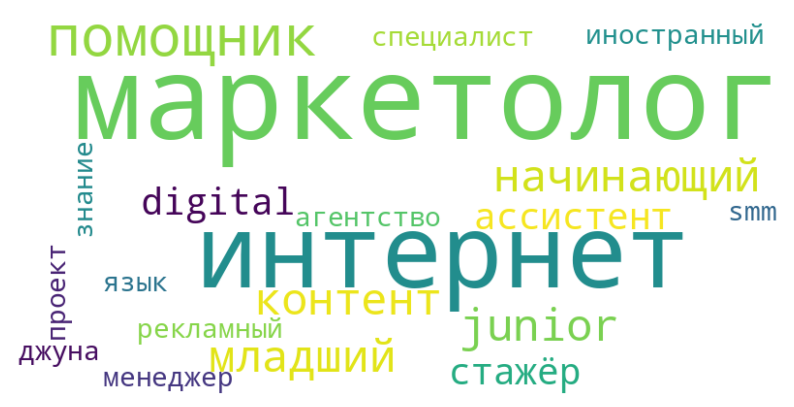

In [ ]:
claster19 = ' '.join(doof.query('cluster_num == 19')['job_title'])
function_worldcloud(text=claster19)

In [ ]:
claster19

'младший интернет-маркетолог знание иностранный язык интернет-маркетолог junior маркетолог digital маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог помощник интернет-маркетолог контент-маркетолог интернет-маркетолог помощник маркетолог интернет-маркетолог интернет-маркетолог маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог помощник интернет-маркетолог интернет-маркетолог ( джуна , стажёр ) интернет-маркетолог контент маркетолог интернет-маркетолог интернет-маркетолог проект контент-маркетолог интернет-маркетолог интернет-маркетолог ассистент маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог начинающий маркетолог интернет-маркетолог интернет-маркетолог ( рекламный специалист ) начинающий маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог junior интернет-маркетолог и

In [ ]:
doof.query('cluster_num == 20')['job_title'].sample(10)

522                         администратор проект
885                      стажёр продакт менеджер
981                      младший менеджер проект
469         менеджер департамент интернет-проект
474                    проджект/продакт менеджер
796                    маркетолог команда проект
1181    account менеджер маркетинговый агентство
1085                     менеджер работа партнёр
519                 стажёр роль контент-менеджер
1281                             аналитик проект
Name: job_title, dtype: object

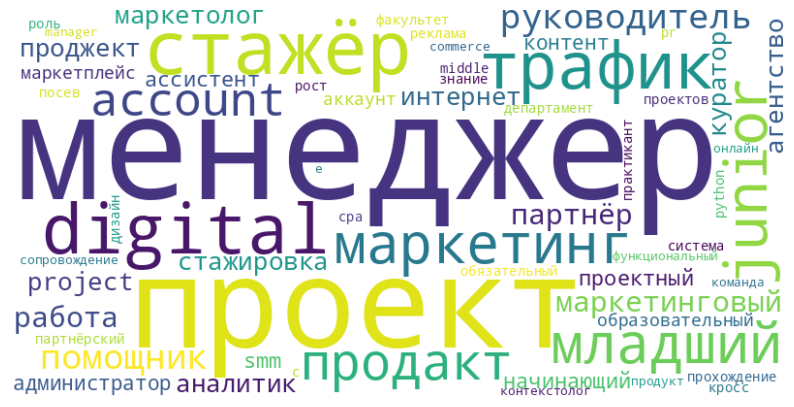

In [ ]:
claster20 = ' '.join(doof.query('cluster_num == 20')['job_title'])
function_worldcloud(text=claster20)

In [ ]:
claster20

'pr-менеджер junior account менеджер ( младший менеджер digital-проект ) стажёр smm проект руководитель проект реклама ( маркетолог ) менеджер посев проектный менеджер практикант менеджер проект трафик junior/middle трафик-менеджер младший менеджер digital-проект менеджер проект ( маркетинг ) стажёр проджект менеджер начинающий менеджер партнёрский маркетинг трафик менеджер менеджер проект помощник менеджер проект менеджер проект менеджер проект ассистент менеджер проект менеджер проект знание python менеджер digital-проект администратор проект менеджер проект ( маркетинг ) куратор проект менеджер digital-проект smm менеджер менеджер проект менеджер проект project менеджер ( digital ) менеджер проект digital junior маркетинг-менеджер менеджер проект менеджер проект руководитель проект менеджер проект факультет дизайн младший менеджер digital-проект менеджер проект ( стажёр ) менеджер проект стажёр продакт-менеджер менеджер проект менеджер департамент интернет-проект проджект/продакт ме

In [ ]:
doof.query('cluster_num == 21')['job_title'].sample(10)

855                тестировщик мобильный игра
922                функциональный тестировщик
780                               тестировщик
1255    неоплачиваемый стажировка тестировщик
662                               тестировщик
53                      junior тестировщик 1с
836                        стажёр-тестировщик
389                               тестировщик
628                               тестировщик
749                               тестировщик
Name: job_title, dtype: object

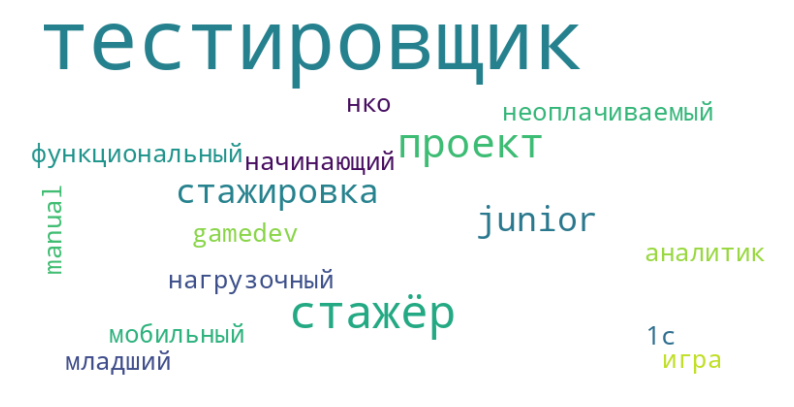

In [ ]:
claster21 = ' '.join(doof.query('cluster_num == 21')['job_title'])
function_worldcloud(text=claster21)

In [ ]:
claster21

'junior тестировщик 1с тестировщик тестировщик стажёр-тестировщик тестировщик ( junior ) тестировщик тестировщик тестировщик тестировщик нагрузочный тестировщик тестировщик тестировщик тестировщик тестировщик тестировщик тестировщик-стажёр проект стажёр-тестировщик тестировщик мобильный игра тестировщик стажёр-тестировщик нко проект функциональный тестировщик тестировщик тестировщик тестировщик проект тестировщик тестировщик ( стажировка ) начинающий аналитик / тестировщик младший тестировщик тестировщик тестировщик неоплачиваемый стажировка тестировщик тестировщик тестировщик ( manual/gamedev )'

In [ ]:
doof.groupby(['cluster_num'])


In [ ]:
# Напишем функцию для присвоения названий кластерам
def txt_tags(row):
  if row == 0:
     return 'Mенеджер маркетинговых проектов'
  if row == 1:
     return 'Python-разработчик'
  if row == 2:
     return 'Data Аналитик'
  if row == 3:
     return 'IT-рекрутер кластер 3'
  if row == 4:
     return 'Frontend-разработчик кластер 4'
  if row == 5:
     return 'Project Manager'
  if row == 6:
     return 'Frontend-разработчик кластер 6'
  if row == 7:
     return 'Интернет-маркетолог'
  if row == 8:
     return 'Data Scientist'
  if row == 9:
     return 'Тестировщик ручной'
  if row == 10:
     return 'Разработчик разное'
  if row == 11:
     return 'Тестировшик разное'
  if row == 12:
     return 'Разные роли в IT и маркетинге'
  if row == 13:
     return 'Дизайнер'
  if row == 14:
     return 'Рекрутер ресечер'
  if row == 15:
     return 'Product Manager'
  if row == 16:
     return 'Стажировка'
  if row == 17:
     return 'Аналитик разное'
  if row == 18:
     return 'Junior QA '
  if row == 19:
     return 'Java-разработчик'
  if row == 20:
     return 'UX/UI Дизайнер'
  if row == 21:
     return 'Таргетолог'

In [ ]:
doof['cluster_21_name'] = doof['cluster_num'].apply(txt_tags)

In [ ]:
doof

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,experience,education,test_task,employment,mandatory,additional,comр_stages,work_conditions,cluster_num,cluster_21_name
0,40,Архив,Повторная,Фаткуллин,2023-08-30,2023-08-30,153,35,Школа IT,стажёр python разработчик ( неоплачиваемый ста...,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Проектная, Частичная","Наш стек: Python, fastapi, postgres, gitlab\nП...","Основные требования к ребятам, которые хотели ...",Техническое задание и интервью,Школа бесплатна и сотрудничает с фондами.\n\nС...,6,Frontend-разработчик кластер 6
1,104,Архив,Входящая заявка,Оборина,2023-08-22,2023-08-22,188,4,SymbioWay,технический интервьюер,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Частичная,"1) Широкий IT-кругозор, понимание, какие бываю...",NaN,1) тестовое задание\n2) онлайн собеседование с...,ставка 750 рублей - за 1 обработанного кандида...,18,Junior QA
2,157,Архив,Реферальная,Фаткуллин,2023-08-28,2023-10-03,37,8,KeyHabits,js-разработчик,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,умение самостоятельно разбираться в чужом коде...,Опыт коммерческой разработки на JS будет больш...,- Отклик с сопроводительным письмом обязательн...,"- Работа удаленная, оплата в форме оклада.\n- ...",5,Project Manager
3,181,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,33,7,GlowByte,младший разработчик,...,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- Высшее IT/техническое образование либо после...,- Базовое понимание объектов БД и их применени...,- Скрининг резюме_x000D_\n- Техническое интерв...,У нас вы получите возможность:_x000D_\n- Работ...,0,Mенеджер маркетинговых проектов
4,184,Архив,Входящая заявка,NaN,2023-08-24,2023-08-24,51,13,Glowbyte,младший аналитик,...,"Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",NaN,Полная,- ОБЯЗАТЕЛЬНО - Высшее ИТ/техническое образова...,Базовое понимание объектов БД и их применение_...,1. Скрининг резюме_x000D_\n2. Тестовое задание...,Стабильный оклад + премия по итогам года/проек...,0,Mенеджер маркетинговых проектов
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,2068,Преакселерация,Повторная,Кариаули,2023-12-22,NaN,4,2,Reezonly ( reezonly.com ),product manager,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Опыт проведения CustDev_x000D_\nЖелание погруз...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,Парт-тайм занятость с постепенным погружением ...,1,Python-разработчик
1298,2070,Акселерация,Реферальная,Фаткуллин,2023-12-22,NaN,2,2,Проект в рамках команды Голосовых Технологий Я...,android/ ios developer,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Проектная,Нужен разработчик мобильных приложений (ios и/...,NaN,1. Скрининг резюме_x000D_\n2. Собеседование,"Удаленка, но можно приходить в офис Яндекса пе...",5,Project Manager
1299,2071,Преакселерация,Сорсинг,Фаткуллин,2023-12-22,NaN,4,1,Postmypost,product manager,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Частичная, Полная",Понимание проведений исследований _x000D_\nГот...,NaN,1. Скрининг резюме _x000D_\n2. Собеседование,Парт-тайм с постепенным развитием в проекта и ...,1,Python-разработчик
1300,2072,Преакселерация,Повторная,Фаткуллин,2023-12-29,NaN,3,1,IT-Incubator,product manager,...,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,● наличие опыта в продуктовом менеджмента; _x0...,NaN,1. Скрининг резюме _x000D_\n2. Возможно неболь..

In [ ]:
fig = px.histogram(doof,
                     x= 'cluster_21_name',
                     histnorm='percent',
                     title='Распределение названий вакансий алгоритмами машинного обучения, кластеризация KNN, 22 кластера',
                     text_auto = True)
fig.update_layout(yaxis_title_text = 'Количество вакансий',
                  xaxis_title_text = 'Категория',
                  xaxis = {"categoryorder":"total descending"})
fig.update_traces(texttemplate='%{y:.2f}%')
fig.show()

####Категоризуем признак "job_title" на 10 категорий

Как видно из подробного анализа того, какие названия вошли в кластеры, вариант основанный на Elbow Method интересный, но не идеальный - как минимум, есть кластеры дублирующие друг друга по содержанию, кластеры с нечетким принципом формирования. Попробуем сравнить разбить на другое количество кластеров. Ранее в работе проведена разбивка на 10 кластеров путем написания условия вхождения в кластер. Попробуем разбить на 10 кластеров с помощью KNN и сравнить результаты.

In [ ]:
human_k = 10 #количество кластеров, предложенных человеком
kmeans = KMeans(n_clusters=human_k, random_state=42)
doof['new_num'] = kmeans.fit_predict(X)

In [ ]:
doof['new_num']

0       4
1       0
2       8
3       8
4       9
       ..
1297    1
1298    0
1299    1
1300    1
1301    0
Name: new_num, Length: 1302, dtype: int32

In [ ]:
test_assignment2 = doof.groupby(['new_num']).agg({'job_title': 'count'}).reset_index().sort_values(by='new_num', ascending=True)
test_assignment2

,new_num,job_title
0,0,404
1,1,103
2,2,110
3,3,59
4,4,83
5,5,69
6,6,65
7,7,90
8,8,244
9,9,75


In [ ]:
doof.query('new_num == 0')['job_title'].sample(10)

1028    аналитик данных/исследователь команда health i...
486                        специалист контекстный реклама
869                                full-stack разработчик
862                                       systems analyst
172                       python developer работа chatgpt
409                                       junior рекрутер
1240                                           таргетолог
455                               специалист оценка поиск
1089                              intern python developer
304                                            it-ресечер
Name: job_title, dtype: object

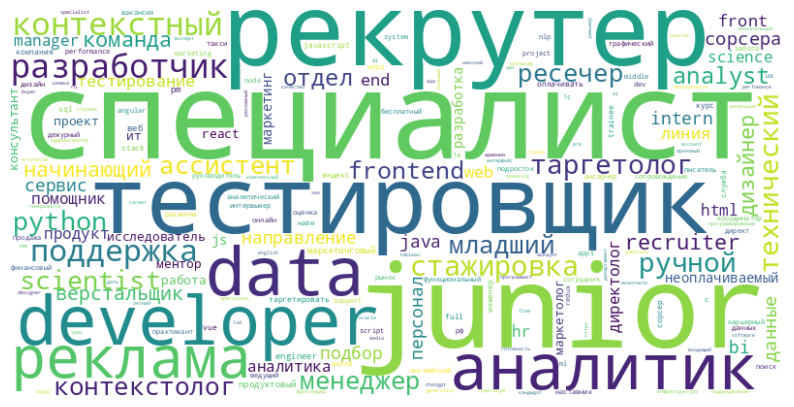

In [ ]:
new_num_0 = ' '.join(doof.query('new_num == 0')['job_title'])
function_worldcloud(text=new_num_0)

In [ ]:
new_num_0

'технический интервьюер тестировщик ( ручной ) seo-специалист специалист data science таргетолог специалист data science рекламный аналитик директ тестировщик ( ручной ) it-рекрутер junior frontend developer junior+ frontend developer ( обязательный релокация армения готовность работать страна ) junior marketing manager начинающий hr/рекрутер junior тестировщик 1с it- ресечер recruiter ментор направление интенсив больший дать специалист контекстный реклама младший it-recruiter junior front-end разработчик frontend-разработчик подразделение комплексный безопасность рисерчер начинающий рекрутер it-рекрутер it-рекрутер младший it-рекрутер департамент сопровождение junior recruiter ( english speaking ) контекстолог it-компания тестировщик ux- исследователь специалист технический поддержка 1ой линия тестировщик it-рисерчер it-сорсера ( начинающий ступень it-рекрутер ) сервис яндекс такси сорсера команда сервис наём junior front-end разработчик perfomance-маркетолог junior рекрутер специалис

0:  project manager, junior

In [ ]:
doof.query('new_num == 1')['job_title'].sample(10)

793               project manager
179               project manager
49      project marketing manager
661               project manager
1062              product manager
937        стажёр project manager
768        middle product manager
1187              project manager
962        product manager middle
80                project manager
Name: job_title, dtype: object

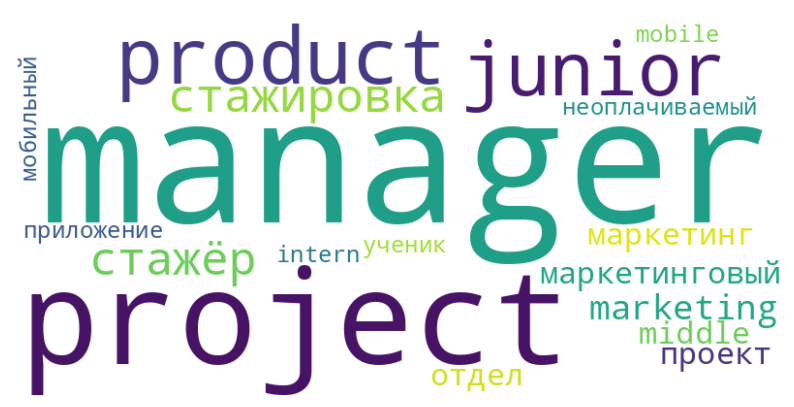

In [ ]:
new_num_1 = ' '.join(doof.query('new_num == 1')['job_title'])
function_worldcloud(text=new_num_1)

In [ ]:
new_num_1

'junior project manager project-manager project manager project manager project manager project marketing manager project marketing manager project manager project manager junior project manager ( mobile ) product manager project manager project manager project manager project manager project manager стажёр project manager project manager project manager project manager project manager ( маркетинговый проект ) project manager junior project manager project manager project manager project manager intern project manager project manager junior project manager project manager project manager project manager project manager project manager product manager ученик ( project manager ) project manager project manager project manager ( маркетинговый проект ) project/product manager junior project manager junior project manager project manager стажёр project manager project manager project manager project manager junior project manager project manager project manager project manager junior projec

1: junior

In [ ]:
doof.query('new_num == 2')['job_title'].sample(10)

268     менеджер проект ( маркетинг )
332                   менеджер проект
252              администратор проект
1149                 контент менеджер
704                менеджер it-проект
726       начинающий аккаунт-менеджер
642                   менеджер проект
580          помощник менеджер проект
602      менеджер проектов/маркетолог
126     менеджер проект ( маркетинг )
Name: job_title, dtype: object

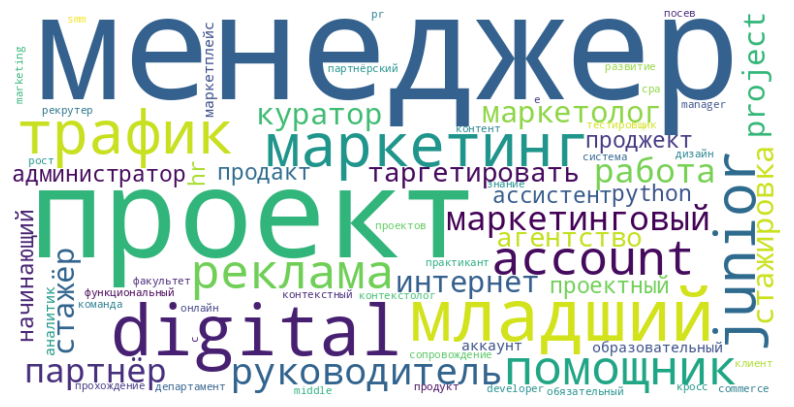

In [ ]:
new_num_2 = ' '.join(doof.query('new_num == 2')['job_title'])
function_worldcloud(text=new_num_2)

In [ ]:
new_num_2

'менеджер контекстный реклама pr-менеджер junior account менеджер ( младший менеджер digital-проект ) руководитель проект реклама ( маркетолог ) рекрутер / младший hr-менеджер менеджер посев проектный менеджер практикант менеджер проект трафик junior/middle трафик-менеджер младший менеджер digital-проект менеджер проект ( маркетинг ) начинающий менеджер партнёрский маркетинг трафик менеджер младший hr менеджер менеджер проект помощник менеджер проект менеджер проект менеджер проект ассистент менеджер проект менеджер проект знание python менеджер digital-проект администратор проект менеджер проект ( маркетинг ) куратор проект менеджер digital-проект smm менеджер менеджер проект менеджер проект project менеджер ( digital ) менеджер проект digital junior маркетинг-менеджер менеджер проект менеджер проект руководитель проект менеджер проект факультет дизайн младший менеджер digital-проект менеджер проект ( стажёр ) менеджер проект менеджер проект менеджер департамент интернет-проект продже

2:  Разработчик python

In [ ]:
doof.query('new_num == 3')['job_title'].sample(10)

1053               аналитик данные
1001        junior аналитик данные
860                аналитик данные
1029    аналитик данные ( junior )
887                аналитик данные
521         стажёр аналитик данные
1055        аналитик данные проект
833                аналитик данные
372                аналитик данные
134                аналитик данные
Name: job_title, dtype: object

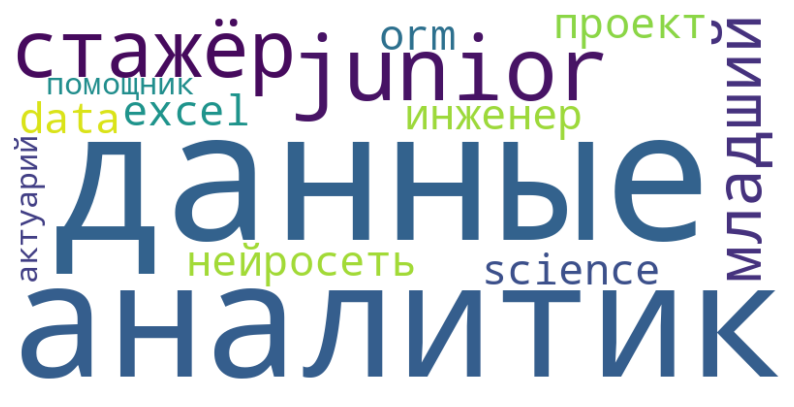

In [ ]:
new_num_3 = ' '.join(doof.query('new_num == 3')['job_title'])
function_worldcloud(text=new_num_3)

In [ ]:
new_num_3

'junior аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные ( нейросеть ) аналитик данные аналитик данные младший аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные инженер данные аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик данные аналитик данные аналитик данные ( data science junior ) аналитик данные - стажёр аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные аналитик данные стажёр аналитик данные аналитик данные excel младший аналитик данные аналитик данные orm аналитик данные junior аналитик данные аналитик данные аналитик данные ( junior ) аналитик данные аналитик данные проект аналитик данные ана

3: Аналитик данных

In [ ]:
doof.query('new_num == 4')['job_title'].sample(10)

990                                стажёр бизнес-аналитик
552                           стажёр-разработчик frontend
948                    стажёр qa ( мобильный разработка )
731                                    стажёр it-рекрутер
1011                        стажёр управление база данные
444     стажёр frontend-разработчик ( неоплачиваемый с...
1164                            python-разработчик стажёр
362                         дизайнер интерфейс ( стажёр )
1267                                стажёр направление qa
572                                             стажёр qa
Name: job_title, dtype: object

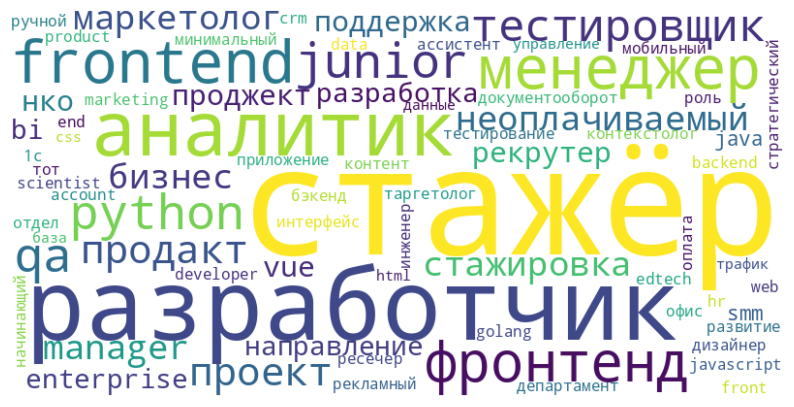

In [ ]:
new_num_4 = ' '.join(doof.query('new_num == 4')['job_title'])
function_worldcloud(text=new_num_4)

In [ ]:
new_num_4

'стажёр python разработчик ( неоплачиваемый стажировка нко ) стажёр smm проект стажёр java разработчик стажёр аналитик документооборот стажёр frontend разработчик ( vue 3 ) стажёр-ассистент разработчик javascript стажёр проджект менеджер стажёр web-разработчик стажёр-тестировщик стажёр frontend-разработчик ( неоплачиваемый ) стажёр frontend-разработчик фронтенд-разработчик стажёр стажёр frontend-разработчик стажёр 1с junior marketing manager ( стажёр ) junior frontend разработчик ( стажёр ) контекстолог стажёр junior python-разработчик ( стажёр ) junior фронтенд-разработчик ( стажёр ) стажёр-аналитик дизайнер интерфейс ( стажёр ) стажёр it-рекрутер стажёр account manager рекламный аналитик стажёр фронтенд-разработчик стажёр фронтенд-разработчик стажёр стажёр бэкенд-разработчик стажёр frontend-разработчик ( неоплачиваемый стажировка ) стажёр продакт-менеджер стажёр тот поддержка стажёр роль контент-менеджер фронтенд-разработчик ( стажёр ) front-end разработчик офис ( стажёр ) стажёр-раз

4: Менеджер проекта, рекрутер и прочее

In [ ]:
doof.query('new_num == 5')['job_title'].sample(10)

951                                   интернет-маркетолог
1200                                  помощник маркетолог
450                                    контент маркетолог
733                            junior интернет-маркетолог
122                                   интернет-маркетолог
48      помощник интернет-маркетолог ( контекстный рек...
1140                                           маркетолог
542                                   интернет-маркетолог
715                                   интернет-маркетолог
328                                   интернет-маркетолог
Name: job_title, dtype: object

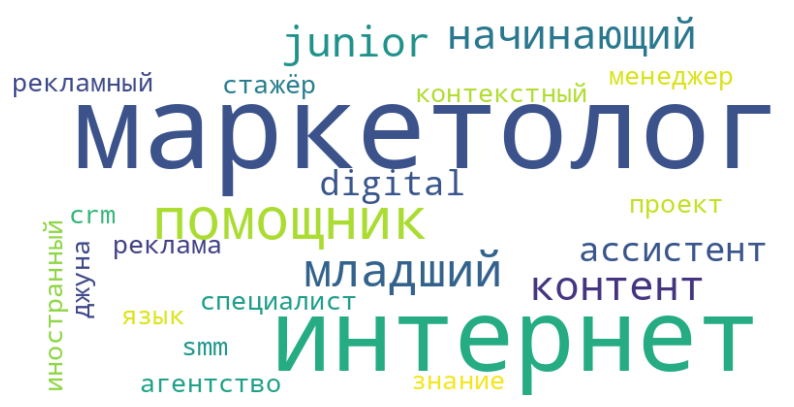

In [ ]:
new_num_5 = ' '.join(doof.query('new_num == 5')['job_title'])
function_worldcloud(text=new_num_5)

In [ ]:
new_num_5

'младший интернет-маркетолог знание иностранный язык интернет-маркетолог помощник интернет-маркетолог ( контекстный реклама ) junior маркетолог digital маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог помощник интернет-маркетолог контент-маркетолог интернет-маркетолог помощник маркетолог интернет-маркетолог интернет-маркетолог маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог помощник интернет-маркетолог интернет-маркетолог ( джуна , стажёр ) интернет-маркетолог контент маркетолог интернет-маркетолог интернет-маркетолог проект контент-маркетолог интернет-маркетолог интернет-маркетолог ассистент маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог интернет-маркетолог начинающий маркетолог интернет-маркетолог интернет-маркетолог ( рекламный специалист ) начинающий маркетолог младший маркетолог интернет-маркетолог интернет-маркето

5: Аналитик системный и прочие аналитики

In [ ]:
doof.query('new_num == 6')['job_title'].sample(10)

241            ux/ui дизайнер
1228    junior ux/ui дизайнер
293              веб-дизайнер
754              веб-дизайнер
1112              ux-дизайнер
939            ux/ui дизайнер
1064           ux/ui дизайнер
302              веб-дизайнер
470          ux | ui дизайнер
655            ux/ui дизайнер
Name: job_title, dtype: object

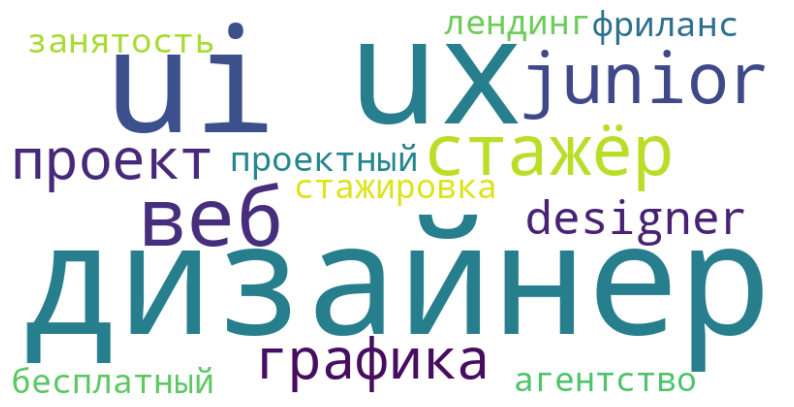

In [ ]:
new_num_6 = ' '.join(doof.query('new_num == 6')['job_title'])
function_worldcloud(text=new_num_6)

In [ ]:
new_num_6

'ux/ui дизайнер-стажёр ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер дизайнер ( графика , ux/ui ) дизайнер ( графика , ux/ui ) ux/ui дизайнер ux/ui дизайнер лендинг ( проектный занятость , фриланс ) ux дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер дизайнер ( графика , ux/ui ) junior ux/ui ux/ui дизайнер веб-дизайнер веб-дизайнер ux/ui дизайнер дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер дизайнер ux ui ( стажёр / junior ) веб дизайнер ( ui дизайнер ) ux | ui дизайнер ux/ui дизайнер ux/ui-дизайнер ( бесплатный стажировка ) junior+ ux/ui дизайнер веб-дизайнер веб-дизайнер ux/ui дизайнер ui/ux дизайнер ux/ui designer ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер-стажёр веб-дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ( проект ) ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер ux/ui дизайнер агентство ux/ui дизайнер ux/ui дизайнер стажёр ux/ui дизайнер дизайнер веб-дизайнер junior ux/ui designer 

6: "фронтенд-разработчик" (кириллицей)


In [ ]:
doof.query('new_num == 7')['job_title'].sample(10)

919                                  junior qa инженер
1273              junior nlp инженер знание английский
923                                     devops инженер
76      младший инженер тестирование ( автоматизация )
393                                     devops инженер
155                               инженер тестирование
974                        стажёр инженер тестирование
415                        junior инженер тестирование
512                           devops инженер ( linux )
135                            junior qa автоматизатор
Name: job_title, dtype: object

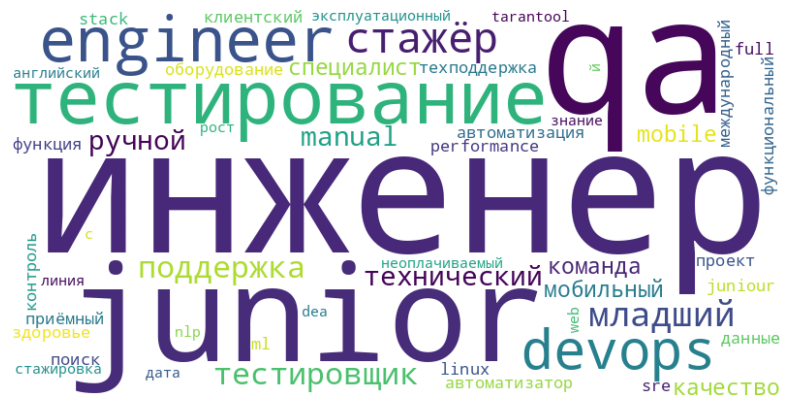

In [ ]:
new_num_7 = ' '.join(doof.query('new_num == 7')['job_title'])
function_worldcloud(text=new_num_7)

In [ ]:
new_num_7

'тестировщик / junior qa инженер тестирование ( qa ) devops engineer младший инженер тестирование ( автоматизация ) инженер контроль качество junior qa engineer младший инженер тестирование ( qa performance engineer junior ) junior инженер тестирование devops инженер инженер тестирование инженер тестирование ( manual ) junior qa автоматизатор junior qa инженер технический поддержка инженер ручной тестирование инженер тестирование junior qa инженер инженер технический поддержка инженер тестирование инженер тестирование функция техподдержка junior qa инженер инженер тестирование младший инженер тестирование инженер тестирование ( qa стажёр ) sre & devops-инженер ( стажёр ) qa инженер qa engineer ( mobile ) специалист qa devops инженер juniour инженер тестирование стажёр , qa-инженер junior devops engineer инженер тестирование devops инженер devops инженер junior инженер тестирование junior devops инженер junior qa engineer junior qa engineer junior qa engineer junior qa инженер junior qa

7: маркетолог, тестировщик и прочее

In [ ]:
doof.query('new_num == 8')['job_title'].sample(10)

1157     python-разработчик ( неоплачиваемый стажировка )
1128                                   python-разработчик
259                             middle python-разработчик
1174                      java-разработчик ( стажировка )
93                            middle frontend-разработчик
737                                    python-разработчик
870                                  фронтенд-разработчик
570                        frontend-разработчик ( react )
824     frontend-разработчик ( неоплачиваемый стажиров...
1268                          разработчик / developer с++
Name: job_title, dtype: object

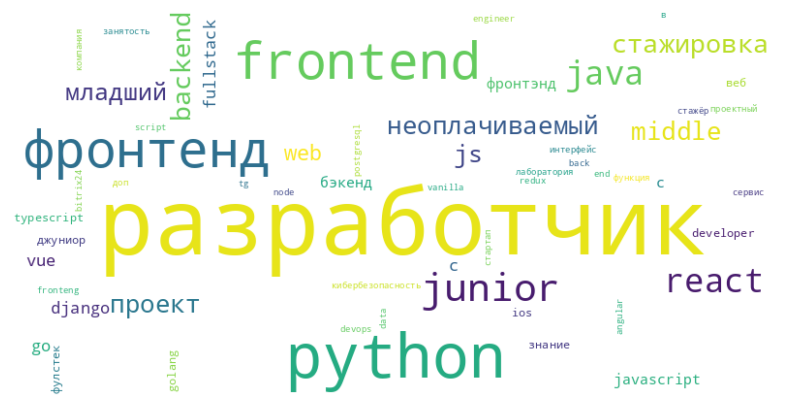

In [ ]:
new_num_8 = ' '.join(doof.query('new_num == 8')['job_title'])
function_worldcloud(text=new_num_8)

In [ ]:
new_num_8

'js-разработчик младший разработчик фронтенд разработчик проект python-разработчик знание postgresql frontend/fullstack разработчик angular junior python разработчик golang-разработчик frontend-разработчик python-разработчик frontend-разработчик frontend-разработчик frontend-разработчик junior web-разработчик frontend разработчик react middle frontend-разработчик фронтенд-разработчик java-разработчик разработчик vue.js java-разработчик frontend-разработчик разработчик python python-разработчик middle frontend-разработчик middle python-разработчик frontend-разработчик ( react ) junior python разработчик junior python-разработчик python-разработчик фронтенд-разработчик фронтенд-разработчик junior go-разработчик go разработчик python-разработчик middle фронтенд разработчик ( проектный занятость ) junior frontend-разработчик фронтенд разработчик python разработчик ( с функция devops ) java разработчик python разработчик junior python разработчик junior frontend-разработчик фронтенд-разрабо

8: Дизайнер




In [ ]:
doof.query('new_num == 9')['job_title'].sample(10)

1173                системный аналитик ( стажировка )
677                                          аналитик
373                                          аналитик
916                                системный аналитик
1036    стажёр системный аналитик ( бизнес-аналитик )
800                     системный аналитик ( junior )
909                                системный аналитик
822                                  младший аналитик
921                                          аналитик
608                                системный аналитик
Name: job_title, dtype: object

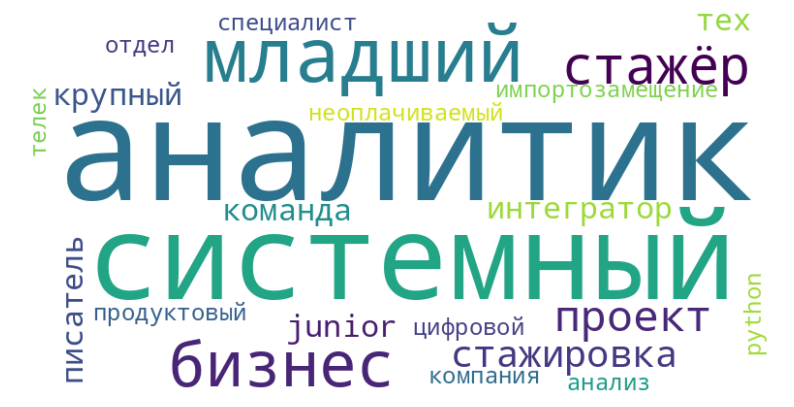

In [ ]:
new_num_9 = ' '.join(doof.query('new_num == 9')['job_title'])
function_worldcloud(text=new_num_9)

In [ ]:
new_num_9

'младший аналитик бизнес аналитик системный аналитик системный аналитик бизнес аналитик системный аналитик бизнес аналитик системный аналитик системный аналитик младший аналитик системный бизнес аналитик системный аналитик системный аналитик системный аналитик аналитик системный аналитик ( junior ) младший системный аналитик ( стажёр ) младший аналитик/тех писатель проект крупный системный интегратор стажёр системный - бизнес аналитик системный аналитик отдел импортозамещение системный аналитик младший аналитик аналитик системный аналитик младший аналитик стажёр системный аналитик системный аналитик аналитик/продуктовый аналитик системный аналитик аналитик системный аналитик системный аналитик аналитик системный аналитик младший аналитик младший аналитик системный аналитик системный аналитик ( специалист анализ цифровой проект ) системный аналитик ( junior ) стажёр системный - бизнес аналитик системный аналитик команда младший аналитик системный аналитик системный аналитик младший анал

9: "frontend" (латиницей)

Категории не полностью совпадают с теми, которые выделил человек и
видны недостатки метода:


*   Фронтенд и Frontend - а категории (кириллицей и латиницей)
*   Смешанные категории менеджеров и прочих (категории номер 4, 7)

In [ ]:
# Напишем функцию для присвоения названий кластерам
def txt_tags_10(row):
  if row == 0:
     return 'project manager, junior'
  if row == 1:
     return 'junior'
  if row == 2:
     return 'разработчик python'
  if row == 3:
     return 'аналитик данных'
  if row == 4:
     return 'менеджер проекта, рекрутер и прочее'
  if row == 5:
     return 'аналитик, аналитик системный'
  if row == 6:
     return '"фронтенд-разработчик" (кириллицей)'
  if row == 7:
     return 'маркетолог, тестировщик и прочее'
  if row == 8:
     return 'дизайнер'
  if row == 9:
     return '"frontend" (латиницей)'


In [ ]:
doof['cluster_10_name'] = doof['new_num'].apply(txt_tags_10)

In [ ]:
fig = px.histogram(doof,
                     x= 'cluster_10_name',
                     histnorm='percent',
                     title='Распределение названий вакансий алгоритмами машинного обучения, кластеризация KNN, 10 кластеров',
                     text_auto = True)
fig.update_layout(yaxis_title_text = 'Количество вакансий',
                  xaxis_title_text = 'Категория',
                  xaxis = {"categoryorder":"total descending"})
fig.update_traces(texttemplate='%{y:.2f}%')
fig.show()

**Выводы по кластеризации** На материале сортировки названий по категориям можно сравнить результаты "ручного" разделения по категориям и кластеризации методом KNN. Результаты применения KNN в целом адекватны, и вероятно показали результат лучше при большом количестве категорий, но в данном случае не точнее и не быстрее "ручного" способа присвоения категорий.
В качестве плана на будущее тут можно посчитать метрики типа accuracy или Bleu

###Bert (SBert)


####Преобразование текста в embeddings



In [ ]:
#stop

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("ai-forever/sbert_large_mt_nlu_ru")
model = AutoModel.from_pretrained("ai-forever/sbert_large_mt_nlu_ru")

tokenizer_config.json:   0%|          | 0.00/331 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/752 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.78M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

In [ ]:
#копируем отдельный датасет для этого раздела, нужно количество кратное 100, были пробы с 1000 и 1200 и 1300
#data1 = df.sample(1300), reset_index(drop=True)
data1 = df.sample(1300).reset_index(drop=True)

In [ ]:
data1

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,contract,format,experience,education,test_task,employment,mandatory,additional,comр_stages,work_conditions
0,738,Архив,Повторная,Иванова,2023-04-18,2023-06-08,19,11,Kokoc Group,Младший рекрутер,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...","Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,"Волонтерство, Проектная, Частичная, Стажировка...","Английский - базовый, например, для сорсинга н...",NaN,Планируется два этапа: _x000D_\nпервая встреча...,Предлагаем:_x000D_\n_x000D_\n- Работу в крупно...
1,1965,Архив,Повторная,Фаткуллин,2023-11-22,2023-12-21,45,22,ПИК Digital,Младший тестировщик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...","Офис, Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,Справиться с задачами поможет:_x000D_\n_x000D_...,NaN,"2 этапа, дистанционный формат в GoogleMeet:_x0...","Удаленка только с территории РФ, если кандидат..."
2,1236,Архив,Повторная,Кариаули,2023-07-14,2023-08-16,43,8,Qtim,Веб-разработчик Vue.js,...,Трудовой договор,"Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,"- JavaScript ES6+_x000D_\n- Vue.js (+Vuex, Vue...",- Умение работать с [Socket.IO](http://socket....,- Просмотр резюме_x000D_\n- Техническое собесе...,"1. Удалённая работа, можно работать в офисе в ..."
3,1659,Закрыта нами,Реферальная,Игнатенко,2023-09-13,2023-10-05,13,9,ЗАО МПО Электромонтаж,Frontend-разработчик (React),...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Офис,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,1. Знание React_x000D_\n2. Умение верстать,1. Опыт будет плюсом,1. Скрининг_x000D_\n2. Тестовое задание,1. Работа в офисе_x000D_\n2. Полная занятость_...
4,630,Архив,Реферальная,Селиверстова,2023-03-31,2023-06-07,108,11,Dog Box,Графический дизайнер,...,Самозанятость,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Проектная,- знание Photoshop и Indesign;_x000D_\n- налич...,- плюсом будем художественное образование,1. Скрининг портфолио._x000D_\n2. Возможно тес...,- проектная занятость;_x000D_\n- оплата 15.000...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295,1993,Закрыта нами,Сорсинг,Фаткуллин,2023-11-30,2023-12-01,12,1,MadDog,Фронтенд-разработчик,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Стажировка,Стек:_x000D_\nReact_x000D_\nRedux _x000D_\nRea...,NaN,1. Скрининг резюме _x000D_\n2. Собеседование т...,Стажировка неоплачиваемая для работы на боевых...
1296,1719,Архив,Повторная,Иванова,2023-09-26,2023-10-27,45,19,TalkBank,Junior QA инженер,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...","Офис, Гибрид","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,- Теоретические знания: методологии тестирован...,NaN,Скрининг_x000D_\nИнтервью,- Работа в крутом глобальном финтех-стартапе (...
1297,1039,Отклонена,Входящая заявка,Корягина,2023-06-16,2023-08-15,24,8,Whitemark,Project Manager,...,Трудовой договор,Офис,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",NaN,Полная,— Минимальный проектный опыт (пет-проекты и НК...,— Английский язык будет плюсом; _x000D_\n— Опы...,1. Просмотр резюме; _x000D_\n2. Собеседование ...,"— Работа в офисе, гибкий график работы, комфор..."
1298,1004,Закрыта нами,Входящая заявка,Корягина,2023-06-09,2023-06-21,38,26,LemonPie,Junior QA,...,"Самозанятость, ИП",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","

In [ ]:
data1.to_csv(r'data1.csv', sep=',')

In [ ]:
data1['additional']= data1['additional'].fillna('или')
#датасет и так невелик, поэтому нашла выход чем нейтральным заполнить пропуски в "additional"

In [ ]:
files.download('data1.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
data1['language'] = data1['mandatory']+data1['work_conditions']+data1['job_title']+data1['additional']


In [ ]:
print(data1['language'].tail())

1295    Стек:_x000D_\nReact_x000D_\nRedux _x000D_\nRea...
1296    - Теоретические знания: методологии тестирован...
1297    — Минимальный проектный опыт (пет-проекты и НК...
1298    — Знание теории тестирования (виды, методы, эт...
1299    Excel на высоком уровне;_x000D_\nУверенное зна...
Name: language, dtype: object


In [ ]:
data1['target']=data1['responses']/data1['views']#таргетом будет конверсия в отклики

In [ ]:
print(data1['target'].tail())

1295    0.083333
1296    0.422222
1297    0.333333
1298    0.684211
1299    0.516129
Name: target, dtype: float64


In [ ]:

target = data1['target']
print(target.shape)

(1300,)


In [ ]:
tokenized = data1['language'].apply(
    lambda x: tokenizer.encode(x, add_special_tokens=True, max_length=512, truncation=True))

max_len = 0
for i in tokenized.values:
    if len(i) > max_len:
        max_len = len(i)

padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])

attention_mask = np.where(padded != 0, 1, 0)

In [ ]:
batch_size = 100

In [ ]:
#Этот код ждать выполнения не обязательно, он считался в Colab около 4 часов, я выгрузила его результаты дальше как переменные

batch_size = 100
embeddings = []
for i in notebook.tqdm(range(padded.shape[0] // batch_size)):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])

        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        #embeddings.append(batch_embeddings[0][:,:].numpy())
        embeddings.append(batch_embeddings[0][:,0,:].numpy())
        del batch
        del attention_mask_batch
        del batch_embeddings



  0%|          | 0/13 [00:00<?, ?it/s]

**Результат** создание embeddings с помощью BERT


In [ ]:
features = np.concatenate(embeddings)


**Результат** создание признаков (embeddings)




####Сохранение и выгрузка результатов расчета признаков



**адрес папки где размещены данные**:https://github.com/MariaPetrovskaya/Data-Science-for-HR/tree/d2e0574baa3d96ff8d005b9fb028e8a34b658dfe/%D0%90%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7%20%D0%B4%D0%B0%D0%BD%D0%BD%D1%8B%D1%85%20%D0%BA%D0%B0%D0%B4%D1%80%D0%BE%D0%B2%D0%BE%D0%B3%D0%BE%20%D0%B0%D0%B3%D0%B5%D0%BD%D1%82%D1%81%D1%82%D0%B2%D0%B0%2C%20DA%2C%20ML%2C%20NLP/embeddings



In [ ]:
print('features:', features.shape)

features: (1300, 1024)


In [ ]:
df_features = pd.DataFrame(data=features)

In [ ]:
df_features.to_csv(r'features.csv', sep=',')

In [ ]:
target.to_csv(r'target.csv', sep=',')

In [ ]:
files.download('target.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('features.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

####Загрузка результатов расчета признаков



In [ ]:
uploaded = files.upload()

Saving features (10).csv to features (10).csv


In [ ]:
features = pd.read_csv('features (10).csv', index_col=0)
display (features.sample(5))

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
1115,-0.168168,0.251256,-1.438496,-0.896731,-0.128147,-0.158644,-0.212124,-0.010320,0.548454,-1.175310,...,0.042113,1.241474,-0.482284,1.558375,0.255981,0.010931,0.385675,0.232129,-0.024702,-0.209862
776,0.504463,0.319942,-0.794037,-1.294524,-0.313043,0.029182,-0.347789,0.168199,0.390047,-0.857491,...,-0.361967,1.825736,-0.240813,1.673146,0.067968,0.277426,0.062206,-0.087875,-0.298403,0.140748
158,0.088879,0.097327,-1.250362,-0.864838,-0.617277,-0.334134,-0.663437,0.119369,0.269940,-0.911905,...,0.042688,1.646755,-0.813707,1.519355,-0.097406,-0.164954,0.272694,0.157651,-0.057719,0.286392
294,0.019450,0.227937,-1.009492,-0.585730,-0.242536,-0.453074,-0.566777,0.263970,0.290926,-0.047615,...,-0.528111,1.931220,-0.483687,0.648877,-0.126706,-0.116827,-0.287915,-0.340109,-0.182754,0.066258
144,0.235291,0.493465,-0.795047,-0.998357,-0.261617,-0.566036,-0.517183,0.217907,0.393765,-0.653508,...,0.023803,2.259651,-0.359539,0.258524,-0.414406,0.036173,0.007631,0.172636,-0.533784,0.467604


In [ ]:
uploaded = files.upload()

KeyboardInterrupt: 

In [ ]:
data1 = pd.read_csv('data1.csv', index_col=0)
display (data1.sample(5))

FileNotFoundError: [Errno 2] No such file or directory: 'data1.csv'

In [ ]:
data1['target']=data1['responses']/data1['views']#таргетом будет конверсия в отклики

In [ ]:
uploaded = files.upload()

Saving target (11).csv to target (11).csv


In [ ]:
target = pd.read_csv('target (11).csv', index_col=0)
display (target.sample(5))

,target
530,0.240000
411,0.333333
1269,0.222222
142,0.714286
45,0.366667


In [ ]:
target = data1['target']
display (target.sample(5))

KeyError: 'target'

In [ ]:
print('features shape:', features.shape)

print('target shape:', target.shape)

features shape: (1300, 1024)
target shape: (1300, 1)


In [ ]:
df_features = features.copy()

**Результат** признаки и таргет сохранены как файл, далее повторно загружены как файл

###Различные модели библиотеки Sklearn

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
features_train, features_valid_test, target_train, target_valid_test = train_test_split(
    features, target, test_size=0.40, random_state=12345)
features_valid, features_test, target_valid, target_test = train_test_split(
    features_valid_test, target_valid_test, test_size=0.50, random_state=12345)
print('features_train shape:', features_train.shape)
print('features_valid shape:', features_valid.shape)
print('features_test shape:', features_test.shape)
print('target_train shape:', target_train.shape)
print('target_valid shape:', target_valid.shape)
print('target_test shape:', target_test.shape)

features_train shape: (780, 1024)
features_valid shape: (260, 1024)
features_test shape: (260, 1024)
target_train shape: (780, 1)
target_valid shape: (260, 1)
target_test shape: (260, 1)


In [ ]:
%%time
model = LinearRegression()
model.fit(features_train,target_train)


CPU times: user 697 ms, sys: 519 ms, total: 1.22 s
Wall time: 1.13 s


LinearRegression()

In [ ]:
%%time
predictions_valid= model.predict(features_valid)
result = mean_squared_error(target_valid, predictions_valid)**0.5
print("RMSE модели линейной регрессии на валидационной выборке:", result)

RMSE модели линейной регрессии на валидационной выборке: 222176976.96044594
CPU times: user 24.8 ms, sys: 6.36 ms, total: 31.2 ms
Wall time: 44.9 ms


In [ ]:
%%time
predictions_valid= model.predict(features_valid)
result = mean_absolute_error(target_valid, predictions_valid)**0.5
print("MAE модели линейной регрессии на валидационной выборке:", result)

MAE модели линейной регрессии на валидационной выборке: 12783.124044373772
CPU times: user 23.6 ms, sys: 6.67 ms, total: 30.3 ms
Wall time: 42.3 ms


**проба на новом датасете выборка 1200**
RMSE модели линейной регрессии на валидационной выборке: 0.47490666857578623
CPU times: user 5.82 ms, sys: 4.02 ms, total: 9.84 ms
Wall time: 17.5 ms

Вывод: модель линейной регрессии не подходит для нашей задачи

In [ ]:
%%time
best_mod = None
best_res = 3000
best_dep = 0
for depth in range(2, 10, 2):
    for est in range(5, 50, 5):
        model = RandomForestRegressor(n_estimators=est,
        max_depth=depth, random_state=12345)
        print(model)
        print('время обучения модели')
        %timeit model.fit(features_train, target_train)
        print('время предсказания')
        %timeit model.predict(features_valid)
        preditions_forest = model.predict(features_valid)
        res_forest = mean_absolute_error(target_valid, preditions_forest)
        print("MAE модели случайного леса на валидационной выборке:", res_forest)
        if res_forest < best_res:
            best_mod = model
            best_res = res_forest
            best_deр = depth
print('Cамая эффективная модель - best_mod',best_mod)
print("MAE наилучшей модели:", best_res)

RandomForestRegressor(max_depth=2, n_estimators=5, random_state=12345)
время обучения модели
927 ms ± 248 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время предсказания
27.1 ms ± 1.67 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
MAE модели случайного леса на валидационной выборке: 0.15847093508240087
RandomForestRegressor(max_depth=2, n_estimators=10, random_state=12345)
время обучения модели
1.1 s ± 61.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время предсказания
11.4 ms ± 3.06 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
MAE модели случайного леса на валидационной выборке: 0.15737713848743132
RandomForestRegressor(max_depth=2, n_estimators=15, random_state=12345)
время обучения модели
1.76 s ± 247 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время предсказания
12 ms ± 2.74 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
MAE модели случайного леса на валидационной выборке: 0.15793066158517965
RandomForestRegressor(max_dep

Cамая эффективная модель - best_mod RandomForestRegressor(max_depth=6, n_estimators=45, random_state=12345)
MAE наилучшей модели: 0.15474127891119038
CPU times: user 37min 47s, sys: 2.93 s, total: 37min 50s
Wall time: 38min 5s

In [ ]:
%%time
best_mod = None
best_res = 3000
best_dep = 0
for depth in range(2, 10, 2):
    for est in range(5, 50, 5):
        model = RandomForestRegressor(n_estimators=est,
        max_depth=depth, random_state=12345)
        print(model)
        print('время обучения модели')
        %timeit model.fit(features_train, target_train)
        print('время предсказания')
        %timeit model.predict(features_valid)
        preditions_forest = model.predict(features_valid)
        res_forest = mean_squared_error(target_valid, preditions_forest)**0.5
        print("RMSE модели случайного леса на валидационной выборке:", res_forest)
        if res_forest < best_res:
            best_mod = model
            best_res = res_forest
            best_deр = depth
print('Cамая эффективная модель - best_mod',best_mod)
print("RMSE наилучшей модели:", best_res)

RandomForestRegressor(max_depth=2, n_estimators=5, random_state=12345)
время обучения модели
588 ms ± 11.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время предсказания
688 µs ± 24.6 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
RMSE модели случайного леса на валидационной выборке: 0.19602685250143323
RandomForestRegressor(max_depth=2, n_estimators=10, random_state=12345)
время обучения модели
1.24 s ± 162 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время предсказания
1.09 ms ± 230 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
RMSE модели случайного леса на валидационной выборке: 0.19310860636079985
RandomForestRegressor(max_depth=2, n_estimators=15, random_state=12345)
время обучения модели
1.87 s ± 257 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время предсказания
1.38 ms ± 313 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
RMSE модели случайного леса на валидационной выборке: 0.19265922032419722
RandomForestRegressor(

**проба на новом датасете выборка 1300 c признаком "test_task"** Cамая эффективная модель - best_mod RandomForestRegressor(max_depth=4, n_estimators=40, random_state=12345)
RMSE наилучшей модели: 0.19140016876934443
CPU times: user 37min 14s, sys: 3.18 s, total: 37min 17s
Wall time: 37min 38s

**проба на новом датасете выборка 1200**
Cамая эффективная модель - best_mod RandomForestRegressor(max_depth=4, n_estimators=35, random_state=12345)
RMSE наилучшей модели: 0.20507458480269972
CPU times: user 34min 57s, sys: 3.14 s, total: 35min
Wall time: 35min 12s

**Результаты пробы с features(7), target(7)**: Cамая эффективная модель - best_mod RandomForestRegressor(max_depth=2, n_estimators=45, random_state=12345)
RMSE наилучшей модели: 0.21777058670775135
CPU times: user 35min 56s, sys: 2.81 s, total: 35min 59s
Wall time: 37min 12s

**Результаты пробы с features(5), target(5), выборка 1000 строк**:  Cамая эффективная модель - best_mod RandomForestRegressor(max_depth=2, n_estimators=45, random_state=12345)
RMSE наилучшей модели: 0.21016804401101455
CPU times: user 29min 32s, sys: 2.04 s, total: 29min 34s
Wall time: 29min 44s

**Для пробы с датасетом без восстановленного 'additional':**Cамая эффективная модель - best_mod RandomForestRegressor(max_depth=4, n_estimators=45, random_state=12345)
RMSE наилучшей модели: 0.21772791481821865
CPU times: user 34min 2s, sys: 2.88 s, total: 34min 5s
Wall time: 35min 33s

In [ ]:
%%time

best_model = None
best_result = 3000
best_depth = 0
for depth in range(1, 50):
    model = DecisionTreeRegressor(max_depth=depth, random_state=12345)
    print(model)
    %timeit model.fit(features_train, target_train)
    print('время обучения модели')
    %timeit model.predict(features_valid)
    predictions_valid= model.predict(features_valid)
    print('время предсказания')
    result_tree = mean_absolute_error(target_valid, predictions_valid)
    print("МАЕ модели дерева решений на валидационной выборке:", result_tree)
    if result_tree < best_result:
            best_model = model
            best_result = result_tree
            best_deрth = depth
print('Cамая эффективная модель - best_mod',best_model)
print("MAE наилучшей модели:", best_result)

DecisionTreeRegressor(max_depth=1, random_state=12345)
140 ms ± 78.9 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
время обучения модели
11.1 ms ± 2.96 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
время предсказания
МАЕ модели дерева решений на валидационной выборке: 0.15985431024688293
DecisionTreeRegressor(max_depth=2, random_state=12345)
183 ms ± 26.6 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
время обучения модели
8.63 ms ± 75.5 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
время предсказания
МАЕ модели дерева решений на валидационной выборке: 0.16379522961390072
DecisionTreeRegressor(max_depth=3, random_state=12345)
268 ms ± 42.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время обучения модели
9.64 ms ± 2.28 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)
время предсказания
МАЕ модели дерева решений на валидационной выборке: 0.16539395779461122
DecisionTreeRegressor(max_depth=4, random_state=12345)
314 ms ± 5.79 ms 

Cамая эффективная модель - best_mod DecisionTreeRegressor(max_depth=1, random_state=12345)
MAE наилучшей модели: 0.15985431024688293
CPU times: user 12min 22s, sys: 1.08 s, total: 12min 23s
Wall time: 13min

In [ ]:
%%time

best_model = None
best_result = 3000
best_depth = 0
for depth in range(1, 50):
    model = DecisionTreeRegressor(max_depth=depth, random_state=12345)
    print(model)
    %timeit model.fit(features_train, target_train)
    print('время обучения модели')
    %timeit model.predict(features_valid)
    predictions_valid= model.predict(features_valid)
    print('время предсказания')
    result_tree = mean_squared_error(target_valid, predictions_valid)**0.5
    print("RMSE модели дерева решений на валидационной выборке:", result_tree)
    if result_tree < best_result:
            best_model = model
            best_result = result_tree
            best_deрth = depth
print('Cамая эффективная модель - best_mod',best_model)
print("RMSE наилучшей модели:", best_result)

DecisionTreeRegressor(max_depth=1, random_state=12345)
90.5 ms ± 4.37 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
время обучения модели
301 µs ± 75 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
время предсказания
RMSE модели дерева решений на валидационной выборке: 0.1965553375960897
DecisionTreeRegressor(max_depth=2, random_state=12345)
249 ms ± 4.59 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время обучения модели
219 µs ± 11.3 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
время предсказания
RMSE модели дерева решений на валидационной выборке: 0.21151728648330398
DecisionTreeRegressor(max_depth=3, random_state=12345)
261 ms ± 7.32 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
время обучения модели
207 µs ± 7.61 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)
время предсказания
RMSE модели дерева решений на валидационной выборке: 0.21746129147219181
DecisionTreeRegressor(max_depth=4, random_state=12345)
337 ms ± 7.24 ms p

**проба на новом датасете выборка 1300 c признаком "test_task"** Cамая эффективная модель - best_mod DecisionTreeRegressor(max_depth=1, random_state=12345)
RMSE наилучшей модели: 0.1965553375960897
CPU times: user 7min 44s, sys: 754 ms, total: 7min 45s
Wall time: 7min 49s

**проба на новом датасете выборка 1200**
Cамая эффективная модель - best_mod DecisionTreeRegressor(max_depth=1, random_state=12345)
RMSE наилучшей модели: 0.20894482192912825
CPU times: user 8min 37s, sys: 947 ms, total: 8min 37s
Wall time: 8min 41s

**Результаты пробы с features(7), target(7)**: Cамая эффективная модель - best_mod DecisionTreeRegressor(max_depth=1, random_state=12345)
RMSE наилучшей модели: 0.22170537698150172
CPU times: user 12min 8s, sys: 1.44 s, total: 12min 10s
Wall time: 12min 19s

**Результаты пробы с features(5), target(5), выборка 1000 строк:** Cамая эффективная модель - best_mod DecisionTreeRegressor(max_depth=1, random_state=12345)
RMSE наилучшей модели: 0.20874571824637356
CPU times: user 11min 13s, sys: 1.58 s, total: 11min 14s
Wall time: 11min 27s

**Для пробы с датасетом без восстановленного 'additional':** Cамая эффективная модель - best_mod DecisionTreeRegressor(max_depth=1, random_state=12345)
RMSE наилучшей модели: 0.22170537698150172
CPU times: user 9min 33s, sys: 963 ms, total: 9min 34s
Wall time: 9min 38s

###CatBoost

Кандидаты принимают решение откликаться на вакансию или нет на основе всей информации по вакансии. Поэтому модель будет сильнее, если к текстовым признаками (в виде embedding после обработки BERT) добавать также категориальные признаки из датасета. С такими данными может работать CatBoost

In [ ]:
data_good_cat=data1.copy()


In [ ]:
for column in data_good_cat:
    print(column)

id
status
lead_source
manager
start_date
end_date
views
responses
emp_brand
job_title
courses
salary_min
salary_max
city
contract
format
experience
education
test_task
employment
mandatory
additional
comр_stages
work_conditions


In [ ]:
cat_features = ['format', 'city', 'contract','experience','education','employment','test_task', 'emp_brand','courses']

In [ ]:
for column in data_good_cat:
    print(column)

id
status
lead_source
manager
start_date
end_date
views
responses
emp_brand
job_title
courses
salary_min
salary_max
city
contract
format
experience
education
test_task
employment
mandatory
additional
comр_stages
work_conditions


In [ ]:
print(data_good_cat.isna().sum())

id                    0
status                0
lead_source           9
manager              92
start_date            0
end_date            158
views                 0
responses             0
emp_brand             0
job_title             0
courses               0
salary_min          825
salary_max          925
city                  0
contract              0
format                0
experience            0
education             0
test_task          1193
employment            0
mandatory             0
additional          626
comр_stages           0
work_conditions       0
dtype: int64


In [ ]:
data_good_cat['test_task']= data_good_cat['test_task'].fillna('нет')
#датасет и так невелик, поэтому нашла выход чем нейтральным заполнить пропуски в "additional"

In [ ]:
data_good_cat[data_good_cat['test_task'].str.contains('http', na=False)]

,id,status,lead_source,manager,start_date,end_date,views,responses,emp_brand,job_title,...,contract,format,experience,education,test_task,employment,mandatory,additional,comр_stages,work_conditions
7,901,Отклонена,Входящая заявка,Корягина,2023-05-26,2023-07-24,74,20,Pitch,Ассистент PM / Младший PM,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",https://docs.google.com/document/d/1C3NdT-_jHu...,Полная,"— Базовое понимание работы web-приложений, про...",— Опыт работы с IT-проектами (можно пет-проект...,1. Просмотр резюме и тестового задания; _x000D...,— Удаленная работа; _x000D_\n— Менторство со с...
40,852,Закрыта нами,Входящая заявка,Корягина,2023-05-17,2023-06-08,49,4,JoyWin - Digital студия,Менеджер проектов,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",https://docs.google.com/document/d/12zFoZ8nRVp...,Полная,— Опыт эффективных коммуникаций с заказчиками ...,NaN,"Перед откликом необходимо заполнить анкету, чт...","— Обучение продукту и алгоритмам (регламенты, ..."
46,1816,Архив,Повторная,Фаткуллин,2023-10-17,2023-12-05,96,13,Яндекс Крауд,Специалист по тестированию,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",https://forms.yandex.ru/surveys/13467459.39931...,Полная,работали тестировщиком больше 1 года;_x000D_\n...,NaN,1. Заполнение формы на сайте:_x000D_\nhttps://...,"тестировать приложения, сайты и устройства;_x0..."
52,1241,Архив,Входящая заявка,Иванова,2023-07-17,2023-09-05,23,1,Меридиан Групп,FullStack разработчик Python/js,...,Трудовой договор,"Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Около-релевантное (например, техническое образ...",https://drive.google.com/file/d/1FVf0aHBZTmCo7...,Полная,Опыт работы с Python3 ;_x000D_\nОпыт работы с ...,Опыт разработки приложений на базе C# под .NET...,1) ТЗ_x000D_\nНеобходимо написать функцию на p...,- Оформление в соответствие с ТК РФ;_x000D_\n-...
61,1021,Закрыта нами,Повторная,Иванова,2023-06-13,2023-07-12,156,17,Mains Lab,Аналитик данных,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",https://incredible-tulip-5c3.notion.site/1639c...,Полная,1. Английский на уровне intermediate (ОБЯЗАТЕЛ...,NaN,Тестовое задание (прикреплено к вакансии)_x000...,"1. Удаленная работа, поэтому рассматриваем люб..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1248,1127,На рассмотрении,Входящая заявка,NaN,2023-06-29,NaN,29,1,AGM Group,Junior таргетолог,...,Трудовой договор,"Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",https://drive.google.com/file/d/1-x9vNPbU0XlcT...,Полная,"Ты наш краш, если:_x000D_\n_x000D_\n- имеешь о...","Наличие сертификатов VK Рекламы, Вконтакте и M...",- скрининг резюме и проверка тестового задания...,Зачем мы тебе? А потому что мы круты и предлаг...
1262,1705,На рассмотрении,Повторная,Кариаули,2023-09-21,NaN,269,14,Mains Lab,аналитик данных/исследователь в команду health...,...,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",https://incredible-tulip-5c3.notion.site/FWA-1...,Полная,"1. Python для анализа данных, pandas, numpy_x0...",NaN,1. Тестовое задание _x000D_\n2. Обязательный ф...,"1. Удаленная работа, поэтому рассматриваем люб..."
1263,904,Архив,Входящая заявка,Корягина,2023-05-29,2023-08-15,29,3,"Диджитал-студия ""Синдром отличника""",Таргетолог,...,"Самозанятость, Контракт, ИП, ГПХ",Удаленка,"Около-релевантный (Pet-проекты, open-

In [ ]:
def tags_clean(x, nan_value= None):
    for column in x:
        txt = re.sub(r'(https?://[\S]+)', 'есть', x) # html tags change to spaces
        #txt = re.sub(COMMENTS, ' ', txt) # comments in parentheses change to spaces
        # txt = ' '.join(txt.split())
    return txt

In [ ]:
data_good_cat['test_task'] = data_good_cat['test_task'].apply(tags_clean)

In [ ]:
data_good_cat['test_task'].sample(20)
# data_good_cat['test_task']= data_good_cat['test_task'].fillna("есть')
# #датасет и так невелик, поэтому нашла выход чем нейтральным заполнить пропуски в "additional"

1204     нет
535      нет
135      нет
851      нет
583      нет
212      нет
1104     нет
43       нет
649      нет
247      нет
1003     нет
932      нет
205      нет
409      нет
373      нет
356      нет
303      нет
513      нет
218      нет
211     есть
Name: test_task, dtype: object

In [ ]:
data_good_cat['test_task']= data_good_cat['test_task'].fillna('есть')
#датасет и так невелик, поэтому нашла выход чем нейтральным заполнить пропуски в "additional"

In [ ]:
data_good_cat['test_task'].sample(30)

441      нет
611      нет
636      нет
298      нет
495      нет
173     есть
1218     нет
569      нет
464      нет
77       нет
683      нет
27       нет
247      нет
1054     нет
408      нет
1107     нет
426      нет
909      нет
1224     нет
354      нет
1101     нет
160      нет
650      нет
1158     нет
696      нет
90       нет
823      нет
189      нет
436      нет
577      нет
Name: test_task, dtype: object

In [ ]:
target=data_good_cat['target']

KeyError: 'target'

In [ ]:
data_good_cat=data_good_cat.drop(['id','status','lead_source','manager', 'start_date', 'end_date', 'salary_min','salary_max','tagget'], axis=1)


Обе колонки с "salary" я убираю по двум причинам


*   Catboost не будет работать с пропусками данных, и нет решения чем отсутствующие данные заменить.
*   А что, если вынести очевидный параметр привлекательности зарплаты за пределы исследовательской задачи...Работодатели очень любят "не монетарные" стимулы :))




In [ ]:
print(data_good_cat.isna().sum())

views                0
responses            0
emp_brand            0
job_title            0
courses              0
city                 0
contract             0
format               0
experience           0
education            0
test_task            0
employment           0
mandatory            0
additional         626
comр_stages          0
work_conditions      0
dtype: int64


In [ ]:
data_good_cat=data_good_cat.drop(['views','responses','job_title','mandatory', 'additional', 'work_conditions', 'language', 'comр_stages'], axis=1)


KeyError: "['language'] not found in axis"

In [ ]:
print(data_good_cat.isna().sum())

emp_brand     0
courses       0
city          0
contract      0
format        0
experience    0
education     0
test_task     0
employment    0
dtype: int64


In [ ]:
print(data_good_cat.shape)

(1300, 9)


In [ ]:
print('features shape:', features.shape)

print('target shape:', target.shape)

features shape: (1300, 1024)
target shape: (1300,)


In [ ]:
df_features

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,-0.174089,0.278201,-1.640452,-0.979055,-0.421666,0.242690,-0.550644,0.022562,0.340801,-1.124073,...,0.341693,1.724108,-0.600521,1.108741,0.350933,-0.183022,-0.137328,0.048130,-0.251890,0.287209
1,-0.195559,0.209097,-1.242747,-1.091502,-0.689578,-0.172407,-0.582139,-0.098662,0.452716,-1.082595,...,-0.368319,2.052367,0.230757,1.003127,0.331566,-0.001536,0.328960,0.091941,-0.212106,0.410114
2,0.193239,0.358603,-1.045497,-0.971307,-0.027784,-0.017618,-0.376985,0.362568,0.528456,-0.220446,...,0.203211,1.559006,-0.432198,0.442803,0.073540,-0.208837,-0.052172,-0.103973,-0.685350,-0.545969
3,-0.051653,0.370957,-1.301525,-1.159875,-0.054697,0.000138,-0.239416,0.126415,0.539669,-0.622984,...,0.093861,1.943422,-0.317038,-0.139100,-0.096103,0.015950,-0.078474,0.471114,-1.210494,-0.229937
4,-0.059358,0.147008,-0.809877,-0.736821,-0.629925,-0.517090,-0.369654,-0.127029,0.554126,-0.428970,...,-0.524123,2.177557,-0.874970,1.300327,-0.085479,-0.258831,0.037030,0.412654,-0.265283,0.150586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295,0.244114,0.443787,-0.871549,-0.619817,-0.408561,-0.106676,-1.031376,0.379915,0.602280,0.023340,...,0.745201,1.617722,-0.025880,0.381876,-0.159820,0.076235,0.445373,0.110960,-0.548408,-0.279233
1296,0.171866,0.213711,-0.734662,-0.906032,-0.438935,-0.131813,-0.507703,0.160029,0.514164,-0.258844,...,-0.467911,1.486878,-0.420294,0.827343,-0.175431,-0.230848,0.289429,-0.003829,-0.369209,0.021053
1297,0.146944,0.404571,-1.359681,-0.674511,-0.528852,-0.403844,-0.392449,0.144649,0.376146,-0.743316,...,-0.515997,1.584542,-0.561299,1.820729,0.230702,-0.061251,0.281270,0.407939,-0.279779,0.099756
1298,-0.078590,0.437633,-0.774992,-0.475512,-0.410954,-0.019359,-0.511149,0.135815,0.396234,-0.204517,...,-0.115716,1.919714,-0.410257,0.930067,-0.355520,0.153691,0.192095,0.078889,-0.521692,0.260925


In [ ]:
data_cat = pd.concat([data_good_cat, df_features], axis=1)



In [ ]:
data_cat

,emp_brand,courses,city,contract,format,experience,education,test_task,employment,0,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,Kokoc Group,IT-рекрутер,Москва,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...","Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,"Волонтерство, Проектная, Частичная, Стажировка...",-0.174089,...,0.341693,1.724108,-0.600521,1.108741,0.350933,-0.183022,-0.137328,0.048130,-0.251890,0.287209
1,ПИК Digital,"QA Bootcamp, Инженер по тестированию Плюс",Москва,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...","Офис, Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Полная,-0.195559,...,-0.368319,2.052367,0.230757,1.003127,0.331566,-0.001536,0.328960,0.091941,-0.212106,0.410114
2,Qtim,"Web Bootcamp, React-разработчик, Веб-Разработч...",Тула,Трудовой договор,"Гибрид, Удаленка","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Полная,0.193239,...,0.203211,1.559006,-0.432198,0.442803,0.073540,-0.208837,-0.052172,-0.103973,-0.685350,-0.545969
3,ЗАО МПО Электромонтаж,"Web Bootcamp, React-разработчик, Веб-Разработч...",Москва,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Офис,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Полная,-0.051653,...,0.093861,1.943422,-0.317038,-0.139100,-0.096103,0.015950,-0.078474,0.471114,-1.210494,-0.229937
4,Dog Box,"Дизайнер интерфейсов, Графический дизайнер",Санкт-Петербург,Самозанятость,Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Проектная,-0.059358,...,-0.524123,2.177557,-0.874970,1.300327,-0.085479,-0.258831,0.037030,0.412654,-0.265283,0.150586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295,MadDog,"Web Bootcamp, React-разработчик, Веб-Разработч...",Москва,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Стажировка,0.244114,...,0.745201,1.617722,-0.025880,0.381876,-0.159820,0.076235,0.445373,0.110960,-0.548408,-0.279233
1296,TalkBank,"QA Bootcamp, Инженер по тестированию Плюс, Инж...",Москва,"ИП, ГПХ, Самозанятость, Контракт, Трудовой дог...","Офис, Гибрид","Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Полная,0.171866,...,-0.467911,1.486878,-0.420294,0.827343,-0.175431,-0.230848,0.289429,-0.003829,-0.369209,0.021053
1297,Whitemark,Менеджер проектов,Москва,Трудовой договор,Офис,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,Полная,0.146944,...,-0.515997,1.584542,-0.561299,1.820729,0.230702,-0.061251,0.281270,0.407939,-0.279779,0.099756
1298,LemonPie,"QA Bootcamp, Инженер по тестированию Плюс, Инж...",Москва,"Самозанятость, ИП",Удаленка,"Около-релевантный (Pet-проекты, open-source, в...","Другое, Около-релевантное (например, техническ...",нет,"Проектная, Полная",-0.078590,...,-0.115716,1.919714,-0.410257,0.930067,-0.355520,0.153691,0.192095,0.078889,-0.521692,0.260925


In [ ]:
data_cat.shape

(1300, 1033)

In [ ]:
features_train_cat, features_valid_test_cat, target_train_cat, target_valid_test_cat = train_test_split(
    data_cat, target, test_size=0.40, random_state=12345)
features_valid_cat, features_test_cat, target_valid_cat, target_test_cat = train_test_split(
    features_valid_test_cat, target_valid_test_cat, test_size=0.50, random_state=12345)
print('features_train_cat shape:', features_train_cat.shape)
print('features_valid_cat shape:', features_valid_cat.shape)
print('features_test_cat shape:', features_test_cat.shape)
print('target_train_cat shape:', target_train_cat.shape)
print('target_valid_cat shape:', target_valid_cat.shape)
print('target_test_cat shape:', target_test_cat.shape)


features_train_cat shape: (780, 1033)
features_valid_cat shape: (260, 1033)
features_test_cat shape: (260, 1033)
target_train_cat shape: (780,)
target_valid_cat shape: (260,)
target_test_cat shape: (260,)


In [ ]:
%%time

CAT_COLS = ['format', 'city', 'contract','experience','education','employment', 'emp_brand','courses', 'test_task'] #,'test_task'
model = CatBoostRegressor(iterations=3000,
                          early_stopping_rounds=100,
                          grow_policy = 'Depthwise',
                          depth=8,
                          loss_function="MAE",
                          cat_features= CAT_COLS,
                          random_state=12345,
                          l2_leaf_reg = 1,
                          learning_rate=0.03,
                          verbose=10)

# model = CatBoostRegressor(loss_function="RMSE", iterations=150)

# model.fit(features_train_cat, target_train_cat, cat_features=cat_features)

#print('время обучения модели')

CPU times: user 416 µs, sys: 0 ns, total: 416 µs
Wall time: 871 µs


In [ ]:
# %%time

# CAT_COLS = ['format', 'city', 'contract','experience','education','employment', 'emp_brand','courses', 'test_task'] #,'test_task'
# model = CatBoostRegressor(iterations=3000,
#                           early_stopping_rounds=100,
#                           grow_policy = 'Depthwise',
#                           depth=8,
#                           loss_function="RMSE",
#                           cat_features= CAT_COLS,
#                           random_state=12345,
#                           l2_leaf_reg = 1,
#                           learning_rate=0.03,
#                           verbose=10)

# # model = CatBoostRegressor(loss_function="RMSE", iterations=150)

# # model.fit(features_train_cat, target_train_cat, cat_features=cat_features)

# #print('время обучения модели')

In [ ]:
print(data_cat.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1300 entries, 0 to 1299
Columns: 1033 entries, emp_brand to 1023
dtypes: float64(1024), object(9)
memory usage: 10.3+ MB
None


In [ ]:
%%time

model.fit(features_train_cat, target_train_cat, cat_features=CAT_COLS)
# cat_imp = pd.Series(model.get_feature_importance(),
#                          data_cat.drop(['target'], axis=1).columns)
# fig, ax = plt.subplots(figsize=(16,14))
# cat_imp.plot.bar(ax=ax)
# ax.set_title("Важность признаков")
# fig.tight_layout()
print('время обучения модели')

0:	learn: 0.1619384	total: 2.97s	remaining: 2h 28m 18s
10:	learn: 0.1443042	total: 30.6s	remaining: 2h 18m 36s
20:	learn: 0.1304434	total: 56.1s	remaining: 2h 12m 45s
30:	learn: 0.1192755	total: 1m 21s	remaining: 2h 10m 35s
40:	learn: 0.1095848	total: 1m 48s	remaining: 2h 9m 59s
50:	learn: 0.1019806	total: 2m 14s	remaining: 2h 9m 35s
60:	learn: 0.0944481	total: 2m 40s	remaining: 2h 8m 33s
70:	learn: 0.0875053	total: 3m 7s	remaining: 2h 8m 45s
80:	learn: 0.0814856	total: 3m 32s	remaining: 2h 7m 38s
90:	learn: 0.0769722	total: 3m 57s	remaining: 2h 6m 35s
100:	learn: 0.0727793	total: 4m 25s	remaining: 2h 7m 5s
110:	learn: 0.0689021	total: 4m 52s	remaining: 2h 6m 55s
120:	learn: 0.0652837	total: 5m 18s	remaining: 2h 6m 13s
130:	learn: 0.0618599	total: 5m 44s	remaining: 2h 5m 51s
140:	learn: 0.0586404	total: 6m 10s	remaining: 2h 5m 18s
150:	learn: 0.0562552	total: 6m 35s	remaining: 2h 4m 29s
160:	learn: 0.0535445	total: 7m 3s	remaining: 2h 4m 23s
170:	learn: 0.0511037	total: 7m 31s	remainin

Text(0.5, 1.0, 'Feature Importance')

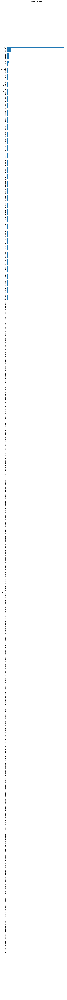

In [ ]:

feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 200))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(features_train_cat.columns)[sorted_idx])
plt.title('Feature Importance')


Text(0.5, 1.0, 'Feature Importance')

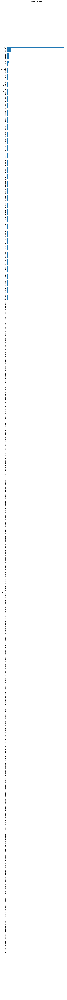

In [ ]:

feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 200))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(data_cat.columns)[sorted_idx])
plt.title('Feature Importance')


Text(0.5, 1.0, 'Feature Importance')

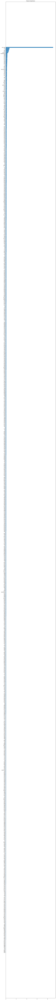

In [ ]:

feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 240))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(features_test_cat.columns)[sorted_idx])
plt.title('Feature Importance')


In [ ]:
# %%time

# model.fit(features_train_cat, target_train_cat, cat_features=CAT_COLS)
# print('время обучения модели')

0:	learn: 0.1597166	total: 3.11s	remaining: 2h 35m 18s
10:	learn: 0.1434510	total: 29.6s	remaining: 2h 14m 13s
20:	learn: 0.1314279	total: 55.5s	remaining: 2h 11m 9s
30:	learn: 0.1207842	total: 1m 21s	remaining: 2h 10m 50s
40:	learn: 0.1122583	total: 1m 47s	remaining: 2h 9m 15s
50:	learn: 0.1042085	total: 2m 13s	remaining: 2h 9m 5s
60:	learn: 0.0968462	total: 2m 40s	remaining: 2h 9m 9s
70:	learn: 0.0902077	total: 3m 8s	remaining: 2h 9m 18s
80:	learn: 0.0843998	total: 3m 35s	remaining: 2h 9m 23s
90:	learn: 0.0790278	total: 4m 1s	remaining: 2h 8m 48s
100:	learn: 0.0743541	total: 4m 27s	remaining: 2h 7m 58s
110:	learn: 0.0706950	total: 4m 52s	remaining: 2h 6m 52s
120:	learn: 0.0670983	total: 5m 18s	remaining: 2h 6m 28s
130:	learn: 0.0636265	total: 5m 45s	remaining: 2h 6m 8s
140:	learn: 0.0604447	total: 6m 13s	remaining: 2h 6m 20s
150:	learn: 0.0579634	total: 6m 40s	remaining: 2h 5m 58s
160:	learn: 0.0551611	total: 7m 7s	remaining: 2h 5m 39s
170:	learn: 0.0530890	total: 7m 33s	remaining: 2

In [ ]:
%%time
pred_valid = model.predict(features_valid_cat)
print('время предсказания')
result_cat2 = mean_absolute_error(target_valid_cat, pred_valid)
print("MAE cat на валидационной выборке:", result_cat2)

время предсказания
MAE cat на валидационной выборке: 0.14119206507333884
CPU times: user 136 ms, sys: 3.99 ms, total: 140 ms
Wall time: 109 ms


In [ ]:
x_train=features_train_cat
x_val=features_valid_cat
y_train=target_train_cat
y_val=target_valid_cat

In [ ]:
def baseline(data: pd.DataFrame, columns: list, cat_features: list, target: list, save=False):
    x_train, x_val, y_train, y_val = train_test_split(data[columns], data[target], random_state=RANDOM_STATE)
    pool_train = Pool(x_train, y_train, cat_features=cat_features)
    pool_val = Pool(x_val, y_val, cat_features=cat_features)
    model = CatBoostRegressor(loss_function='RMSE')
    model.fit(pool_train, eval_set=pool_val, verbose=False, early_stopping_rounds=20)
    res = model.predict(pool_val)
    y_val["pr"] = res
    y_val["diff"] = - y_val["pr"] + y_val["target"]
    r2 = r2_score(y_val["target"], y_val["pr"])
    rmse_score = np.sqrt(mean_squared_error(y_val["target"], y_val["pr"]))
    mape_score = 100*mean_absolute_percentage_error(y_val["target"], y_val["pr"])
    plt.plot(y_val["target"], y_val["diff"], "x")
    plt.title(f'Residuals\nR2 score: {r2:.3f}\n'
              f'RMSE score: {rmse_score:.2f}\n'
              f'RMSE to target median ratio: {rmse_score / y_val["target"].median():.2f}\n'
              f'MAPE score: {mape_score:.2f} %')
    plt.show()
    importances = model.feature_importances_
    importances = pd.Series(importances, index=columns).sort_values(ascending=False)
    importances.plot.bar()
    plt.title("Feature importances")
    plt.ylabel("Mean decrease in impurity")
    plt.show()
    if save:
        name = f'{str(data.shape[0] * data.shape[1])}_cat.joblib'
        joblib.dump(model, name)

In [ ]:
columns = data1.columns.drop(['target'])
target = ['target']
cat_features = [ 'location', 'emp_brand']
#text = ['description']

In [ ]:
baseline(data_cat, columns, cat_features, target)

KeyError: "['id', 'status', 'lead_source', 'manager', 'start_date', 'end_date', 'views', 'responses', 'job_title', 'salary_min', 'salary_max', 'mandatory', 'additional', 'comр_stages', 'work_conditions', 'language'] not in index"

время предсказания
MAE cat на валидационной выборке: 0.14550133866301082
CPU times: user 1.33 s, sys: 21.9 ms, total: 1.35 s
Wall time: 2.6 s

In [ ]:
# %%time
# pred_valid = model.predict(features_valid_cat)
# print('время предсказания')
# result_cat2 = mean_squared_error(target_valid_cat, pred_valid)**0.5
# print("RMSE cat на валидационной выборке:", result_cat2)

время предсказания
RMSE cat на валидационной выборке: 0.17382644562546737
CPU times: user 180 ms, sys: 1.85 ms, total: 182 ms
Wall time: 150 ms


**проба на новом датасете выборка 1300 c признаком "test_task"** время предсказания
RMSE cat на валидационной выборке: 0.17382644562546737
CPU times: user 180 ms, sys: 1.85 ms, total: 182 ms
Wall time: 150 ms

**проба на новом датасете выборка 1200 c признаком "test_task"**
время предсказания
RMSE cat на валидационной выборке: 0.19131014224167214
CPU times: user 2.45 s, sys: 29.9 ms, total: 2.48 s
Wall time: 2.5 s

**проба на новом датасете выборка 1200 без признака "test_task"**
время предсказания
RMSE cat на валидационной выборке: 0.20539641877333434
CPU times: user 132 ms, sys: 2.86 ms, total: 135 ms
Wall time: 150 ms

**Результаты пробы с features(7), target(7)**: время предсказания
RMSE cat на валидационной выборке: 0.2156714144577139
CPU times: user 137 ms, sys: 3.97 ms, total: 141 ms
Wall time: 168 ms

**Результаты пробы с features(5), target(5), выборка 1000 строк**: время предсказания
RMSE cat на валидационной выборке: 0.20272337555167305
CPU times: user 126 ms, sys: 1.99 ms, total: 128 ms
Wall time: 105 ms

**Для пробы с датасетом без восстановленного 'additional':**  время предсказания
RMSE cat на валидационной выборке: 0.20400419752126417
CPU times: user 118 ms, sys: 1.03 ms, total: 119 ms
Wall time: 92 ms

In [ ]:
%%time
pred_test = model.predict(features_test_cat)
print('время предсказания')
result_cat_test = mean_absolute_error(target_test_cat, pred_test)
print("MAE cat на тестовой выборке:", result_cat_test)

время предсказания
MAE cat на тестовой выборке: 0.14541283723378035
CPU times: user 128 ms, sys: 3.92 ms, total: 131 ms
Wall time: 98.7 ms


время предсказания
MAE cat на тестовой выборке: 0.16601436101836106
CPU times: user 92.1 ms, sys: 5 µs, total: 92.1 ms
Wall time: 101 ms

In [ ]:
%%time
pred_test = model.predict(features_test_cat)
print('время предсказания')
result_cat_test = mean_squared_error(target_test_cat, pred_test)**0.5
print("RMSE cat на тестовой выборке:", result_cat_test)

время предсказания
RMSE cat на тестовой выборке: 0.17890394347079241
CPU times: user 97.5 ms, sys: 8.67 ms, total: 106 ms
Wall time: 87.8 ms


**проба на новом датасете выборка 1300 c признаком "test_task"** время предсказания
RMSE cat на тестовой выборке: 0.18587973385119272
CPU times: user 128 ms, sys: 19.7 ms, total: 148 ms
Wall time: 126 ms

**проба на новом датасете выборка 1200 c признаком "test_task"**
время предсказания
RMSE cat на тестовой выборке: 0.1738418358504777
CPU times: user 137 ms, sys: 2.05 ms, total: 139 ms
Wall time: 108 ms

**проба на новом датасете выборка 1200 без признака "test_task"**
время предсказания
RMSE cat на тестовой выборке: 0.1850363430216534
CPU times: user 120 ms, sys: 1.08 ms, total: 121 ms
Wall time: 94.3 ms

**Результаты пробы с features(7), target(7)**: время предсказания
RMSE cat на тестовой выборке: 0.2062288707819595
CPU times: user 119 ms, sys: 2.92 ms, total: 122 ms
Wall time: 95.8 ms

**Результаты пробы с features(5), target(5), выборка 1000 строк**: время предсказания
RMSE cat на тестовой выборке: 0.18197329527272652
CPU times: user 103 ms, sys: 1 ms, total: 104 ms
Wall time: 80.6 ms

**Для пробы с датасетом без восстановленного 'additional'**: время предсказания
RMSE cat на тестовой выборке: 0.1781597951395477
CPU times: user 146 ms, sys: 4.69 ms, total: 151 ms
Wall time: 181 ms

**Выводы по разделу**: Наилучшую метрику (0.17 RMSE) дает модель Catboost: она позволяет комбинировать embeddings и категориальные признаки. Есть основания предположить, что при увеличении датасета метрика может улучшиться.

# Общие выводы про проекту


**Примечание:** Исследование было сосредоточено только на той части данных датасета, которые имеют влияние на реакцию кандидата на вакансию. Фактически на подробностях того, какая именно публикация вакансии эффективна.   Остальные признаки бизнес-процессa (менеджер, источник лида итд.) - не вошли в это исследование. Часть, которая осталась за скобками несомненно очень важная. Эти признаки бизнес-процессa могут очень существенно влиять и на скорость закрытия вакансии, но они заслуживают отдельного рассмотрения. Наилучшие прогностические возможности были достигнуты и помощью предобученной LLM Bert и дальнейшей обработки данных c помощью CatBoost

**С помощью машинного обучения, построена модель, способная предсказывать метрику конверсии (просмотров в отклики), т.е. практически предсказывать какому процентy кандидатов понравится вакансия.**